# <span style='color:SteelBlue'>P6 - Segmentez des clients d'un site e-commerce</span>

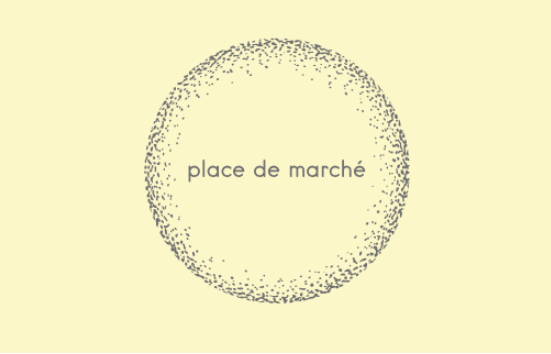

# <span class='bg-primary'>P6_02 - IMAGES - Données Images</span>

# <span class='bg-primary'>P6_02_02 - CNN - COMBINAISON TEXTES + IMAGES</span>

## <span style='background:Thistle'>Sommaire du notebook</span> 

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

Ce Notebook traite les images avec les applications Keras CNN Transfert learning avec classification non supervisée.

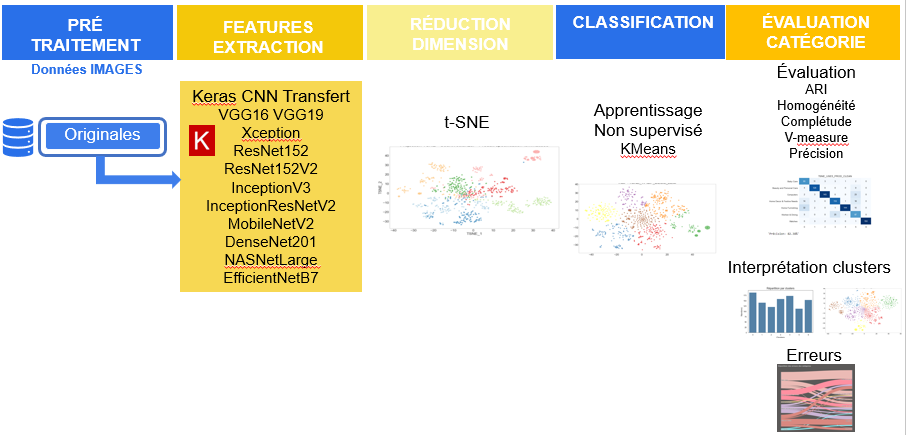

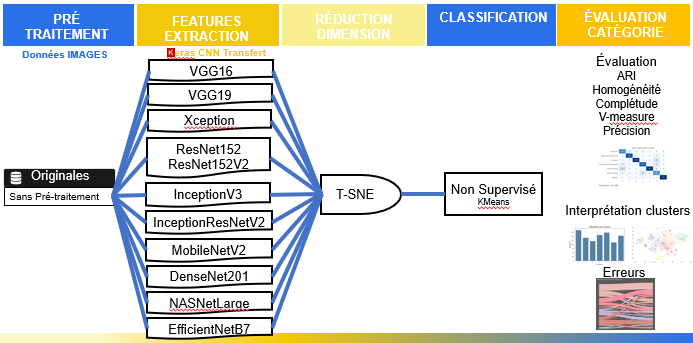

## <span style='background:Thistle'>1. Introduction</span>

**Mission**
*****
Réaliser une première **étude de faisabilité** d'un moteur de **classification d'articles** basé sur une **image et une description** pour l'**automatisation** de l'attribution de la **catégorie de l'article**.

**Objectifs**
*****
- analyser le jeu de données,
- réaliser :
    - un prétraitement des images,
    - un prétraitement des descriptions des produits
    - une réduction de dimension, 
    - puis un clustering. 

La représentation graphique aidera à convaincre que cette approche de modélisation permettra bien de regrouper des produits de même catégorie.

**Contraintes**
***
Afin d’extraire les features, mettre en œuvre a minima un algorithme de type SIFT / ORB / SURF (un algorithme de type CNN Transfer Learning peut éventuellement être utilisé en complément, s’il peut apporter un éclairage supplémentaire à la démonstration).

**Sources**
*****
- [Jeu de données](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/Parcours_data_scientist/Projet+-+Textimage+DAS+V2/Dataset+projet+pre%CC%81traitement+textes+images.zip)

In [3]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import jyquickhelper
import numpy as np
import pandas as pd
import os
import pickle
from IPython.core.display import display, HTML
import matplotlib.pyplot as plt
import seaborn as sns
import outils_data
import outils_images
import outils_segmentation
import outils_nlp
# Réduction dimension
from sklearn.manifold import TSNE
# Clustering
from sklearn.cluster import KMeans
# CNN Applications Keras
import keras
from keras.preprocessing import image
import tensorflow as tf
# LDA, NMF
from sklearn.decomposition import NMF, LatentDirichletAllocation

# Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Keras                 : ' + keras.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('Outils images         : ' + outils_images.__version__)
print('Outils segmentation   : ' + outils_segmentation.__version__)
print('Outils NLP            : ' + outils_nlp.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
jyquickhelper         : 0.4.220
Python                : 3.8.8 (default, Feb 24 2021, 15:54:32) [MSC v.1928 64 bit (AMD64)]
NumPy                 : 1.19.5
Pandas                : 1.2.4
Keras                 : 2.4.3
Outils dataframe      : 0.0.2
Outils images         : 0.0.0
Outils segmentation   : 0.0.0
Outils NLP            : 0.0.0
Lancé le           : 2021-06-30T10:51:53.763735


In [4]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 5,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:Thistle'>2. Jeu de données</span>

### <span style='background:PowderBlue'>2.1. Chargement du jeu de données</span>

In [5]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21

In [6]:
# Chargement du jeu de données
data_all = pd.read_csv('data/flipkart_com-ecommerce_sample_1050.csv')

In [32]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data_all.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1050 lignes et 15 variables.


In [33]:
data_all.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}"
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""Ideal For"", ""value""=>""Men, Women, Boys, Girls""}, {""key""=>""Model ID"", ""value""=>""asvtwl322""}, {""key""=>""Color"", ""value""=>""Red, Yellow, Blue""}, {""key""=>""Size"", ""value""=>""Mediam""}, {""key""=>""Length"", ""value""=>""30 inch""}, {""key""=>""Width"", ""value""=>""60 inch""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""3""}, {""key""=>""Sales Package"", ""value""=>""3 Bath Towel""}]}"


### <span style='background:PowderBlue'>2.2. Préparation du dataframe de travail pour le traitement des images</span>

**image_loc**

- La variable '**image**' est constituée de la concaténation du e l'identifiant unique (ex : 02127f52e96fb72c66bf081d25104ef8) suivi de '.jpg' : **02127f52e96fb72c66bf081d25104ef8.jpg**.
- Ajout d'une nouvelle variable **image_loc** contenant le chemin du répertoire de stockage des images ainsi que du nom du fichier image pour des appels moins verbeux dans le code.

In [7]:
# Ajout variable image_loc
# ex : data/Images/02127f52e96fb72c66bf081d25104ef8.jpg
path = 'data/Images/'
data_all['image_loc'] = [path + row for row in data_all['image']]

**Récupération de la première sous-catégorie**

In [8]:
# Découpe les sous-catégories dans des nouvelles variables du dataframe
work = data_all['product_category_tree'].str.split(' >> ', expand=True)
data_all['Categorie_1'] = work[0]
# Nettoye les [" et "]
data_all.replace('\\["', '', regex=True, inplace=True)
data_all.replace('"\\]', '', regex=True, inplace=True)

**Redimensionnement des images en 224*224 pour les entrées des CNN**

In [9]:
# Redimensionnement des images en 224*224 pour les entrées des CNN
data_all['image_redim'] = data_all['image_loc'] \
    .apply(outils_images.cnn_redimensionner_image)

**Dataframe de travail pour le traitement des images**

- Pour effectuer la classification des catégories en fonction des images, nous garderons :
    - [x] **image** : le nom de l'image,
    - [x] **image_loc** : le nom de l'image avec sa localisation dans le répertoire de stockage des images,
    - [x] **Categorie_1** : la première sous-catégorie.

In [15]:
data = data_all.copy()
data = data[['image', 'image_loc', 'image_redim', 'Categorie_1', ]]
data.head(3)

,image,image_loc,image_redim,Categorie_1
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images_redim/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,data/Images_redim/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,data/Images_redim/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care


## <span style='background:Thistle'>3. CNN - Convolution Neural Network</span>

- Les réseaux de neurones convolutifs ont une méthodologie similaire à celle des méthodes traditionnelles d'apprentissage supervisé : ils reçoivent des images en entrée, détectent les features de chacune d'entre elles, puis entraînent un classifieur dessus.
- Les CNN réalisent eux-mêmes tout le boulot fastidieux d'extraction et description de features : lors de la phase d'entraînement, l'erreur de classification est minimisée afin d'optimiser les paramètres du classifieur ET les features.
[Source openclassrooms]


- Pour les application Keras : [Source](https://keras.io/api/applications/)

### <span style='background:PowderBlue'>3.1. VGG16</span>

- VGG-16 est une version du réseau de neurones convolutif VGG-Net.
- VGG-16 est constitué de plusieurs couches, dont 13 couches de convolution et 3 fully-connected. Il doit donc apprendre les poids de 16 couches.
- Il prend en entrée une image en couleurs de taille 224  × 224 px et la classifie dans une des 1000 classes. Il renvoie donc un vecteur de taille 1000, qui contient les probabilités d'appartenance à chacune des classes. 
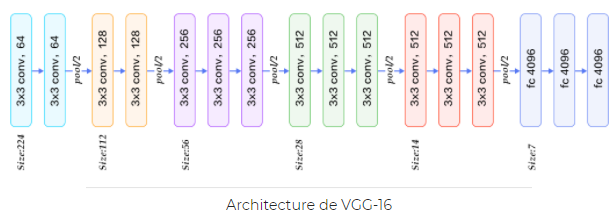
[Source : Openclassrooms]

**Utilisation de VGG16 pré-entraîné sur ImageNet**

- Utilisation du modèle VGG16 pré-entraîné sur ImageNet (ImageNet est un projet de recherche visant à développer une grande base de données d'images avec des annotations, c'est-à-dire des images et leurs descriptions).

[Source](https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/)

**ÉTAPE 1 - Chargement des images, extraction des features**

In [25]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine
# VGG16 imports
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

# Liste
vgg16_all_features = []

# Instanciation du modèle
model_vgg16 = VGG16(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    vgg16_feature = model_vgg16.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    vgg16_all_features.append(np.array(vgg16_feature).flatten())

vgg16_all_features = np.array(vgg16_all_features)

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [26]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
data['vgg16_bovw'] = [vgg16_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_vgg16_bovw = data[['image', 'image_loc', 'Categorie_1', 'vgg16_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

In [27]:
# Sauvegarde du dataframe des vectors BOVW VGG16
with open('sauvegarde/df_vgg16_vectors.pickle', 'wb') as f:
    pickle.dump(df_vgg16_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [28]:
type_donnee = 'TSNE_VGG16'

In [84]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_vgg16 = list()
tsne_results_vgg16 = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_vgg16 = \
        tsne.fit_transform(df_vgg16_vectors)
    results_vgg16.append(tsne_results_vgg16)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.828s...
[t-SNE] Computed neighbors for 1050 samples in 46.544s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 421.096597
[t-SNE] KL divergence after 250 iterations with early exaggeration: 127.083687
[t-SNE] KL divergence after 500 iterations: 2.097158
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.715s...
[t-SNE] Computed neighbors for 1050 samples in 45.993s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 445.960813
[t-SNE] KL divergence after 250 iterations with early exaggeration: 114.477966
[t-SNE] KL divergence after 500 iterations: 1.926718
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.738s...
[t-SNE] Computed neighbors for 1050 sampl

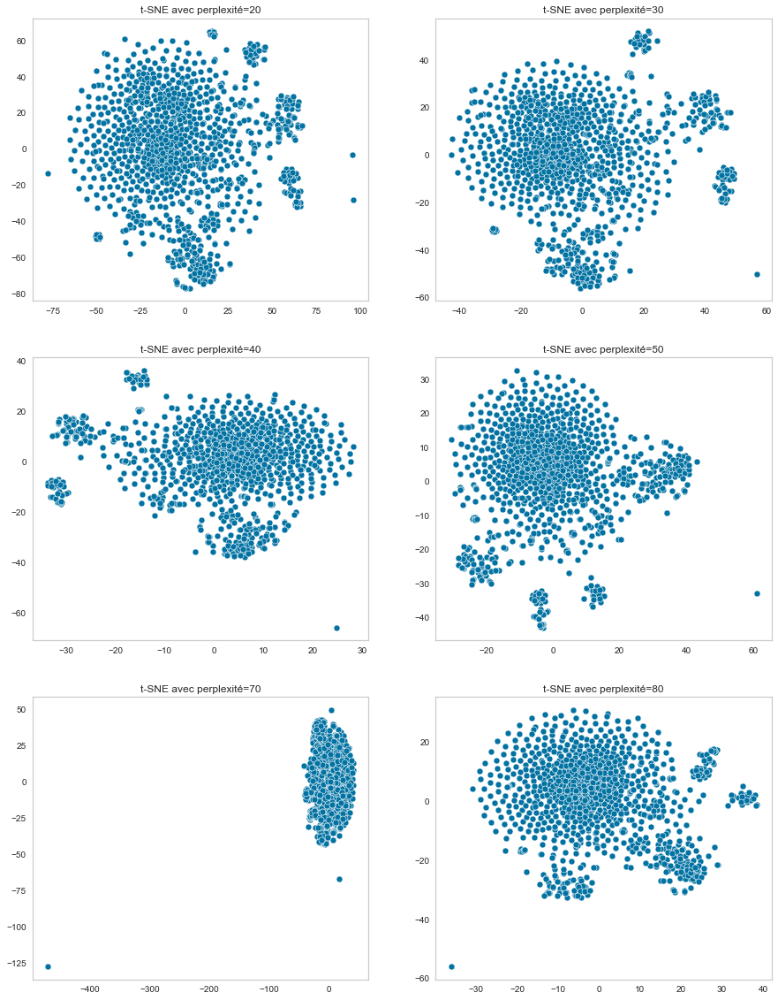

In [88]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_vgg16, liste_param, 1)

- groupes plus homogènes pour perplexité=80
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [29]:
%pycodestyle_off

In [30]:
# Réduction de dimension tsne
tsne_vgg16 = TSNE(verbose=1, perplexity=40, n_iter=5000)
X_proj_tsne_vgg16 = \
    tsne_vgg16.fit_transform(df_vgg16_vectors)
# Dataframe pour clustering
df_tsne_vgg16 = pd.DataFrame({'VAR1' : X_proj_tsne_vgg16[:, 0],
                              'VAR2' : X_proj_tsne_vgg16[:, 1],
                              'CATEGORIE' : df_vgg16_bovw['Categorie_1'],
                              'IMAGE': df_vgg16_bovw['image'],
                              'IMAGE_LOC': df_vgg16_bovw['image_loc']})

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.707s...
[t-SNE] Computed neighbors for 1050 samples in 46.160s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 463.647630
[t-SNE] KL divergence after 250 iterations with early exaggeration: 123.093559
[t-SNE] KL divergence after 4750 iterations: 1.719242


In [31]:
%pycodestyle_on

**Clustering**

In [32]:
cols = ['VAR1', 'VAR2']

In [11]:
# Chargement des dataframes de sauvegarde des scores
df_scores = pd.read_csv('IMAGES_data_df_scores.csv')
# Suppression de l'entête des objets
df_scores.drop(0, 0, inplace=True)

In [12]:
# Chargement des dataframes de sauvegarde des précisions
df_precision = pd.read_csv('IMAGES_data_df_precision.csv')
# Suppression de l'entête des objets
df_precision.drop(0, 0, inplace=True)

In [13]:
# Chargement des dataframes de sauvegarde des métriques de clustering
df_metrics_clust = pd.read_csv('IMAGES_data_kmeans_metrics.csv')
# Suppression de l'entête des objets
df_metrics_clust.drop(0, 0, inplace=True)

In [98]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_vgg16[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_VGG16,nan,36371.25000,0.04686,10.00000,200.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25000,0.05337,10.00000,300.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25391,0.05585,10.00000,500.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25000,0.07029,10.00000,100.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25000,0.08163,10.00000,400.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25000,0.11370,20.00000,300.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25391,0.11370,20.00000,500.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25000,0.11469,20.00000,400.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25000,0.11469,20.00000,100.00000,0.39266,0.69493
TSNE_VGG16,nan,36371.25391,0.11569,20.00000,200.00000,0.39266,0.69493


In [99]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_vgg16 = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=200,
                           random_state=seed) \
    .fit(df_tsne_vgg16[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_vgg16['Clusters'] = kmeans_tsne_vgg16.labels_
kmeans_tsne_vgg16_labels = kmeans_tsne_vgg16.labels_

In [100]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_vgg16,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_VGG16,0.34585,0.43826,0.49340,0.46420


In [101]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,149,14.19000
1,313,29.81000
2,142,13.52000
3,1,0.10000
4,107,10.19000
5,133,12.67000
6,205,19.52000


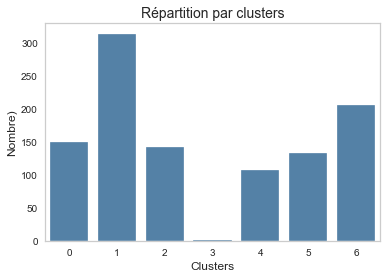

In [102]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_vgg16_labels)

In [103]:
# Les catégories par clusters
df_tsne_vgg16.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Watches                           141
         Computers                           4
         Home Decor & Festive Needs          2
         Kitchen & Dining                    2
1        Computers                         115
         Home Decor & Festive Needs         74
         Kitchen & Dining                   43
         Beauty and Personal Care           32
         Baby Care                          26
         Home Furnishing                    15
         Watches                             8
2        Baby Care                          47
         Home Decor & Festive Needs         40
         Home Furnishing                    36
         Computers                          17
         Kitchen & Dining                    1
         Watches                             1
3        Home Furnishing                     1
4        Kitchen & Dining                   99
         Beauty and Personal Care            3
         Baby Care                           2
         Computers                           2
         Home Decor & Festive Needs          1
5        Beauty and Personal Care          105
         Home Decor & Festive Needs         10
         Computers                           9
         Baby Care                           5
         Kitchen & Dining                    4
6        Home Furnishing                    98
         Baby Care                          70
         Home Decor & Festive Needs         23
         Beauty and Personal Care           10
         Computers                           3
         Kitchen & Dining                    1

**Visualisation des clusters**

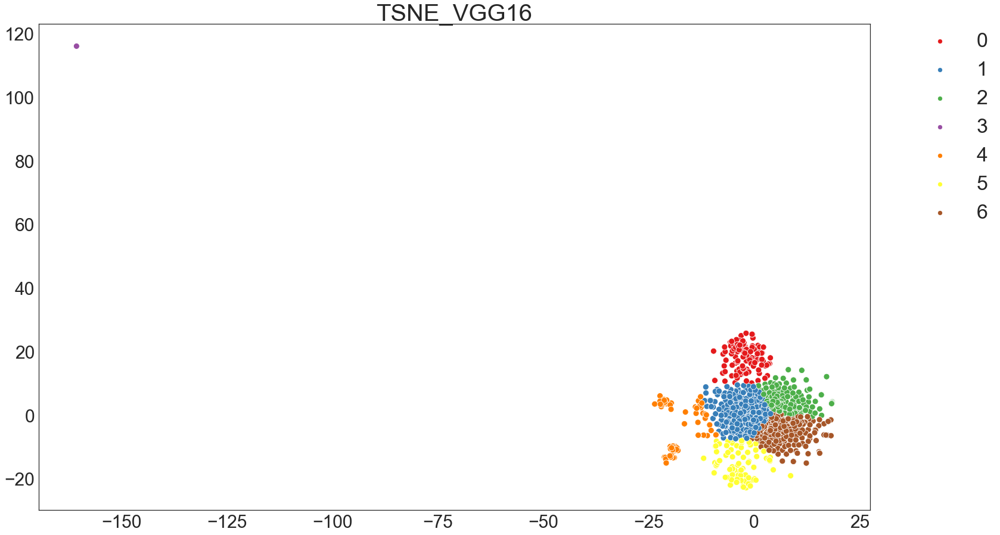

In [104]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_vgg16,
                                           kmeans_tsne_vgg16_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est  (0.35).
- Cette combinaison TSNE VGG16 sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 
- Il manque la catégorie 'Home Decor & Festive Needs'. 

**Qualité de la catégorisation ?**

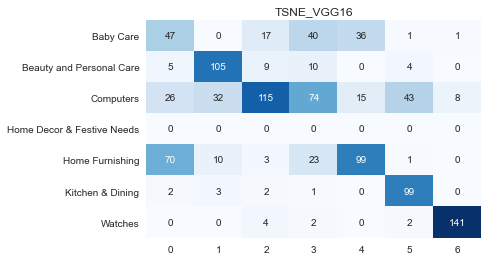

'Précision: 57.71%'

                            precision    recall  f1-score   support

                 Baby Care       0.31      0.33      0.32       142
  Beauty and Personal Care       0.70      0.79      0.74       133
                 Computers       0.77      0.37      0.50       313
Home Decor & Festive Needs       0.00      0.00      0.00         0
           Home Furnishing       0.66      0.48      0.56       206
          Kitchen & Dining       0.66      0.93      0.77       107
                   Watches       0.94      0.95      0.94       149

                  accuracy                           0.58      1050
                 macro avg       0.58      0.55      0.55      1050
              weighted avg       0.69      0.58      0.61      1050


In [105]:
dico_categories = {'0': 'Watches',
                   '1': 'Computers',
                   '2': 'Baby Care',
                   '3': 'Home Furnishing',
                   '4': 'Kitchen & Dining',
                   '5': 'Beauty and Personal Care',
                   '6': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_vgg16,
                                          dico_categories, type_donnee)

In [106]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '58',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [107]:
# Nombre d'erreur
mask = df_tsne_vgg16['CATEGORIE'] == df_tsne_vgg16['Cluster_labels']
df_erreur_vgg16 = df_tsne_vgg16[~mask]
display(f'Nombre d\'erreurs : {df_erreur_vgg16.shape[0]}')

"Nombre d'erreurs : 444"

**Répartition des erreurs par catégorie**

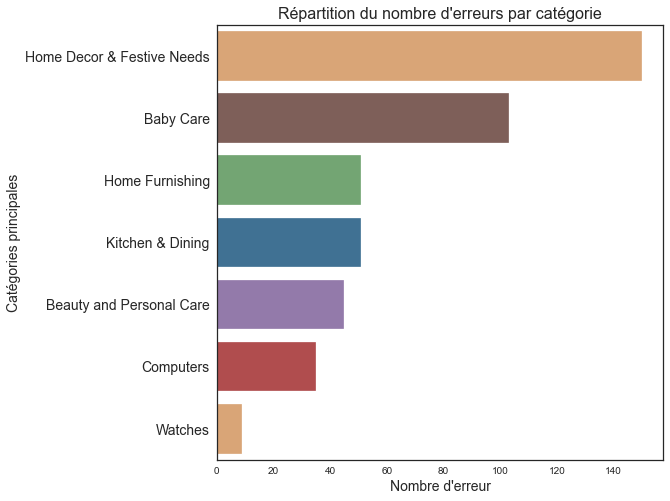

In [108]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_vgg16, orient='h',
              order=df_erreur_vgg16['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

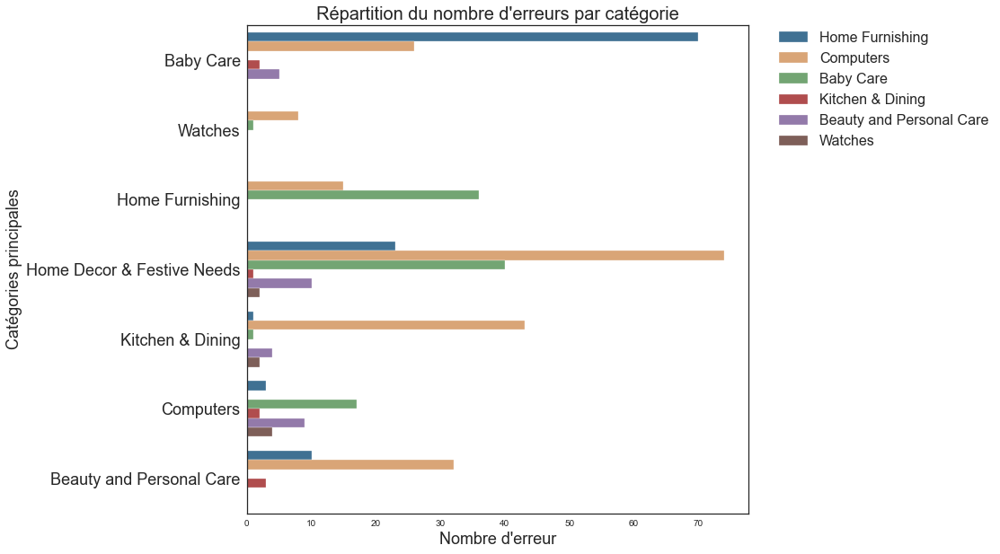

In [109]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_vgg16, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [110]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [115]:
df_visu_erreur_vgg16 = df_erreur_vgg16[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_vgg16.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
200,Home Decor & Festive Needs,,Computers
789,Baby Care,,Home Furnishing
1018,Computers,,Baby Care
979,Baby Care,,Computers
672,Baby Care,,Computers
917,Home Decor & Festive Needs,,Computers
631,Baby Care,,Computers
1030,Beauty and Personal Care,,Computers
608,Beauty and Personal Care,,Home Furnishing
80,Home Decor & Festive Needs,,Baby Care


### <span style='background:PowderBlue'>3.2. VGG19</span>

- Le modèle VGG19 est un réseau neuronal convolutif dont la profondeur est de 19 couches. Il a été construit et entraîné par K. Simonyan et A. Zisserman à l'université d'Oxford en 2014. 
- Le réseau VGG-19 est entraîné en utilisant plus d'un million d'images de la base de données ImageNet. Il a été entraîné sur des images colorées de 224x224 pixels. Naturellement, vous pouvez importer le modèle avec les poids formés par ImageNet. 
- Ce réseau pré-entraîné peut classifier jusqu'à 1000 objets.
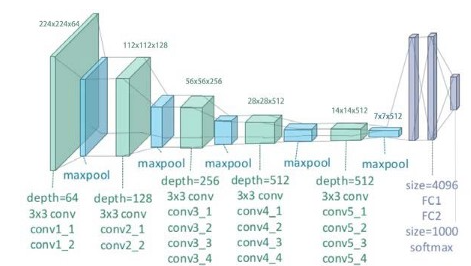
[Source](https://towardsdatascience.com/how-to-use-a-pre-trained-model-vgg-for-image-classification-8dd7c4a4a517)

**Utilisation de VGG19 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [117]:
# Utilisation de VGG19 pré-entraîné sur ImageNet avec les images d'origine
# VGG19 imports
from keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications import VGG19

# Liste
vgg19_all_features = []

# Instanciation du modèle
model_vgg19 = VGG19(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_vgg19.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    vgg19_feature = model_vgg19.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    vgg19_all_features.append(np.array(vgg19_feature).flatten())

vgg19_all_features = np.array(vgg19_all_features)

80142336/80134624 [==============================] - 16s 0us/step
Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_____________________________________________________________

In [118]:
# Dataframe de sauvegarde des BOVW VGG19
# Association des features à chaque image
data['vgg19_bovw'] = [vgg19_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_vgg19_bovw = data[['image', 'image_loc', 'Categorie_1', 'vgg19_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG19
df_vgg19_vectors = pd.DataFrame.from_records(vgg19_all_features)

In [119]:
# Sauvegarde du dataframe des vectors BOVW VGG19
with open('sauvegarde/df_vgg19_vectors.pickle', 'wb') as f:
    pickle.dump(df_vgg19_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [120]:
type_donnee = 'TSNE_VGG19'

In [121]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_vgg19 = list()
tsne_results_vgg19 = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_vgg19 = \
        tsne.fit_transform(df_vgg19_vectors)
    results_vgg19.append(tsne_results_vgg19)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.675s...
[t-SNE] Computed neighbors for 1050 samples in 45.357s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 394.904419
[t-SNE] KL divergence after 250 iterations with early exaggeration: 114.466019
[t-SNE] KL divergence after 500 iterations: 2.002206
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.678s...
[t-SNE] Computed neighbors for 1050 samples in 45.473s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 425.953453
[t-SNE] KL divergence after 250 iterations with early exaggeration: 117.438889
[t-SNE] KL divergence after 500 iterations: 1.902612
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.652s...
[t-SNE] Computed neighbors for 1050 sampl

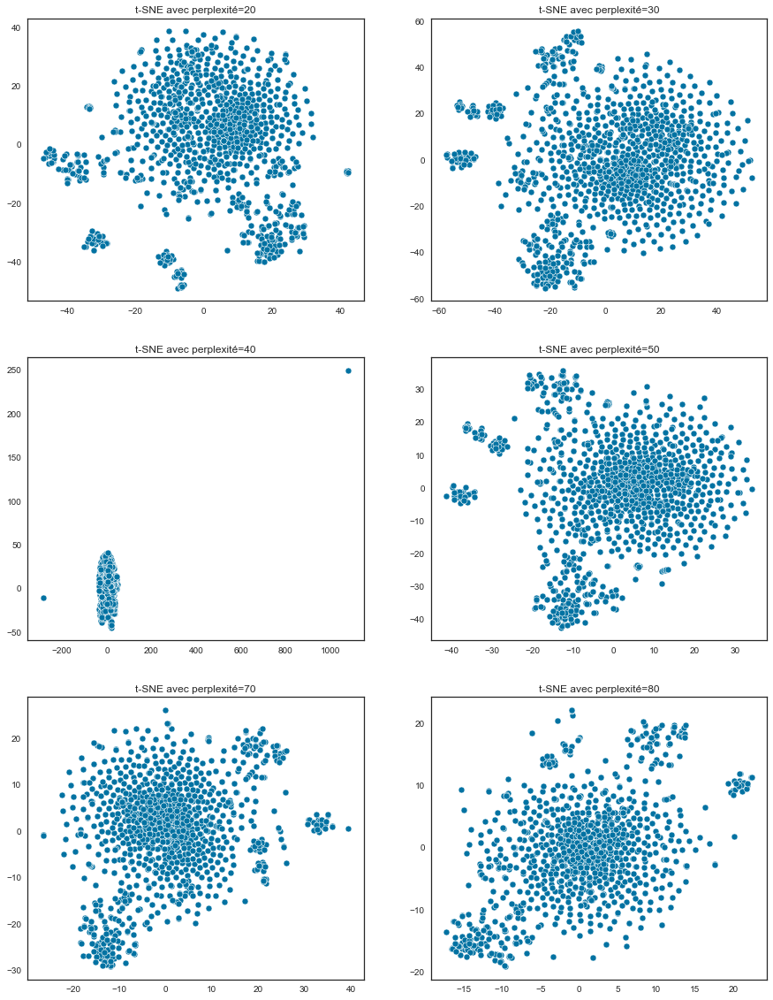

In [122]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_vgg19, liste_param, 1)

- groupes plus homogènes pour perplexité=80
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [127]:
%pycodestyle_off

In [128]:
# Réduction de dimension tsne
tsne_vgg19 = TSNE(verbose=1, perplexity=80, n_iter=5000)
X_proj_tsne_vgg19 = \
    tsne_vgg19.fit_transform(df_vgg19_vectors)
# Dataframe pour clustering
df_tsne_vgg19 = pd.DataFrame({'VAR1' : X_proj_tsne_vgg19[:, 0],
                              'VAR2' : X_proj_tsne_vgg19[:, 1],
                              'CATEGORIE' : df_vgg19_bovw['Categorie_1'],
                              'IMAGE': df_vgg19_bovw['image'],
                              'IMAGE_LOC': df_vgg19_bovw['image_loc']})

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 1050 samples in 4.691s...
[t-SNE] Computed neighbors for 1050 samples in 45.400s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 499.668969
[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.248833
[t-SNE] KL divergence after 3800 iterations: 1.350565


In [129]:
%pycodestyle_on

**Clustering**

In [130]:
cols = ['VAR1', 'VAR2']

In [131]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_vgg19[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_VGG19,nan,6979.99951,0.05237,10.00000,400.00000,0.40699,0.78830
TSNE_VGG19,nan,6980.00000,0.05280,10.00000,300.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.06248,10.00000,500.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.06493,10.00000,100.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.06899,10.00000,200.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.11585,20.00000,100.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.12033,20.00000,500.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.12707,20.00000,200.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.12798,20.00000,300.00000,0.40699,0.78830
TSNE_VGG19,nan,6979.99951,0.13148,20.00000,400.00000,0.40699,0.78830


In [132]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_vgg19 = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=400,
                           random_state=seed) \
    .fit(df_tsne_vgg19[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_vgg19['Clusters'] = kmeans_tsne_vgg19.labels_
kmeans_tsne_vgg19_labels = kmeans_tsne_vgg19.labels_

In [133]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_vgg19,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_VGG19,0.30495,0.40803,0.43582,0.42147


In [134]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,74,7.05000
1,319,30.38000
2,96,9.14000
3,84,8.00000
4,149,14.19000
5,193,18.38000
6,135,12.86000


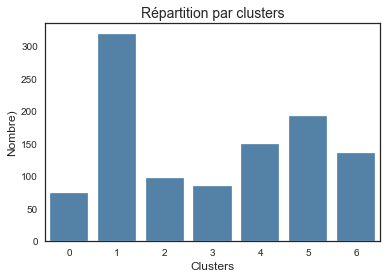

In [135]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_vgg19_labels)

In [136]:
# Les catégories par clusters
df_tsne_vgg19.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Kitchen & Dining                   40
         Beauty and Personal Care           17
         Computers                           8
         Home Furnishing                     4
         Baby Care                           2
         Home Decor & Festive Needs          2
         Watches                             1
1        Computers                         121
         Home Decor & Festive Needs         56
         Home Furnishing                    35
         Baby Care                          34
         Beauty and Personal Care           34
         Kitchen & Dining                   27
         Watches                            12
2        Kitchen & Dining                   73
         Home Decor & Festive Needs          9
         Home Furnishing                     5
         Beauty and Personal Care            3
         Computers                           3
         Baby Care                           2
         Watches                             1
3        Beauty and Personal Care           75
         Baby Care                           3
         Kitchen & Dining                    3
         Home Decor & Festive Needs          2
         Computers                           1
4        Home Decor & Festive Needs         73
         Home Furnishing                    22
         Baby Care                          17
         Computers                          17
         Beauty and Personal Care           11
         Kitchen & Dining                    6
         Watches                             3
5        Baby Care                          92
         Home Furnishing                    84
         Beauty and Personal Care           10
         Home Decor & Festive Needs          6
         Kitchen & Dining                    1
6        Watches                           133
         Home Decor & Festive Needs          2

**Visualisation des clusters**

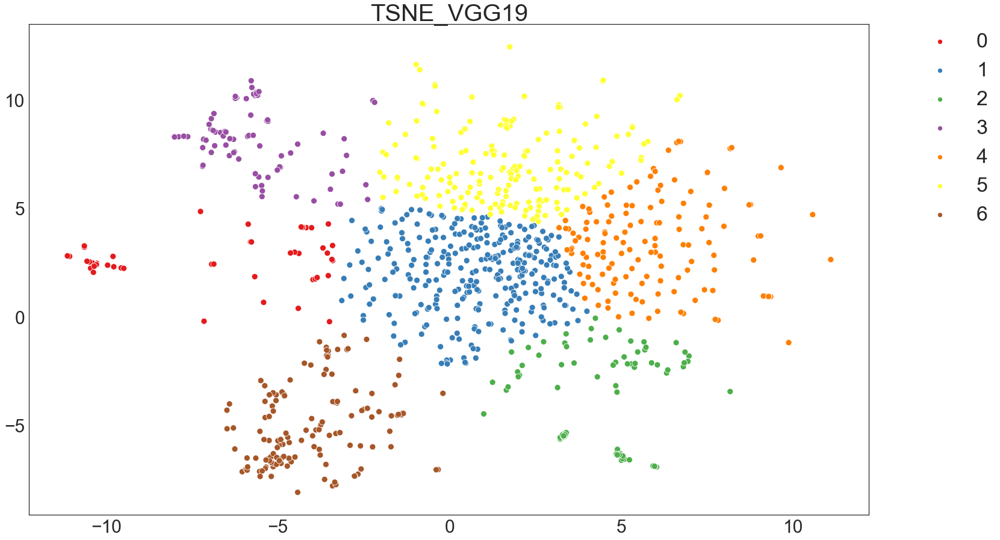

In [137]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_vgg19,
                                           kmeans_tsne_vgg19_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est moyen (0.305).
- Cette combinaison TSNE VGG19 sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 
- Il manque la catégorie 'Home Decor & Festive Needs'. 

**Qualité de la catégorisation ?**

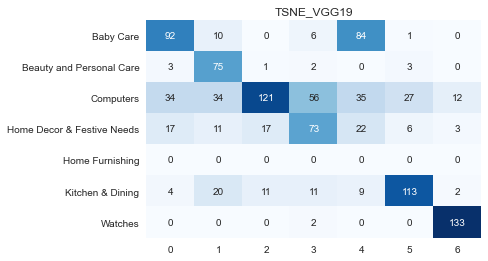

'Précision: 57.81%'

                            precision    recall  f1-score   support

                 Baby Care       0.61      0.48      0.54       193
  Beauty and Personal Care       0.50      0.89      0.64        84
                 Computers       0.81      0.38      0.52       319
Home Decor & Festive Needs       0.49      0.49      0.49       149
           Home Furnishing       0.00      0.00      0.00         0
          Kitchen & Dining       0.75      0.66      0.71       170
                   Watches       0.89      0.99      0.93       135

                  accuracy                           0.58      1050
                 macro avg       0.58      0.56      0.55      1050
              weighted avg       0.70      0.58      0.61      1050


In [138]:
dico_categories = {'0': 'Kitchen & Dining',
                   '1': 'Computers',
                   '2': 'Kitchen & Dining',
                   '3': 'Beauty and Personal Care',
                   '4': 'Home Decor & Festive Needs',
                   '5': 'Baby Care',
                   '6': 'Watches'}
outils_nlp.affiche_qualite_categorisation(df_tsne_vgg19,
                                          dico_categories, type_donnee)

In [139]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '58',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [140]:
# Nombre d'erreur
mask = df_tsne_vgg19['CATEGORIE'] == df_tsne_vgg19['Cluster_labels']
df_erreur_vgg19 = df_tsne_vgg19[~mask]
display(f'Nombre d\'erreurs : {df_erreur_vgg19.shape[0]}')

"Nombre d'erreurs : 443"

**Répartition des erreurs par catégorie**

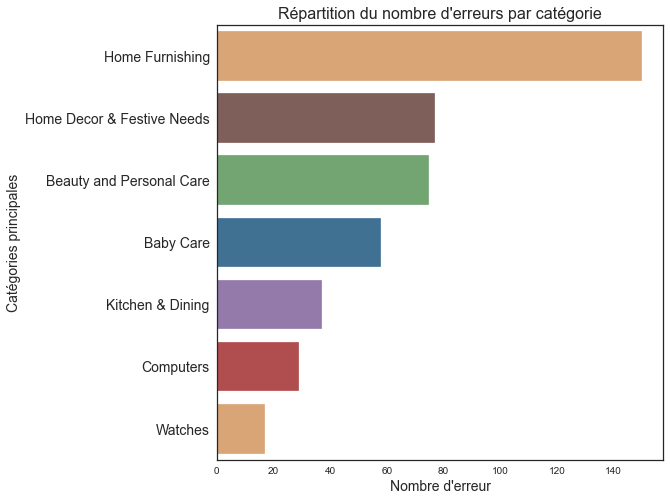

In [141]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_vgg19, orient='h',
              order=df_erreur_vgg19['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

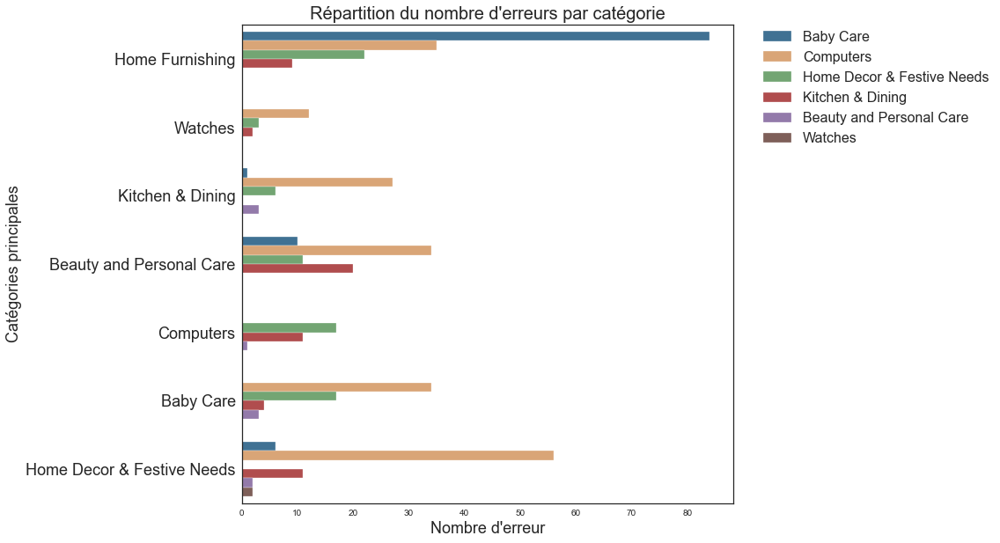

In [142]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_vgg19, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [143]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [148]:
df_visu_erreur_vgg19 = df_erreur_vgg19[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_vgg19.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
451,Home Furnishing,,Baby Care
700,Home Furnishing,,Computers
114,Baby Care,,Home Decor & Festive Needs
817,Home Furnishing,,Kitchen & Dining
939,Home Furnishing,,Computers
869,Home Furnishing,,Computers
1044,Baby Care,,Computers
941,Home Furnishing,,Home Decor & Festive Needs
1006,Beauty and Personal Care,,Computers
474,Kitchen & Dining,,Computers


### <span style='background:PowderBlue'>3.3. Xception</span>

- **Xception** créé par Google en 2017 signifie 'version extrême d'Inception' et constitue une modification de Inception. 
- Avec une convolution séparable en profondeur modifiée, elle est même meilleure qu'Inception-v3 (également par Google, 1er prix à l'ILSVRC 2015) pour les jeux de données ImageNet ILSVRC et JFT.
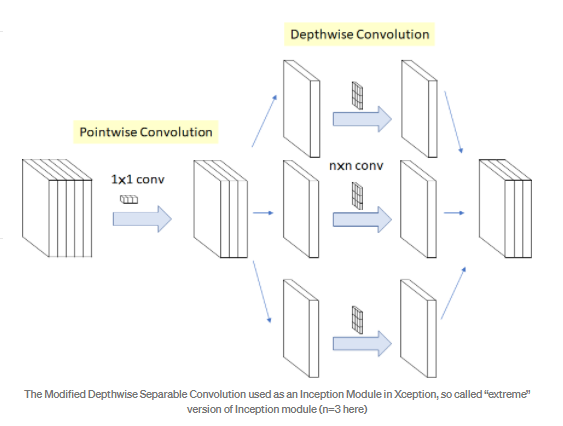
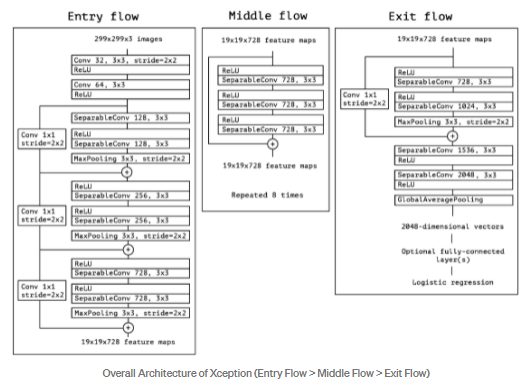
- Francois Chollet : *Nous présentons une interprétation des modules d'Inception dans les réseaux de neurones convolutifs comme étant une étape intermédiaire entre la convolution régulière et l'opération de convolution séparable en profondeur (une convolution en profondeur suivie d'une convolution ponctuelle). Dans cette optique, une convolution séparable en profondeur peut être comprise comme un module d'Inception avec un nombre maximal de tours. Cette observation nous amène à proposer une nouvelle architecture de réseau de neurones convolutifs profonds inspirée d'Inception, où les modules d'Inception ont été remplacés par des convolutions séparables en profondeur. Nous montrons que cette architecture, baptisée Xception, surpasse légèrement Inception V3 sur le jeu de données ImageNet (pour lequel Inception V3 a été conçu), et surpasse significativement Inception V3 sur un jeu de données de classification d'images plus important comprenant 350 millions d'images et 17 000 classes. L'architecture Xception ayant le même nombre de paramètres qu'Inception V3, les gains de performance ne sont pas dus à une capacité accrue mais plutôt à une utilisation plus efficace des paramètres du modèle.*

[Source](https://towardsdatascience.com/review-xception-with-depthwise-separable-convolution-better-than-inception-v3-image-dc967dd42568)

**Utilisation de Xception pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [13]:
# Utilisation de Xception pré-entraîné sur ImageNet avec les images
# d'origine
# Xception imports
from keras.applications.xception import preprocess_input
from keras.applications import Xception

# Liste
xcept_all_features = []

# Instanciation du modèle
model_xcept = Xception(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_xcept.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    xcept_feature = model_xcept.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    xcept_all_features.append(np.array(xcept_feature).flatten())

xcept_all_features = np.array(xcept_all_features)

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, None, None, 3 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, None, None, 3 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

In [14]:
# Dataframe de sauvegarde des BOVW Xception
# Association des features à chaque image
data['xcept_bovw'] = [xcept_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_xcept_bovw = data[['image', 'image_loc', 'Categorie_1', 'xcept_bovw']]
# Constituer le dataframe de vecteurs de BOVW Xception
df_xcept_vectors = pd.DataFrame.from_records(xcept_all_features)

In [15]:
# Sauvegarde du dataframe des vectors BOVW Xception
with open('sauvegarde/df_xcept_vectors.pickle', 'wb') as f:
    pickle.dump(df_xcept_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [16]:
type_donnee = 'TSNE_XCEPTION'

In [17]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_xcept = list()
tsne_results_xcept = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_xcept = \
        tsne.fit_transform(df_xcept_vectors)
    results_xcept.append(tsne_results_xcept)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 20.253s...
[t-SNE] Computed neighbors for 1050 samples in 184.763s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 38.277508
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.337631
[t-SNE] KL divergence after 500 iterations: 1.166050
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 20.264s...
[t-SNE] Computed neighbors for 1050 samples in 184.640s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 40.578140
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.942856
[t-SNE] KL divergence after 500 iterations: 1.104060
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 20.417s...
[t-SNE] Computed neighbors for 1050 samp

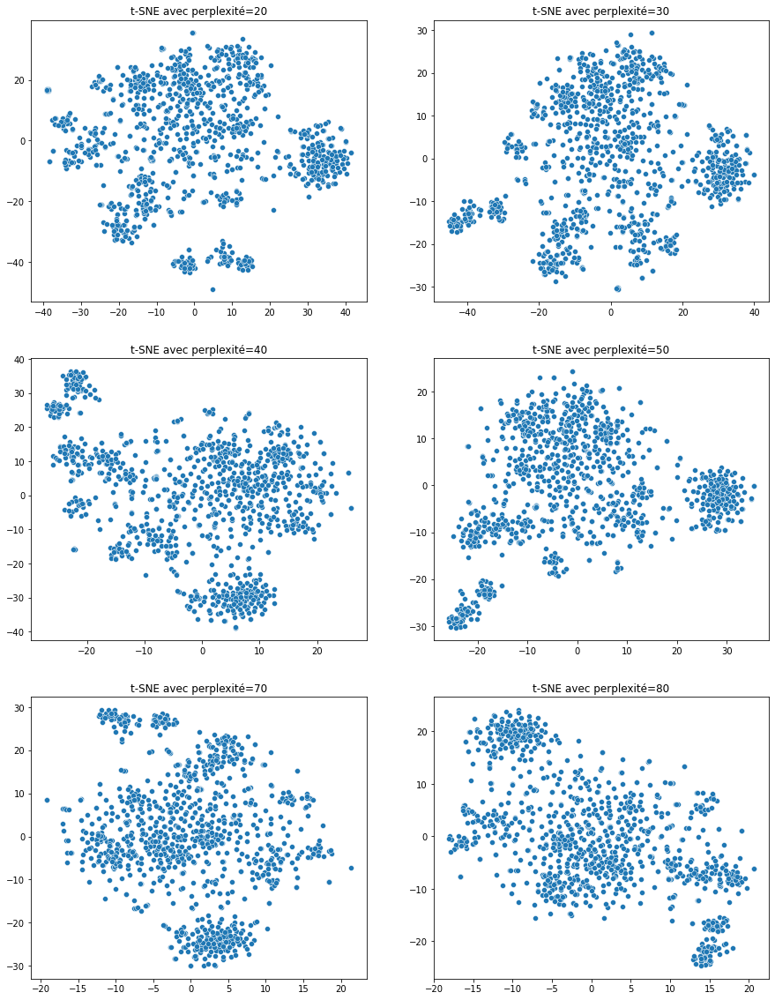

In [19]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_xcept, liste_param, 1)

- groupes plus homogènes pour perplexité=50
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [36]:
%pycodestyle_off

In [ ]:
# Réduction de dimension tsne
tsne_xcept = TSNE(verbose=1, perplexity=50, n_iter=5000)
X_proj_tsne_xcept = \
    tsne_xcept.fit_transform(df_xcept_vectors)
# Dataframe pour clustering
df_tsne_xcept = pd.DataFrame({'VAR1' : X_proj_tsne_xcept[:, 0],
                              'VAR2' : X_proj_tsne_xcept[:, 1],
                              'CATEGORIE' : df_xcept_bovw['Categorie_1'],
                              'IMAGE': df_xcept_bovw['image'],
                              'IMAGE_LOC': df_xcept_bovw['image_loc']})

In [25]:
%pycodestyle_on

In [ ]:
# Sauvegarde du dataframe des TSNE Xception
with open('sauvegarde/df_tsne_xcept.pickle', 'wb') as f:
    pickle.dump(df_tsne_xcept, f, pickle.HIGHEST_PROTOCOL)

**Clustering**

In [26]:
cols = ['VAR1', 'VAR2']

In [33]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_xcept[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_XCEPTION,nan,63910.11328,0.11579,20.00000,400.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.11585,20.00000,200.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.11585,20.00000,100.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.11585,20.00000,300.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.11713,20.00000,500.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.15864,30.00000,100.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.16672,30.00000,400.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.16822,30.00000,200.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.16922,30.00000,500.00000,0.46569,0.70495
TSNE_XCEPTION,nan,63910.11328,0.17141,30.00000,300.00000,0.46569,0.70495


In [35]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_xcept = KMeans(n_clusters=7, init='k-means++',
                           n_init=20, max_iter=400,
                           random_state=seed) \
    .fit(df_tsne_xcept[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_xcept['Clusters'] = kmeans_tsne_xcept.labels_
kmeans_tsne_xcept_labels = kmeans_tsne_xcept.labels_

In [36]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_xcept,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_XCEPTION,0.48408,0.54698,0.55443,0.55068


In [37]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,183,17.43000
1,134,12.76000
2,177,16.86000
3,170,16.19000
4,81,7.71000
5,161,15.33000
6,144,13.71000


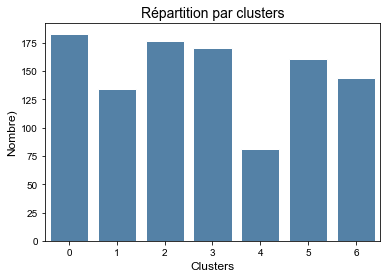

In [38]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_xcept_labels)

In [39]:
# Les catégories par clusters
df_tsne_xcept.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Home Furnishing                   114
         Home Decor & Festive Needs         27
         Baby Care                          22
         Beauty and Personal Care           10
         Computers                           7
         Kitchen & Dining                    3
1        Computers                         103
         Kitchen & Dining                   14
         Home Decor & Festive Needs         10
         Beauty and Personal Care            5
         Baby Care                           2
2        Beauty and Personal Care          119
         Kitchen & Dining                   41
         Home Decor & Festive Needs          9
         Baby Care                           5
         Computers                           2
         Home Furnishing                     1
3        Baby Care                         112
         Home Furnishing                    32
         Home Decor & Festive Needs         18
         Beauty and Personal Care            5
         Computers                           2
         Kitchen & Dining                    1
4        Kitchen & Dining                   79
         Baby Care                           1
         Home Decor & Festive Needs          1
5        Watches                           148
         Home Decor & Festive Needs         10
         Beauty and Personal Care            2
         Computers                           1
6        Home Decor & Festive Needs         75
         Computers                          35
         Kitchen & Dining                   12
         Beauty and Personal Care            9
         Baby Care                           8
         Home Furnishing                     3
         Watches                             2

**Visualisation des clusters**

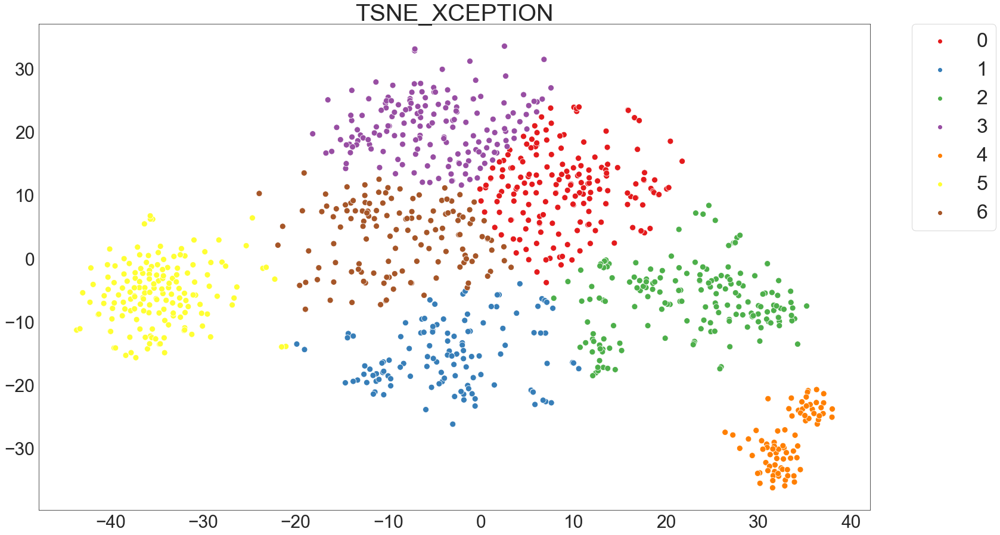

In [40]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_xcept,
                                           kmeans_tsne_xcept_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est assez haut (0.48).
- Cette combinaison TSNE Xception sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 71.5%.

**Qualité de la catégorisation ?**

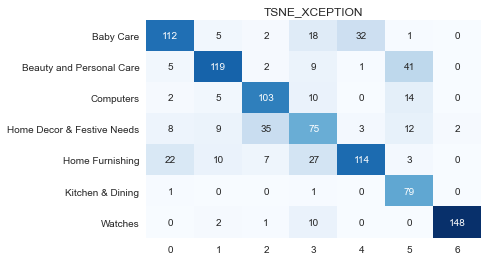

'Précision: 71.43%'

                            precision    recall  f1-score   support

                 Baby Care       0.75      0.66      0.70       170
  Beauty and Personal Care       0.79      0.67      0.73       177
                 Computers       0.69      0.77      0.73       134
Home Decor & Festive Needs       0.50      0.52      0.51       144
           Home Furnishing       0.76      0.62      0.68       183
          Kitchen & Dining       0.53      0.98      0.68        81
                   Watches       0.99      0.92      0.95       161

                  accuracy                           0.71      1050
                 macro avg       0.71      0.73      0.71      1050
              weighted avg       0.74      0.71      0.72      1050


In [41]:
dico_categories = {'0': 'Home Furnishing',
                   '1': 'Computers',
                   '2': 'Beauty and Personal Care',
                   '3': 'Baby Care',
                   '4': 'Kitchen & Dining',
                   '5': 'Watches',
                   '6': 'Home Decor & Festive Needs'}
outils_nlp.affiche_qualite_categorisation(df_tsne_xcept,
                                          dico_categories, type_donnee)

In [42]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '71.5',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [43]:
# Nombre d'erreur
mask = df_tsne_xcept['CATEGORIE'] == df_tsne_xcept['Cluster_labels']
df_erreur_xcept = df_tsne_xcept[~mask]
display(f'Nombre d\'erreurs : {df_erreur_xcept.shape[0]}')

"Nombre d'erreurs : 300"

**Répartition des erreurs par catégorie**

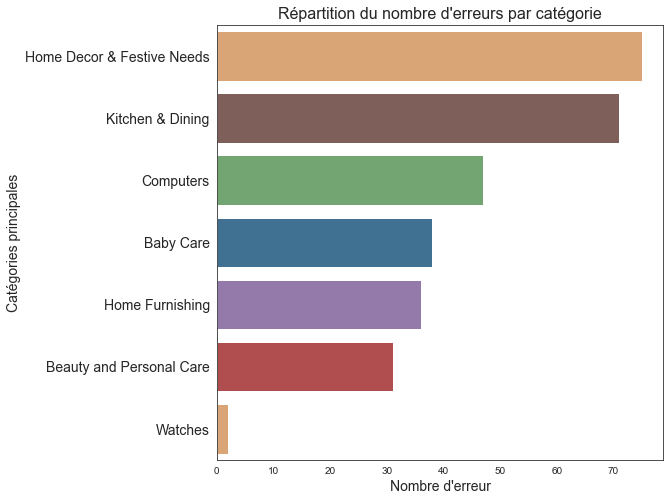

In [48]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_xcept, orient='h',
              order=df_erreur_xcept['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

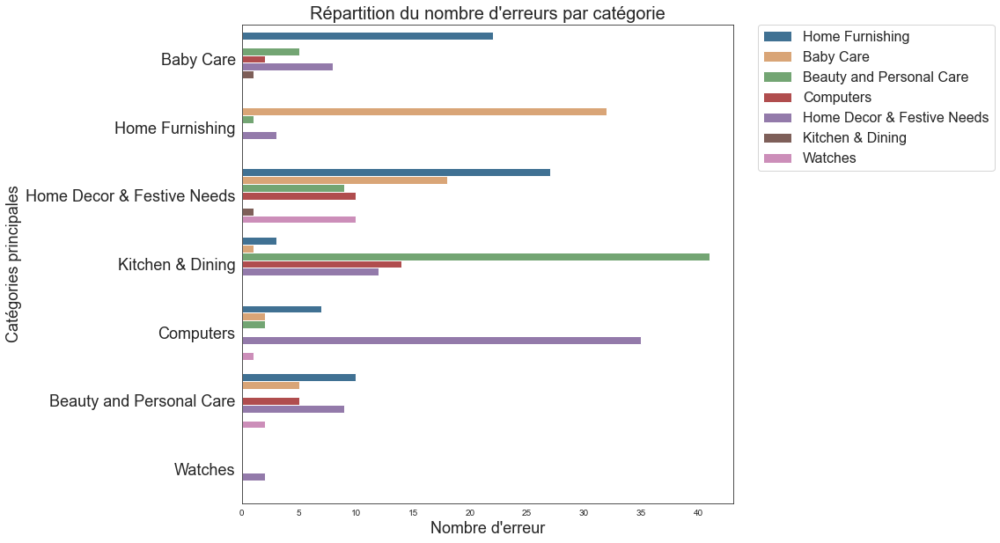

In [49]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_xcept, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [50]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [51]:
df_visu_erreur_xcept = df_erreur_xcept[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_xcept.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
594,Home Decor & Festive Needs,,Home Furnishing
995,Baby Care,,Beauty and Personal Care
437,Beauty and Personal Care,,Home Furnishing
669,Baby Care,,Home Furnishing
966,Kitchen & Dining,,Home Decor & Festive Needs
76,Beauty and Personal Care,,Home Furnishing
70,Kitchen & Dining,,Beauty and Personal Care
461,Kitchen & Dining,,Beauty and Personal Care
261,Kitchen & Dining,,Beauty and Personal Care
766,Kitchen & Dining,,Beauty and Personal Care


### <span style='background:PowderBlue'>3.4. ResNet152</span>

- Lancée en 2015 par Microsoft Research Asia, l'architecture ResNet (avec ses trois réalisations ResNet-50, ResNet-101 et ResNet-152) a obtenu de très bons résultats dans les concours ImageNet et MS-COCO. 
- L'idée centrale exploitée dans ces modèles, les connexions résiduelles, améliore considérablement le flux de gradient, ce qui permet d'entraîner des modèles beaucoup plus profonds comportant des dizaines, voire des centaines de couches. Les classes d'ImageNet sont mises en correspondance avec les entités du langage Wolfram grâce à leurs identifiants WordNet uniques.
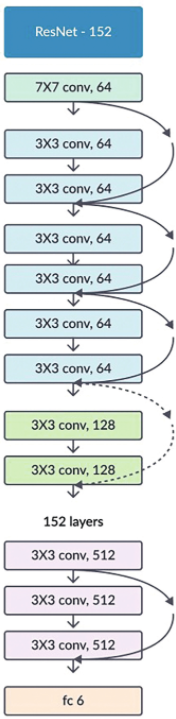
- Un réseau neuronal résiduel (ResNet) est un réseau neuronal artificiel (ANN) d'un type qui s'appuie sur des constructions connues des cellules pyramidales du cortex cérébral. 
- Pour ce faire, les réseaux neuronaux résiduels utilisent des connexions sautées, ou des raccourcis permettant de sauter certaines couches. Les modèles ResNet typiques sont mis en œuvre avec des sauts à deux ou trois couches qui contiennent des non-linéarités (ReLU) et une normalisation par lots entre les deux.
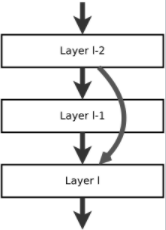
- Une matrice de poids supplémentaire peut être utilisée pour apprendre les poids des sauts, ces modèles sont connus sous le nom de HighwayNets.
[Source](https://en.wikipedia.org/wiki/Residual_neural_network)

**Utilisation de ResNet152 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [26]:
# Utilisation de ResNet152 pré-entraîné sur ImageNet avec les images
# d'origine
# ResNet152 imports
from keras.applications.resnet import preprocess_input
from keras.applications import ResNet152

# Liste
rn152_all_features = []

# Instanciation du modèle
model_rn152 = ResNet152(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_rn152.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    rn152_feature = model_rn152.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    rn152_all_features.append(np.array(rn152_feature).flatten())

rn152_all_features = np.array(rn152_all_features)

Model: "resnet152"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
__________________________________________________________________________________________

In [27]:
# Dataframe de sauvegarde des BOVW ResNet152
# Association des features à chaque image
data['resnet152_bovw'] = \
    [rn152_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_rn152_bovw = data[['image', 'image_loc', 'Categorie_1', 'resnet152_bovw']]
# Constituer le dataframe de vecteurs de BOVW ResNet152
df_rn152_vectors = pd.DataFrame.from_records(rn152_all_features)

In [28]:
# Sauvegarde du dataframe des vectors BOVW ResNet152
with open('sauvegarde/df_rn152_vectors.pickle', 'wb') as f:
    pickle.dump(df_rn152_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [29]:
type_donnee = 'TSNE_RESNET152'

In [20]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_rn152 = list()
tsne_results_rn152 = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_rn152 = \
        tsne.fit_transform(df_rn152_vectors)
    results_rn152.append(tsne_results_rn152)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.400s...
[t-SNE] Computed neighbors for 1050 samples in 185.120s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 148.018455
[t-SNE] KL divergence after 250 iterations with early exaggeration: 102.686523
[t-SNE] KL divergence after 500 iterations: 1.650771
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.242s...
[t-SNE] Computed neighbors for 1050 samples in 184.850s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 155.206069
[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.948296
[t-SNE] KL divergence after 500 iterations: 1.560304
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.425s...
[t-SNE] Computed neighbors for 1050 s

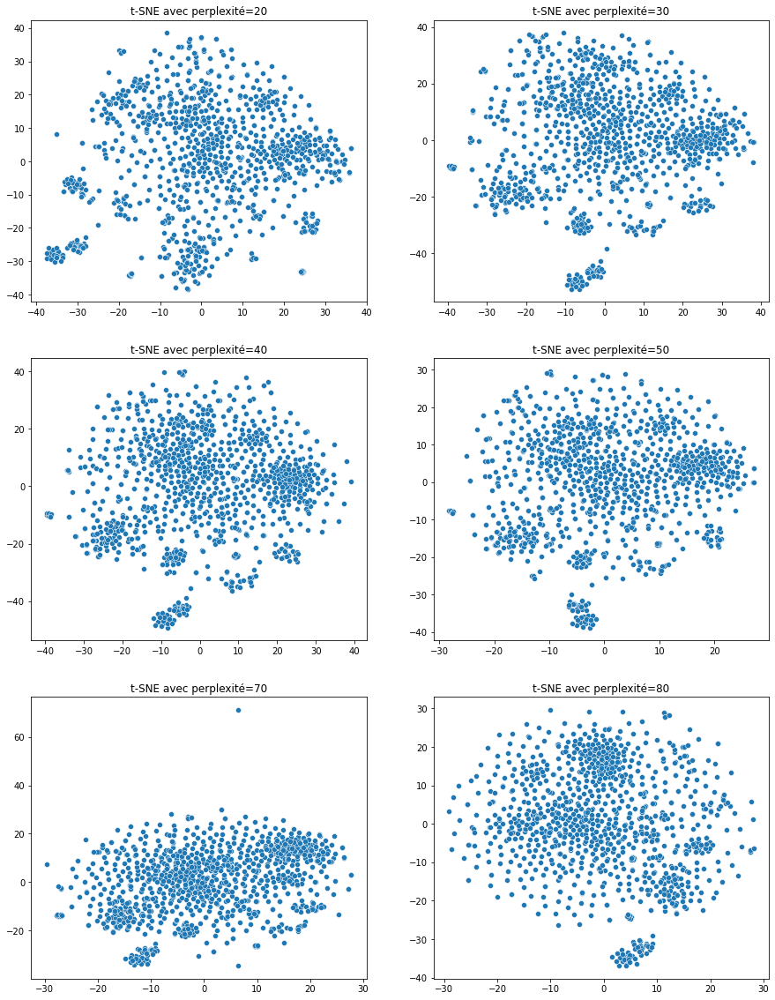

In [21]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_rn152, liste_param, 1)

- groupes plus homogènes pour perplexité=80
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [31]:
%pycodestyle_off

In [32]:
# Réduction de dimension tsne
tsne_rn152 = TSNE(verbose=1, perplexity=80, n_iter=5000)
X_proj_tsne_rn152 = \
    tsne_rn152.fit_transform(df_rn152_vectors)
# Dataframe pour clustering
df_tsne_rn152 = pd.DataFrame({'VAR1' : X_proj_tsne_rn152[:, 0],
                              'VAR2' : X_proj_tsne_rn152[:, 1],
                              'CATEGORIE' : df_rn152_bovw['Categorie_1'],
                              'IMAGE': df_rn152_bovw['image'],
                              'IMAGE_LOC': df_rn152_bovw['image_loc']})

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.538s...
[t-SNE] Computed neighbors for 1050 samples in 183.947s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 175.376370
[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.378502
[t-SNE] KL divergence after 3000 iterations: 1.216748


In [33]:
%pycodestyle_on

**Clustering**

In [34]:
cols = ['VAR1', 'VAR2']

In [35]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_rn152[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_RESNET152,nan,25516.74609,0.12419,20.00000,300.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.12569,20.00000,200.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.12663,20.00000,400.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.12666,20.00000,500.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.13664,20.00000,100.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74805,0.17653,30.00000,200.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.18035,30.00000,300.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.18895,30.00000,100.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.19237,30.00000,500.00000,0.38087,0.80444
TSNE_RESNET152,nan,25516.74609,0.19422,30.00000,400.00000,0.38087,0.80444


In [36]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_rn152 = KMeans(n_clusters=7, init='k-means++',
                           n_init=20, max_iter=300,
                           random_state=seed) \
    .fit(df_tsne_rn152[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_rn152['Clusters'] = kmeans_tsne_rn152.labels_
kmeans_tsne_rn152_labels = kmeans_tsne_rn152.labels_

In [37]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_rn152,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_RESNET152,0.33691,0.40652,0.41216,0.40932


In [38]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,197,18.76000
1,190,18.10000
2,146,13.90000
3,139,13.24000
4,92,8.76000
5,124,11.81000
6,162,15.43000


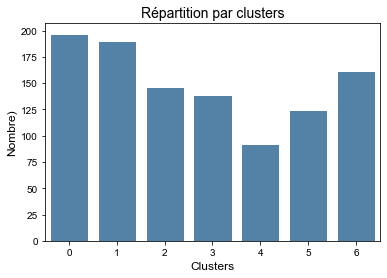

In [39]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_rn152_labels)

In [40]:
# Les catégories par clusters
df_tsne_rn152.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Watches                           149
         Home Decor & Festive Needs         24
         Home Furnishing                     7
         Beauty and Personal Care            6
         Baby Care                           4
         Kitchen & Dining                    4
         Computers                           3
1        Home Decor & Festive Needs         56
         Computers                          47
         Baby Care                          32
         Home Furnishing                    21
         Kitchen & Dining                   21
         Beauty and Personal Care           12
         Watches                             1
2        Baby Care                          83
         Home Furnishing                    48
         Home Decor & Festive Needs          8
         Kitchen & Dining                    4
         Beauty and Personal Care            3
3        Computers                          66
         Home Decor & Festive Needs         36
         Kitchen & Dining                   30
         Baby Care                           4
         Beauty and Personal Care            3
4        Kitchen & Dining                   76
         Beauty and Personal Care            9
         Home Furnishing                     4
         Home Decor & Festive Needs          2
         Computers                           1
5        Home Furnishing                    61
         Baby Care                          23
         Home Decor & Festive Needs         22
         Computers                          14
         Beauty and Personal Care            3
         Kitchen & Dining                    1
6        Beauty and Personal Care          114
         Computers                          19
         Kitchen & Dining                   14
         Home Furnishing                     9
         Baby Care                           4
         Home Decor & Festive Needs          2

**Visualisation des clusters**

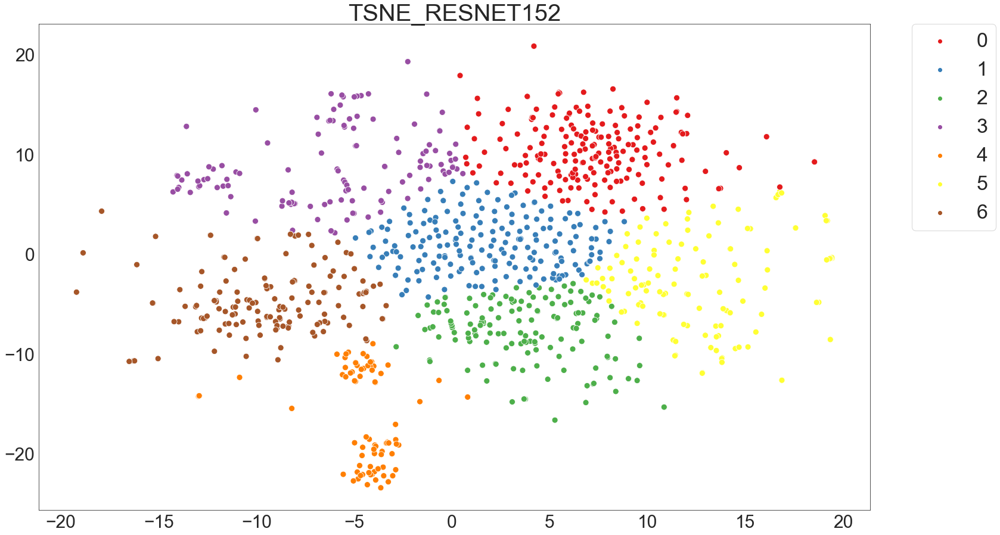

In [41]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_rn152,
                                           kmeans_tsne_rn152_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est moyen (0.34).
- Cette combinaison TSNE ResNet152V2 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 58%. 

**Qualité de la catégorisation ?**

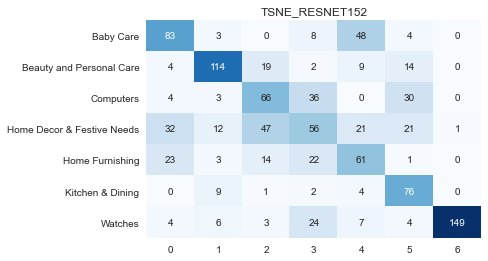

'Précision: 57.62%'

                            precision    recall  f1-score   support

                 Baby Care       0.55      0.57      0.56       146
  Beauty and Personal Care       0.76      0.70      0.73       162
                 Computers       0.44      0.47      0.46       139
Home Decor & Festive Needs       0.37      0.29      0.33       190
           Home Furnishing       0.41      0.49      0.45       124
          Kitchen & Dining       0.51      0.83      0.63        92
                   Watches       0.99      0.76      0.86       197

                  accuracy                           0.58      1050
                 macro avg       0.58      0.59      0.57      1050
              weighted avg       0.60      0.58      0.58      1050


In [42]:
dico_categories = {'0': 'Watches',
                   '1': 'Home Decor & Festive Needs',
                   '2': 'Baby Care',
                   '3': 'Computers',
                   '4': 'Kitchen & Dining',
                   '5': 'Home Furnishing',
                   '6': 'Beauty and Personal Care'}
outils_nlp.affiche_qualite_categorisation(df_tsne_rn152,
                                          dico_categories, type_donnee)

In [43]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '58',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [44]:
# Nombre d'erreur
mask = df_tsne_rn152['CATEGORIE'] == df_tsne_rn152['Cluster_labels']
df_erreur_rn152 = df_tsne_rn152[~mask]
display(f'Nombre d\'erreurs : {df_erreur_rn152.shape[0]}')

"Nombre d'erreurs : 445"

**Répartition des erreurs par catégorie**

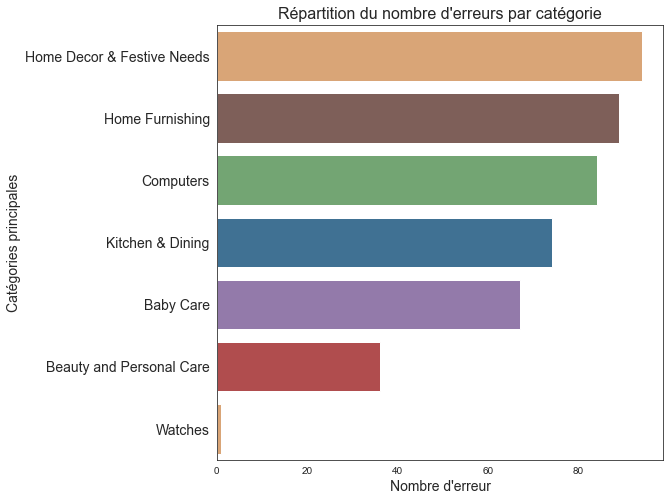

In [45]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_rn152, orient='h',
              order=df_erreur_rn152['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

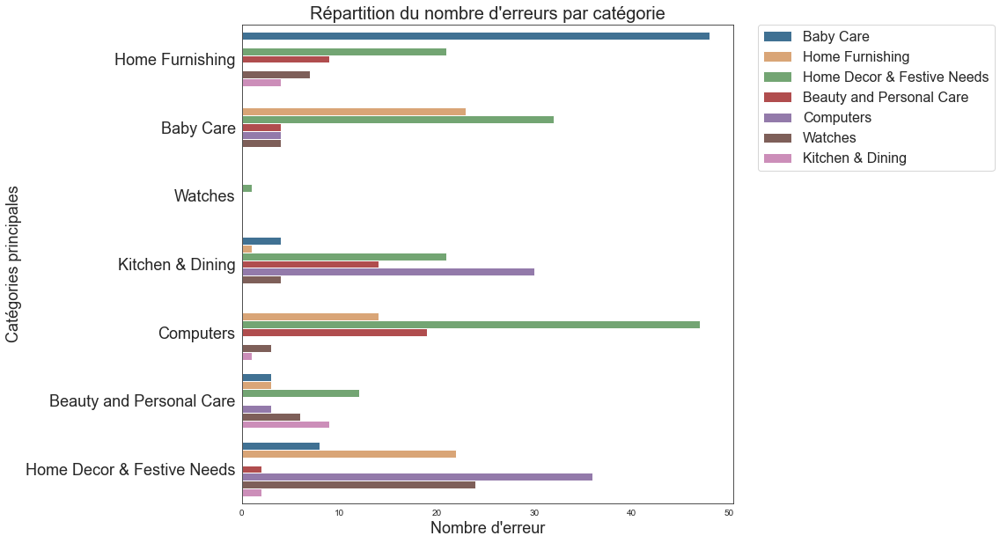

In [46]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_rn152, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [47]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [48]:
df_visu_erreur_rn152 = df_erreur_rn152[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_rn152.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
834,Computers,,Home Decor & Festive Needs
859,Computers,,Home Decor & Festive Needs
55,Computers,,Beauty and Personal Care
845,Baby Care,,Home Decor & Festive Needs
853,Computers,,Home Decor & Festive Needs
234,Kitchen & Dining,,Baby Care
1039,Home Decor & Festive Needs,,Computers
897,Home Furnishing,,Home Decor & Festive Needs
860,Computers,,Kitchen & Dining
836,Computers,,Home Decor & Festive Needs


### <span style='background:PowderBlue'>3.5. ResNet152V2</span>

- La différence entre ResNetV1 et ResNetV2 est d'utiliser la pré-activation des couches de poids au lieu de la post-activation.
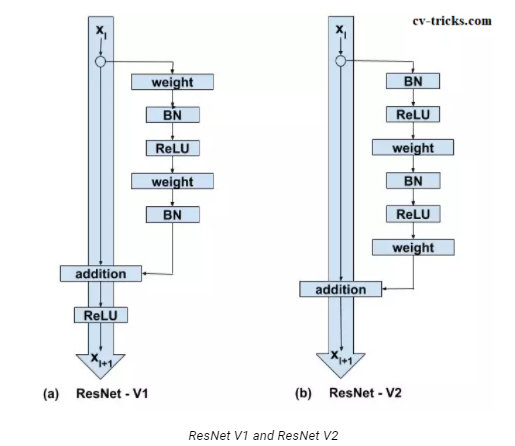

[Source](https://cv-tricks.com/keras/understand-implement-resnets/)

**Utilisation de ResNet152V2 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [49]:
# Utilisation de ResNet152V2 pré-entraîné sur ImageNet avec les images
# d'origine
# ResNet152V2 imports
from keras.applications.resnet_v2 import preprocess_input
from keras.applications import ResNet152V2

# Liste
rn152v2_all_features = []

# Instanciation du modèle
model_rn152v2 = ResNet152V2(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_rn152v2.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    rn152v2_feature = model_rn152v2.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    rn152v2_all_features.append(np.array(rn152v2_feature).flatten())

rn152v2_all_features = np.array(rn152v2_all_features)

Model: "resnet152v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, None, None, 6 0           conv1_conv[0][0]                 
________________________________________________________________________________________

In [50]:
# Dataframe de sauvegarde des BOVW ResNet152
# Association des features à chaque image
data['resnet152v2_bovw'] = \
    [rn152v2_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_rn152v2_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'resnet152v2_bovw']]
# Constituer le dataframe de vecteurs de BOVW ResNet152V2
df_rn152v2_vectors = pd.DataFrame.from_records(rn152v2_all_features)

In [51]:
# Sauvegarde du dataframe des vectors BOVW ResNet152
with open('sauvegarde/df_rn152v2_vectors.pickle', 'wb') as f:
    pickle.dump(df_rn152v2_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [52]:
type_donnee = 'TSNE_RESNET152V2'

In [53]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_rn152v2 = list()
tsne_results_rn152v2 = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_rn152v2 = \
        tsne.fit_transform(df_rn152v2_vectors)
    results_rn152v2 append(tsne_results_rn152v2)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.201s...
[t-SNE] Computed neighbors for 1050 samples in 178.916s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 141.534082
[t-SNE] KL divergence after 250 iterations with early exaggeration: 102.967896
[t-SNE] KL divergence after 500 iterations: 1.646557
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 21.299s...
[t-SNE] Computed neighbors for 1050 samples in 180.097s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 151.125795
[t-SNE] KL divergence after 250 iterations with early exaggeration: 99.656456
[t-SNE] KL divergence after 500 iterations: 1.527803
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 21.131s...
[t-SNE] Computed neighbors for 1050 s

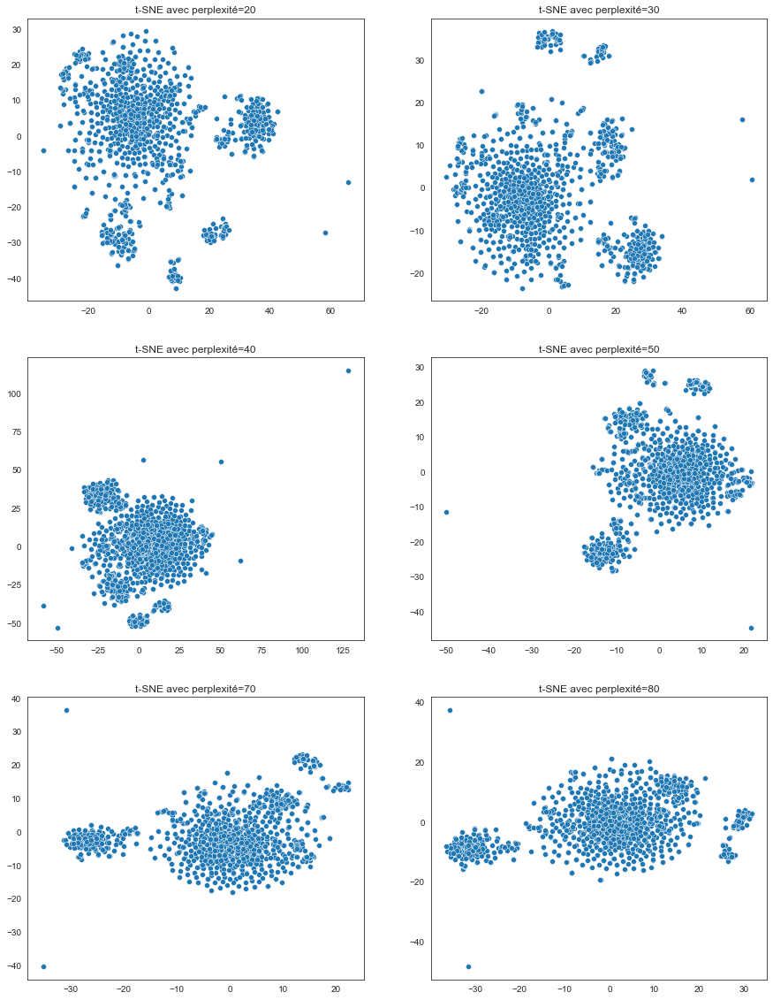

In [54]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_rn152v2, liste_param, 1)

- groupes plus homogènes pour perplexité=50
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [55]:
%pycodestyle_off

In [56]:
# Réduction de dimension tsne
tsne_rn152v2 = TSNE(verbose=1, perplexity=50, n_iter=5000)
X_proj_tsne_rn152v2 = \
    tsne_rn152v2.fit_transform(df_rn152v2_vectors)
# Dataframe pour clustering
df_tsne_rn152v2 = pd.DataFrame({'VAR1' : X_proj_tsne_rn152v2[:, 0],
                              'VAR2' : X_proj_tsne_rn152v2[:, 1],
                              'CATEGORIE' : df_rn152v2_bovw['Categorie_1'],
                              'IMAGE': df_rn152v2_bovw['image'],
                              'IMAGE_LOC': df_rn152v2_bovw['image_loc']})

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1050 samples in 20.154s...
[t-SNE] Computed neighbors for 1050 samples in 182.543s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 162.307428
[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.441895
[t-SNE] KL divergence after 3600 iterations: 1.338084


In [57]:
%pycodestyle_on

**Clustering**

In [58]:
cols = ['VAR1', 'VAR2']

In [59]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_rn152v2[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_RESNET152V2,nan,46702.49219,0.41613,70.00000,500.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.49219,0.41689,70.00000,300.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.49219,0.42461,70.00000,200.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.48828,0.42582,70.00000,100.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.48828,0.42801,70.00000,400.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.49219,0.47008,80.00000,200.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.49609,0.47846,80.00000,400.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.49219,0.48562,80.00000,100.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.49219,0.48715,80.00000,300.00000,0.43213,0.65593
TSNE_RESNET152V2,nan,46702.48828,0.48836,80.00000,500.00000,0.43213,0.65593


In [62]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_rn152v2 = KMeans(n_clusters=7, init='k-means++',
                             n_init=70, max_iter=500,
                             random_state=seed) \
    .fit(df_tsne_rn152v2[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_rn152v2['Clusters'] = kmeans_tsne_rn152v2.labels_
kmeans_tsne_rn152v2_labels = kmeans_tsne_rn152v2.labels_

In [63]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_rn152v2,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_RESNET152V2,0.35252,0.43517,0.48518,0.45882


In [64]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,239,22.76000
1,249,23.71000
2,151,14.38000
3,86,8.19000
4,161,15.33000
5,163,15.52000
6,1,0.10000


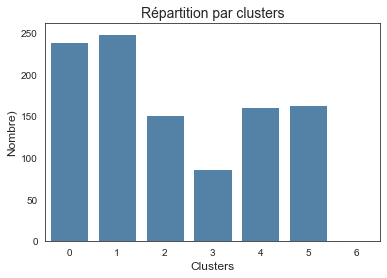

In [65]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_rn152v2_labels)

In [66]:
# Les catégories par clusters
df_tsne_rn152v2.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Computers                         100
         Home Decor & Festive Needs         49
         Beauty and Personal Care           25
         Kitchen & Dining                   25
         Baby Care                          18
         Home Furnishing                    17
         Watches                             5
1        Home Furnishing                    91
         Home Decor & Festive Needs         82
         Baby Care                          29
         Computers                          23
         Kitchen & Dining                   16
         Beauty and Personal Care            8
2        Watches                           145
         Beauty and Personal Care            3
         Home Decor & Festive Needs          3
3        Kitchen & Dining                   78
         Beauty and Personal Care            3
         Computers                           3
         Baby Care                           2
4        Baby Care                          98
         Home Furnishing                    42
         Home Decor & Festive Needs         12
         Computers                           5
         Beauty and Personal Care            4
5        Beauty and Personal Care          107
         Kitchen & Dining                   31
         Computers                          19
         Baby Care                           3
         Home Decor & Festive Needs          3
6        Home Decor & Festive Needs          1

**Visualisation des clusters**

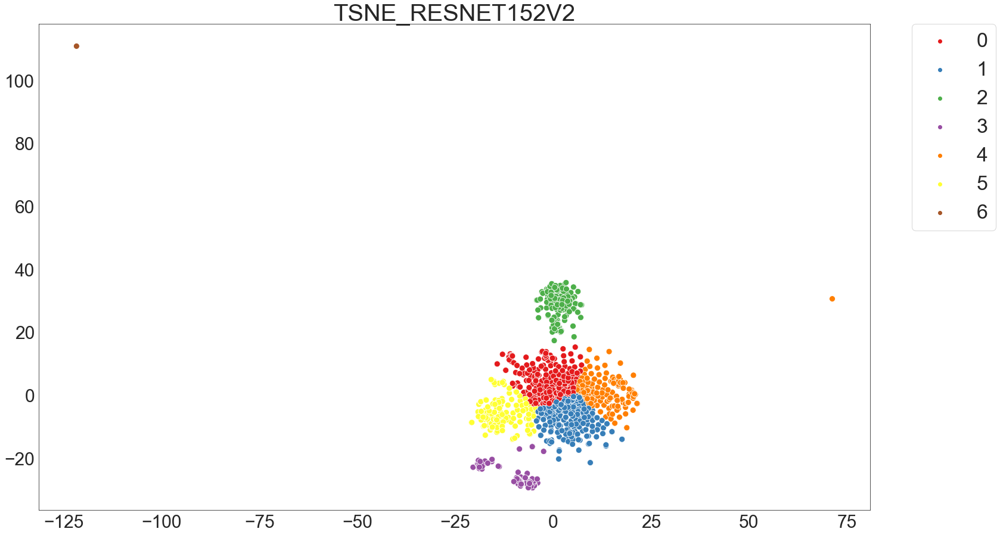

In [67]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_rn152v2,
                                           kmeans_tsne_rn152v2_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est moyen (0.35).
- Cette combinaison TSNE ResNet152V2 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 59%.

**Qualité de la catégorisation ?**

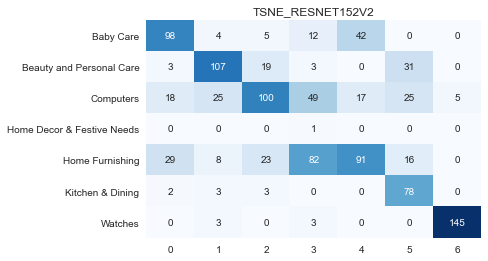

'Précision: 59.05%'

                            precision    recall  f1-score   support

                 Baby Care       0.65      0.61      0.63       161
  Beauty and Personal Care       0.71      0.66      0.68       163
                 Computers       0.67      0.42      0.51       239
Home Decor & Festive Needs       0.01      1.00      0.01         1
           Home Furnishing       0.61      0.37      0.46       249
          Kitchen & Dining       0.52      0.91      0.66        86
                   Watches       0.97      0.96      0.96       151

                  accuracy                           0.59      1050
                 macro avg       0.59      0.70      0.56      1050
              weighted avg       0.69      0.59      0.62      1050


In [68]:
dico_categories = {'0': 'Computers',
                   '1': 'Home Furnishing',
                   '2': 'Watches',
                   '3': 'Kitchen & Dining',
                   '4': 'Baby Care',
                   '5': 'Beauty and Personal Care',
                   '6': 'Home Decor & Festive Needs'}
outils_nlp.affiche_qualite_categorisation(df_tsne_rn152v2,
                                          dico_categories, type_donnee)

In [70]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '59',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [74]:
# Nombre d'erreur
mask = df_tsne_rn152v2['CATEGORIE'] == df_tsne_rn152v2['Cluster_labels']
df_erreur_rn152v2 = df_tsne_rn152v2[~mask]
display(f'Nombre d\'erreurs : {df_erreur_rn152v2.shape[0]}')

"Nombre d'erreurs : 430"

**Répartition des erreurs par catégorie**

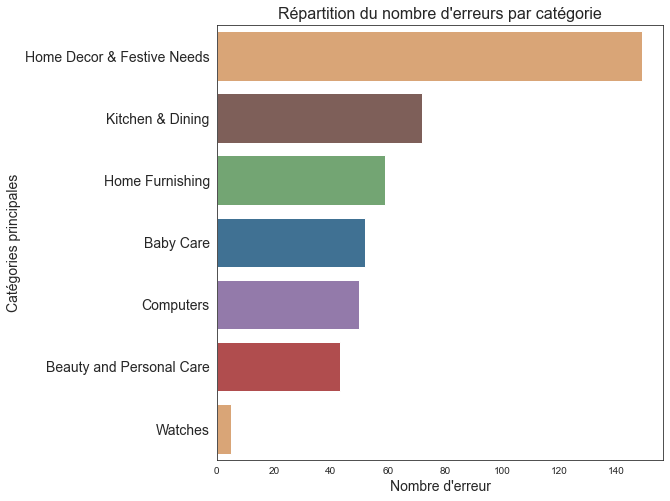

In [75]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_rn152v2, orient='h',
              order=df_erreur_rn152v2['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

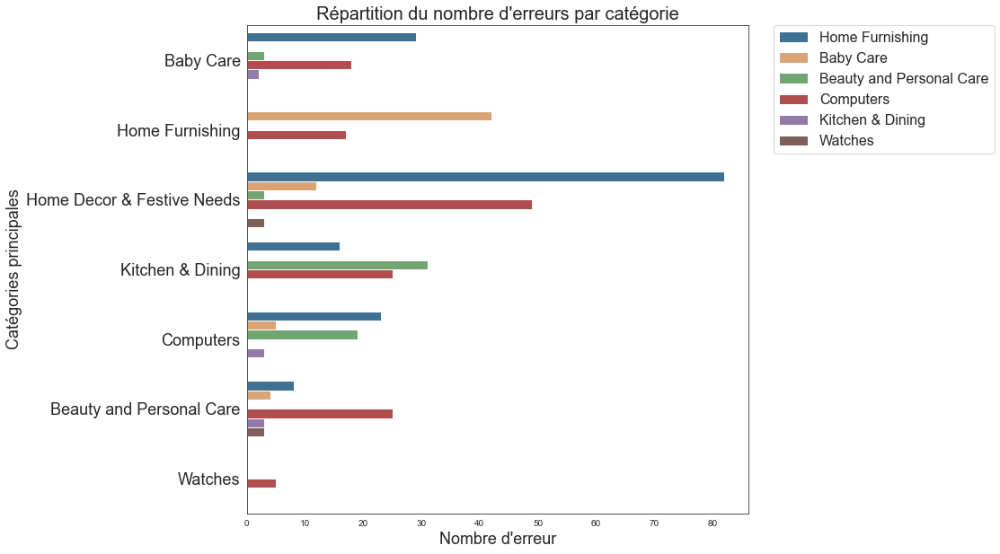

In [76]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_rn152v2, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [77]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [79]:
df_visu_erreur_rn152v2 = df_erreur_rn152v2[['CATEGORIE', 'IMAGE_LOC',
                                            'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_rn152v2.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
1041,Baby Care,,Home Furnishing
1009,Home Decor & Festive Needs,,Home Furnishing
900,Beauty and Personal Care,,Computers
735,Beauty and Personal Care,,Home Furnishing
974,Home Decor & Festive Needs,,Computers
748,Beauty and Personal Care,,Computers
195,Home Decor & Festive Needs,,Home Furnishing
919,Home Decor & Festive Needs,,Home Furnishing
824,Home Furnishing,,Baby Care
596,Home Decor & Festive Needs,,Home Furnishing


### <span style='background:PowderBlue'>3.6. InceptionV3</span>

- Inception v3 est un réseau de neurones convolutif destiné à aider à l'analyse d'images et à la détection d'objets, et a débuté comme module pour Googlenet. 
- Il s'agit de la troisième édition du réseau de neurones convolutif Inception de Google, initialement présenté lors du défi de reconnaissance ImageNet. 
- Tout comme ImageNet peut être considéré comme une base de données d'objets visuels classés, Inception aide à la classification d'objets dans le monde de la vision par ordinateur. 
- Le nom original (Inception) a reçu ce nom de code après qu'un mème internet populaire "'we need to go deeper'" est devenu viral, citant une phrase du film Inception de Christopher Nolan.
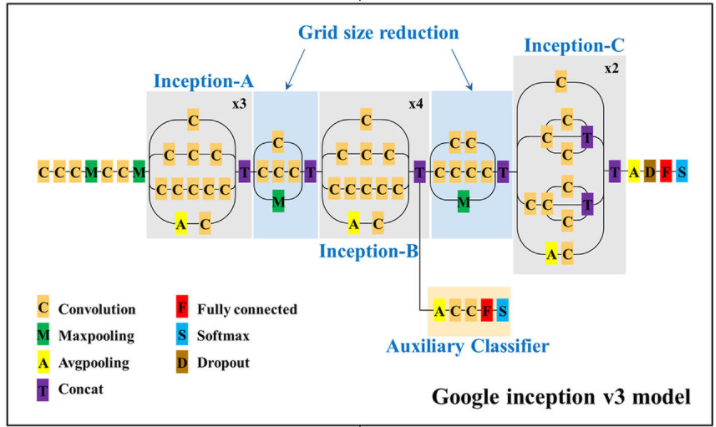
[Source](https://www.researchgate.net/figure/Schematic-diagram-of-the-Inception-v3-model-based-on-convolutional-neural-networks_fig3_337200783)

**Utilisation de InceptionV3 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [68]:
# Utilisation de InceptionV3 pré-entraîné sur ImageNet avec les images
# d'origine
# InceptionV3 imports
from keras.applications.inception_v3 import preprocess_input
from keras.applications import InceptionV3

# Liste
incep_all_features = []

# Instanciation du modèle
model_incep = InceptionV3(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_incep.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    incep_feature = model_incep.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    incep_all_features.append(np.array(incep_feature).flatten())

incep_all_features = np.array(incep_all_features)

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, None, None, 3 96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, None, None, 3 0           batch_normalization_94[0][0]     
_______________________________________________________________________________________

In [69]:
# Dataframe de sauvegarde des BOVW InceptionV3
# Association des features à chaque image
data['incep_bovw'] = \
    [incep_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_incep_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'incep_bovw']]
# Constituer le dataframe de vecteurs de BOVW InceptionV3
df_incep_vectors = pd.DataFrame.from_records(incep_all_features)

In [70]:
# Sauvegarde du dataframe des vectors BOVW InceptionV3
with open('sauvegarde/df_incep_vectors.pickle', 'wb') as f:
    pickle.dump(df_incep_vectors, f, pickle.HIGHEST_PROTOCOL)

In [71]:
# Sauvegarde du dataframe des vectors BOVW InceptionV3
with open('sauvegarde/df_incep_bovw.pickle', 'wb') as f:
    pickle.dump(df_incep_bovw, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [84]:
type_donnee = 'TSNE_INCEPTIONV3'

In [85]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_incep = list()
tsne_results_incep = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_incep = \
        tsne.fit_transform(df_incep_vectors)
    results_incep.append(tsne_results_rn152v2)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 10.808s...
[t-SNE] Computed neighbors for 1050 samples in 94.209s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 48.657938
[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.092896
[t-SNE] KL divergence after 500 iterations: 1.485440
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 10.875s...
[t-SNE] Computed neighbors for 1050 samples in 93.732s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 51.590068
[t-SNE] KL divergence after 250 iterations with early exaggeration: 95.698006
[t-SNE] KL divergence after 500 iterations: 1.411326
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 11.018s...
[t-SNE] Computed neighbors for 1050 sampl

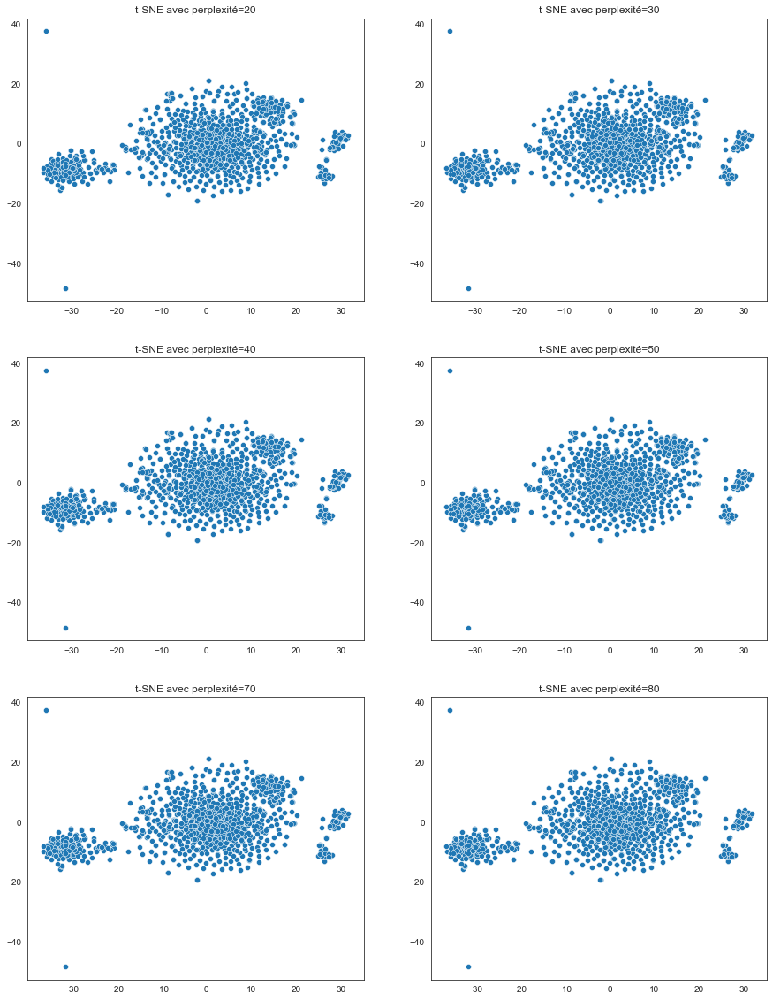

In [86]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_incep, liste_param, 1)

- groupes plus homogènes pour perplexité=30
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [42]:
%pycodestyle_off

In [47]:
# Réduction de dimension tsne
tsne_incep = TSNE(verbose=1, perplexity=30, n_iter=5000)
X_proj_tsne_incep = \
    tsne_incep.fit_transform(df_incep_vectors)
# Dataframe pour clustering
df_tsne_incep = pd.DataFrame({'VAR1' : X_proj_tsne_incep[:, 0],
                              'VAR2' : X_proj_tsne_incep[:, 1],
                              'CATEGORIE' : df_incep_bovw['Categorie_1'],
                              'IMAGE': df_incep_bovw['image'],
                              'IMAGE_LOC': df_incep_bovw['image_loc']})

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 11.104s...
[t-SNE] Computed neighbors for 1050 samples in 94.249s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 51.590068
[t-SNE] KL divergence after 250 iterations with early exaggeration: 100.431709
[t-SNE] KL divergence after 2950 iterations: 1.364331


In [48]:
%pycodestyle_on

In [55]:
# Sauvegarde du dataframe des vectors BOVW InceptionV3
with open('sauvegarde/df_tsne_incep.pickle', 'wb') as f:
    pickle.dump(df_tsne_incep, f, pickle.HIGHEST_PROTOCOL)

**Clustering**

In [90]:
cols = ['VAR1', 'VAR2']

In [91]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_incep[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_INCEPTIONV3,nan,132806.43750,0.06582,10.00000,500.00000,0.44447,0.74533
TSNE_INCEPTIONV3,nan,132806.40625,0.06583,10.00000,200.00000,0.44447,0.74533
TSNE_INCEPTIONV3,nan,132806.43750,0.06682,10.00000,400.00000,0.44447,0.74533
TSNE_INCEPTIONV3,nan,132806.42188,0.06682,10.00000,300.00000,0.44447,0.74533
TSNE_INCEPTIONV3,nan,132806.40625,0.06981,10.00000,100.00000,0.44447,0.74533
TSNE_INCEPTIONV3,nan,132787.71875,0.11968,20.00000,100.00000,0.44441,0.74457
TSNE_INCEPTIONV3,nan,132787.71875,0.11996,20.00000,400.00000,0.44441,0.74457
TSNE_INCEPTIONV3,nan,132787.71875,0.12068,20.00000,200.00000,0.44441,0.74457
TSNE_INCEPTIONV3,nan,132787.71875,0.12076,20.00000,300.00000,0.44441,0.74457
TSNE_INCEPTIONV3,nan,132787.71875,0.12168,20.00000,500.00000,0.44441,0.74457


In [92]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_incep = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=500,
                           random_state=seed) \
    .fit(df_tsne_incep[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_incep['Clusters'] = kmeans_tsne_incep.labels_
kmeans_tsne_incep_labels = kmeans_tsne_incep.labels_

In [93]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_incep,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_INCEPTIONV3,0.51253,0.56216,0.56821,0.56517


In [94]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,151,14.38000
1,144,13.71000
2,187,17.81000
3,108,10.29000
4,180,17.14000
5,172,16.38000
6,108,10.29000


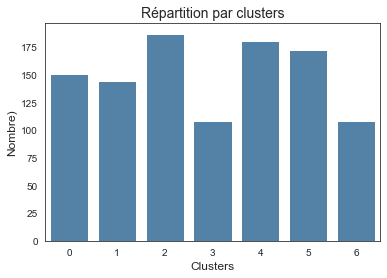

In [95]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_incep_labels)

In [96]:
# Les catégories par clusters
df_tsne_incep.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Beauty and Personal Care          124
         Kitchen & Dining                   16
         Baby Care                           4
         Computers                           4
         Home Decor & Festive Needs          3
1        Computers                         115
         Home Decor & Festive Needs         19
         Kitchen & Dining                    8
         Baby Care                           1
         Beauty and Personal Care            1
2        Watches                           148
         Computers                          17
         Home Decor & Festive Needs         10
         Beauty and Personal Care            6
         Kitchen & Dining                    5
         Home Furnishing                     1
3        Kitchen & Dining                  102
         Home Decor & Festive Needs          5
         Baby Care                           1
4        Baby Care                         112
         Home Furnishing                    39
         Home Decor & Festive Needs         18
         Beauty and Personal Care            5
         Computers                           4
         Kitchen & Dining                    2
5        Home Decor & Festive Needs         89
         Baby Care                          23
         Home Furnishing                    20
         Kitchen & Dining                   16
         Beauty and Personal Care           13
         Computers                           9
         Watches                             2
6        Home Furnishing                    90
         Baby Care                           9
         Home Decor & Festive Needs          6
         Beauty and Personal Care            1
         Computers                           1
         Kitchen & Dining                    1

**Visualisation des clusters**

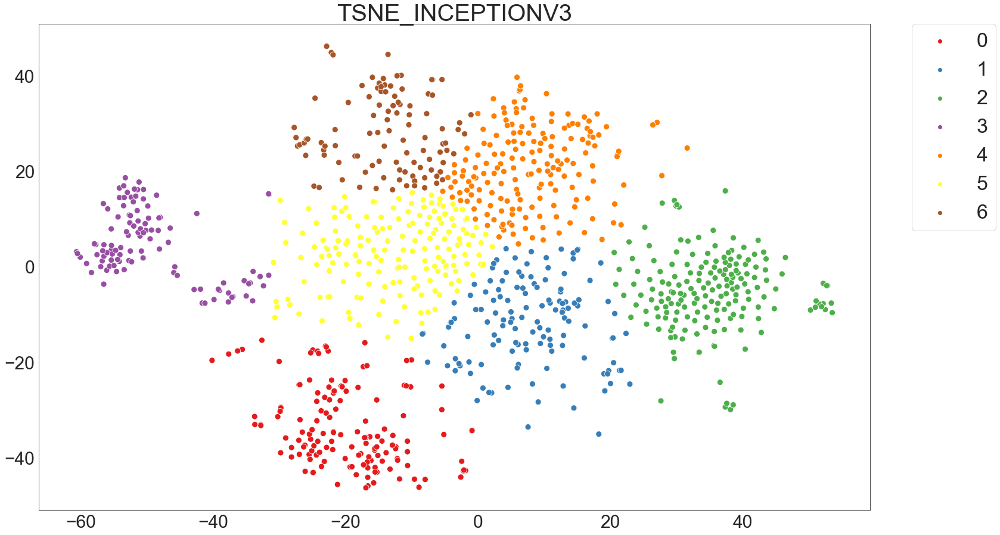

In [97]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_incep,
                                           kmeans_tsne_incep_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est assez haut (0.51).
- Cette combinaison TSNE InceptionV3 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 74%. 

**Qualité de la catégorisation ?**

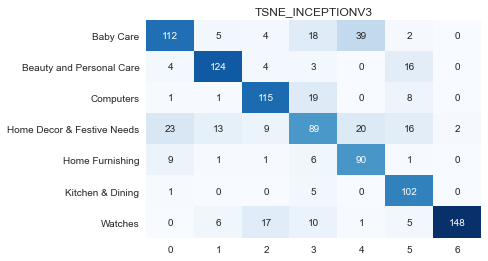

'Précision: 74.29%'

                            precision    recall  f1-score   support

                 Baby Care       0.75      0.62      0.68       180
  Beauty and Personal Care       0.83      0.82      0.82       151
                 Computers       0.77      0.80      0.78       144
Home Decor & Festive Needs       0.59      0.52      0.55       172
           Home Furnishing       0.60      0.83      0.70       108
          Kitchen & Dining       0.68      0.94      0.79       108
                   Watches       0.99      0.79      0.88       187

                  accuracy                           0.74      1050
                 macro avg       0.74      0.76      0.74      1050
              weighted avg       0.76      0.74      0.74      1050


In [98]:
dico_categories = {'0': 'Beauty and Personal Care',
                   '1': 'Computers',
                   '2': 'Watches',
                   '3': 'Kitchen & Dining',
                   '4': 'Baby Care',
                   '5': 'Home Decor & Festive Needs',
                   '6': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_incep,
                                          dico_categories, type_donnee)

In [99]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '74',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [100]:
# Nombre d'erreur
mask = df_tsne_incep['CATEGORIE'] == df_tsne_incep['Cluster_labels']
df_erreur_incep = df_tsne_incep[~mask]
display(f'Nombre d\'erreurs : {df_erreur_incep.shape[0]}')

"Nombre d'erreurs : 270"

**Répartition des erreurs par catégorie**

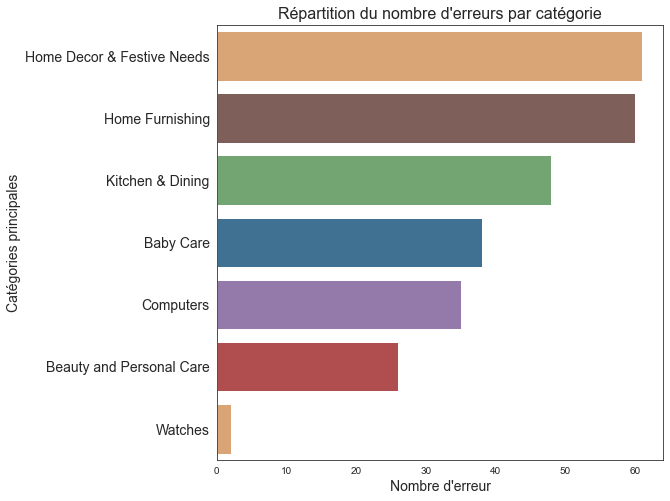

In [101]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_incep, orient='h',
              order=df_erreur_incep['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

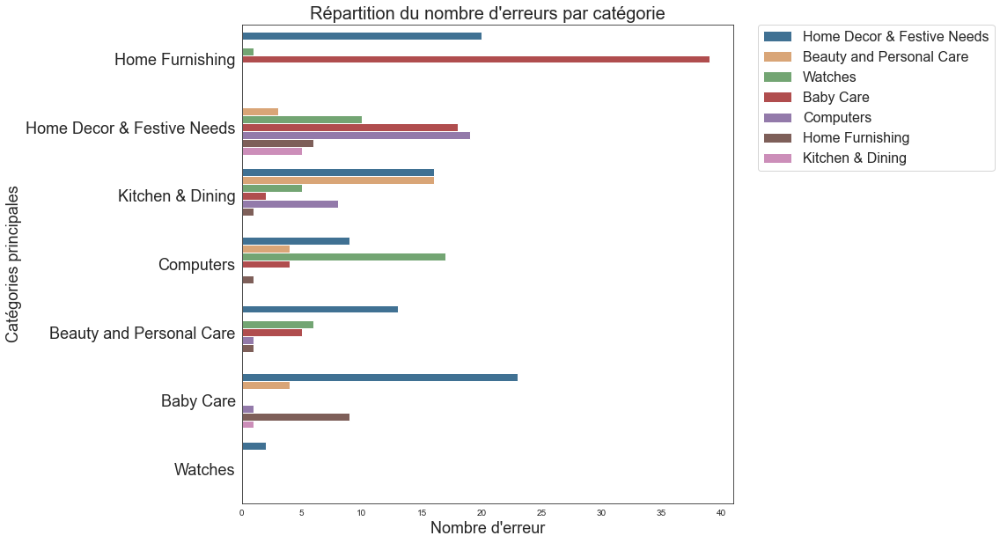

In [103]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_incep, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [104]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [105]:
df_visu_erreur_incep = df_erreur_incep[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_incep.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
226,Home Decor & Festive Needs,,Computers
210,Home Decor & Festive Needs,,Computers
956,Kitchen & Dining,,Baby Care
67,Home Furnishing,,Baby Care
432,Computers,,Watches
113,Kitchen & Dining,,Home Decor & Festive Needs
126,Beauty and Personal Care,,Computers
666,Baby Care,,Home Decor & Festive Needs
268,Kitchen & Dining,,Watches
622,Baby Care,,Home Furnishing


### <span style='background:PowderBlue'>3.7. InceptionResNetV2</span>

- Inception-ResNet-v2 est un réseau de neurones convolutif entraîné sur plus d'un million d'images de la base de données ImageNet. 
- Le réseau a une profondeur de 164 couches et peut classer les images dans 1000 catégories d'objets, comme le clavier, la souris, le crayon et de nombreux animaux. Par conséquent, le réseau a appris des représentations de caractéristiques riches pour un large éventail d'images. Le réseau a une taille d'entrée d'image de 299 par 299.
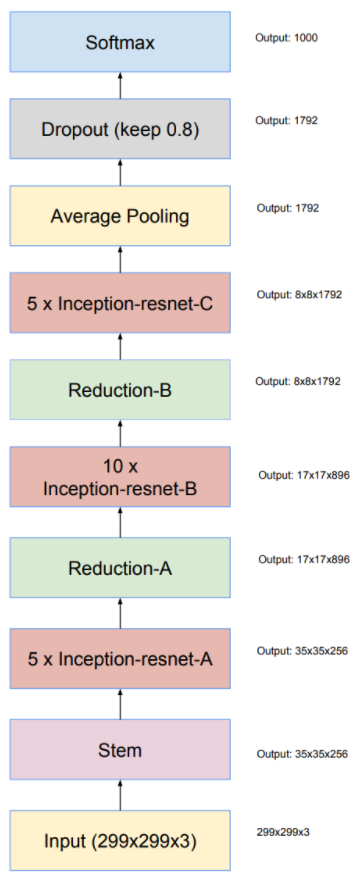
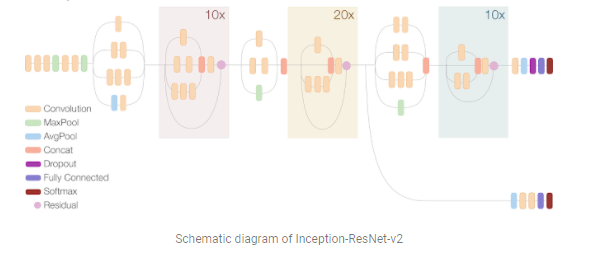
[Source](https://ai.googleblog.com/2016/08/improving-inception-and-image.html)

**Utilisation de InceptionResNetV2 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [106]:
# Utilisation de InceptionResNetV2 pré-entraîné sur ImageNet avec 
# les images d'origine
# InceptionResNetV2 imports
from keras.applications.inception_resnet_v2 import preprocess_input
from keras.applications import InceptionResNetV2

# Liste
incrn_all_features = []

# Instanciation du modèle
model_incrn = InceptionResNetV2(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_incrn.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    incrn_feature = model_incrn.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    incrn_all_features.append(np.array(incrn_feature).flatten())

incrn_all_features = np.array(incrn_all_features)

219062272/219055592 [==============================] - 8s 0us/step
Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_188 (Conv2D)             (None, None, None, 3 864         input_6[0][0]                    
__________________________________________________________________________________________________
batch_normalization_188 (BatchN (None, None, None, 3 96          conv2d_188[0][0]                 
__________________________________________________________________________________________________
activation_188 (Activation)     (None, None, None, 3 0           batch_normalization_188[0][0]    
_____________

1:66: W291 trailing whitespace


In [107]:
# Dataframe de sauvegarde des BOVW InceptionResNetV2
# Association des features à chaque image
data['incrn_bovw'] = \
    [incrn_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_incrn_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'incrn_bovw']]
# Constituer le dataframe de vecteurs de BOVW InceptionResNetV2
df_incrn_vectors = pd.DataFrame.from_records(incrn_all_features)

In [109]:
# Sauvegarde du dataframe des vectors BOVW InceptionResNetV2
with open('sauvegarde/df_incrn_vectors.pickle', 'wb') as f:
    pickle.dump(df_incrn_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [110]:
type_donnee = 'INCEPTIONRESNETV2'

In [111]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_incrn = list()
tsne_results_incrn = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_incrn = \
        tsne.fit_transform(df_incrn_vectors)
    results_incrn.append(tsne_results_incrn)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 8.123s...
[t-SNE] Computed neighbors for 1050 samples in 70.479s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 42.642663
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.025398
[t-SNE] KL divergence after 500 iterations: 1.187137
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 8.075s...
[t-SNE] Computed neighbors for 1050 samples in 70.407s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 45.079555
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.361740
[t-SNE] KL divergence after 500 iterations: 1.119235
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 8.291s...
[t-SNE] Computed neighbors for 1050 samples i

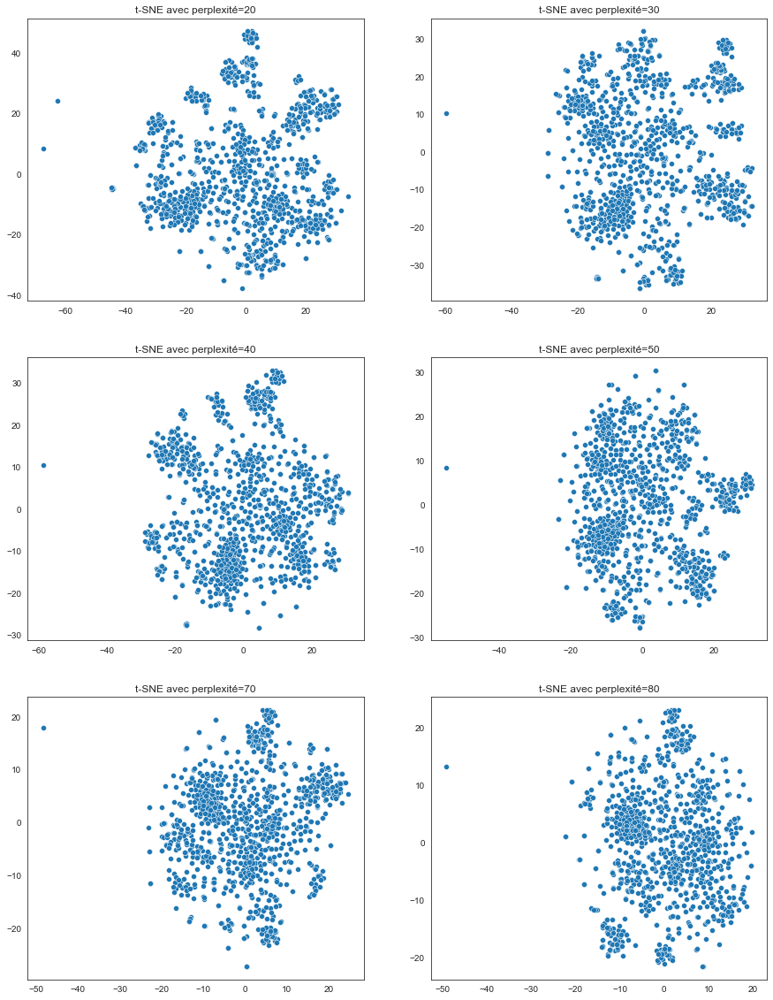

In [112]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_incrn, liste_param, 1)

- groupes plus homogènes pour perplexité=40.
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [113]:
%pycodestyle_off

In [116]:
# Réduction de dimension tsne
tsne_incrn = TSNE(verbose=1, perplexity=40, n_iter=5000)
X_proj_tsne_incrn = \
    tsne_incrn.fit_transform(df_incrn_vectors)
# Dataframe pour clustering
df_tsne_incrn = pd.DataFrame({'VAR1' : X_proj_tsne_incrn[:, 0],
                              'VAR2' : X_proj_tsne_incrn[:, 1],
                              'CATEGORIE' : df_incrn_bovw['Categorie_1'],
                              'IMAGE': df_incrn_bovw['image'],
                              'IMAGE_LOC': df_incrn_bovw['image_loc']})

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 8.192s...
[t-SNE] Computed neighbors for 1050 samples in 70.998s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 46.896263
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.733879
[t-SNE] KL divergence after 2250 iterations: 1.041206


In [117]:
%pycodestyle_on

**Clustering**

In [118]:
cols = ['VAR1', 'VAR2']

In [119]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_incrn[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
INCEPTIONRESNETV2,nan,124583.93750,0.38511,70.00000,400.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.38579,70.00000,500.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.39063,70.00000,200.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.39933,70.00000,300.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.40093,70.00000,100.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.44753,80.00000,200.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.44956,80.00000,400.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.45592,80.00000,100.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.45750,80.00000,500.00000,0.44813,0.72745
INCEPTIONRESNETV2,nan,124583.93750,0.46936,80.00000,300.00000,0.44813,0.72745


In [120]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_incrn = KMeans(n_clusters=7, init='k-means++',
                           n_init=70, max_iter=400,
                           random_state=seed) \
    .fit(df_tsne_incrn[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_incrn['Clusters'] = kmeans_tsne_incrn.labels_
kmeans_tsne_incrn_labels = kmeans_tsne_incrn.labels_

In [121]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_incrn,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
INCEPTIONRESNETV2,0.45219,0.51411,0.51972,0.51690


In [122]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,134,12.76000
1,203,19.33000
2,104,9.90000
3,170,16.19000
4,129,12.29000
5,172,16.38000
6,138,13.14000


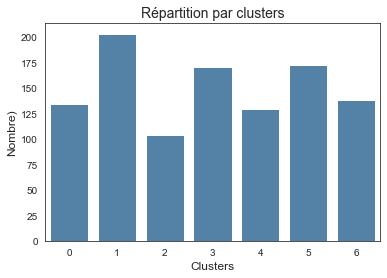

In [123]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_incrn_labels)

In [124]:
# Les catégories par clusters
df_tsne_incrn.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Baby Care                          87
         Home Furnishing                    29
         Home Decor & Festive Needs         13
         Computers                           4
         Beauty and Personal Care            1
1        Watches                           146
         Computers                          26
         Home Decor & Festive Needs         13
         Beauty and Personal Care            8
         Baby Care                           5
         Kitchen & Dining                    5
2        Computers                          95
         Watches                             4
         Beauty and Personal Care            2
         Baby Care                           1
         Home Decor & Festive Needs          1
         Kitchen & Dining                    1
3        Home Decor & Festive Needs         86
         Beauty and Personal Care           24
         Baby Care                          18
         Computers                          16
         Kitchen & Dining                   14
         Home Furnishing                    12
4        Kitchen & Dining                  108
         Home Decor & Festive Needs         16
         Baby Care                           3
         Beauty and Personal Care            1
         Computers                           1
5        Home Furnishing                   109
         Baby Care                          33
         Home Decor & Festive Needs         18
         Beauty and Personal Care            7
         Computers                           3
         Kitchen & Dining                    2
6        Beauty and Personal Care          107
         Kitchen & Dining                   20
         Computers                           5
         Baby Care                           3
         Home Decor & Festive Needs          3

**Visualisation des clusters**

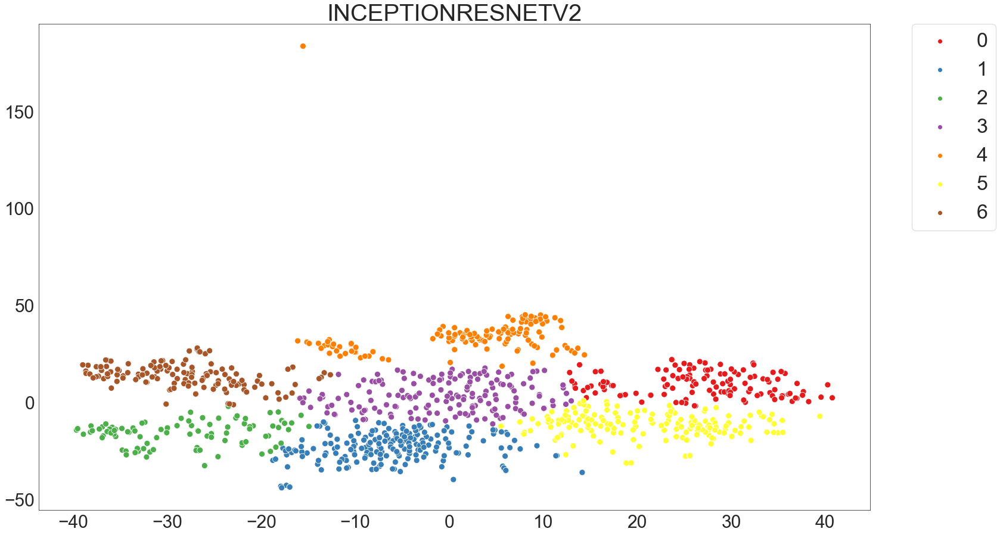

In [125]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_incrn,
                                           kmeans_tsne_incrn_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est moyen (0.45).
- Cette combinaison TSNE InceptionResNetV2 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 70%.

**Qualité de la catégorisation ?**

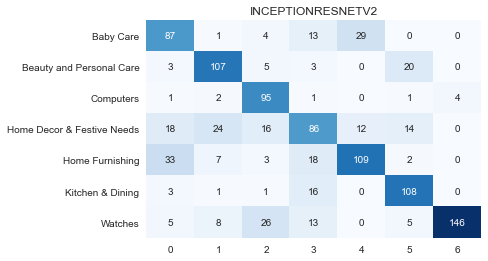

'Précision: 70.29%'

                            precision    recall  f1-score   support

                 Baby Care       0.58      0.65      0.61       134
  Beauty and Personal Care       0.71      0.78      0.74       138
                 Computers       0.63      0.91      0.75       104
Home Decor & Festive Needs       0.57      0.51      0.54       170
           Home Furnishing       0.73      0.63      0.68       172
          Kitchen & Dining       0.72      0.84      0.77       129
                   Watches       0.97      0.72      0.83       203

                  accuracy                           0.70      1050
                 macro avg       0.70      0.72      0.70      1050
              weighted avg       0.72      0.70      0.70      1050


In [126]:
dico_categories = {'0': 'Baby Care',
                   '1': 'Watches',
                   '2': 'Computers',
                   '3': 'Home Decor & Festive Needs',
                   '4': 'Kitchen & Dining',
                   '5': 'Home Furnishing',
                   '6': 'Beauty and Personal Care'}
outils_nlp.affiche_qualite_categorisation(df_tsne_incrn,
                                          dico_categories, type_donnee)

In [127]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '70',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [128]:
# Nombre d'erreur
mask = df_tsne_incrn['CATEGORIE'] == df_tsne_incrn['Cluster_labels']
df_erreur_incrn = df_tsne_incrn[~mask]
display(f'Nombre d\'erreurs : {df_erreur_incrn.shape[0]}')

"Nombre d'erreurs : 312"

**Répartition des erreurs par catégorie**

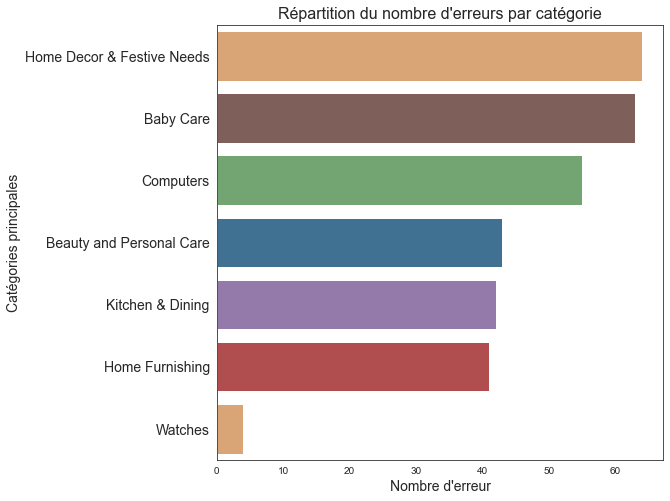

In [129]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_incrn, orient='h',
              order=df_erreur_incrn['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

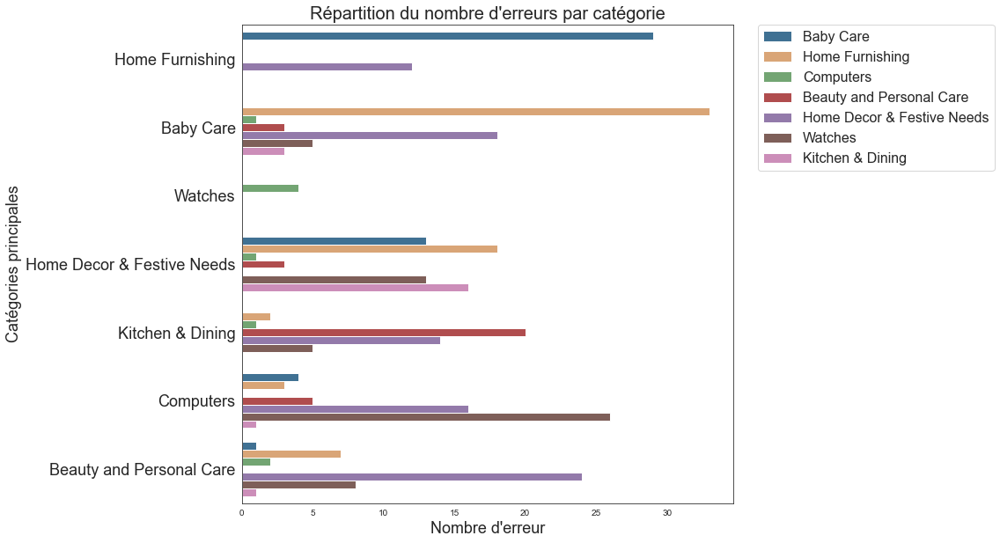

In [131]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_incrn, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [132]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [133]:
df_visu_erreur_incrn = df_erreur_incrn[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_incrn.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
672,Baby Care,,Home Decor & Festive Needs
205,Home Decor & Festive Needs,,Home Furnishing
61,Beauty and Personal Care,,Home Decor & Festive Needs
303,Home Decor & Festive Needs,,Watches
615,Baby Care,,Home Decor & Festive Needs
997,Home Decor & Festive Needs,,Baby Care
1020,Home Furnishing,,Baby Care
657,Baby Care,,Kitchen & Dining
988,Beauty and Personal Care,,Home Furnishing
650,Home Furnishing,,Baby Care


### <span style='background:PowderBlue'>3.8. MobileNetV2</span>

- L'architecture de MobileNetV2 est basée sur une structure résiduelle inversée où l'entrée et la sortie du bloc résiduel sont des couches minces de goulot d'étranglement ; contrairement aux modèles résiduels traditionnels qui utilisent des représentations étendues en entrée, MobileNetV2 utilise des convolutions légères en profondeur pour filtrer les caractéristiques dans la couche d'expansion intermédiaire. En outre, nous constatons qu'il est important de supprimer les non-linéarités dans les couches étroites afin de maintenir la puissance de représentation.
- MobileNetV2 est une architecture de réseau neuronal convolutif qui cherche à être performante sur les appareils mobiles. Il est basé sur une structure résiduelle inversée où les connexions résiduelles se trouvent entre les couches d'étranglement. La couche d'expansion intermédiaire utilise des convolutions légères en profondeur pour filtrer les caractéristiques comme source de non-linéarité. Dans l'ensemble, l'architecture de MobileNetV2 contient la couche initiale à convolution complète avec 32 filtres, suivie de 19 couches résiduelles à goulot d'étranglement.
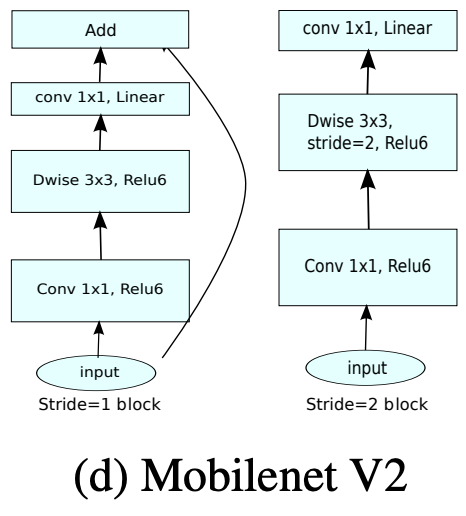
[Source](https://paperswithcode.com/method/mobilenetv2)

**Utilisation de MobileNetV2 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [134]:
# Utilisation de MobileNetV2 pré-entraîné sur ImageNet avec les images
# d'origine
# MobileNetV2 imports
from keras.applications.mobilenet_v2 import preprocess_input
from keras.applications import MobileNetV2

# Liste
mob_all_features = []

# Instanciation du modèle
model_mob = MobileNetV2(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_mob.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    mob_feature = model_mob.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    mob_all_features.append(np.array(mob_feature).flatten())

mob_all_features = np.array(mob_all_features)

9412608/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_7[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, None, None, 3 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, None, None, 3 128         Conv1[0][0]                      
________________

In [135]:
# Dataframe de sauvegarde des BOVW MobileNetV2
# Association des features à chaque image
data['mobilenetv2_bovw'] = \
    [mob_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_mob_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'mobilenetv2_bovw']]
# Constituer le dataframe de vecteurs de BOVW ResNet152V2
df_mob_vectors = pd.DataFrame.from_records(mob_all_features)

In [136]:
# Sauvegarde du dataframe des vectors BOVW MobileNetV2
with open('sauvegarde/df_mob_vectors.pickle', 'wb') as f:
    pickle.dump(df_mob_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [137]:
type_donnee = 'TSNE_MOBILENETV2'

In [138]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_mob = list()
tsne_results_mob = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_mob = \
        tsne.fit_transform(df_mob_vectors)
    results_mob.append(tsne_results_mob)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 10.955s...
[t-SNE] Computed neighbors for 1050 samples in 114.508s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 65.404951
[t-SNE] KL divergence after 250 iterations with early exaggeration: 100.166039
[t-SNE] KL divergence after 500 iterations: 1.532338
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 11.070s...
[t-SNE] Computed neighbors for 1050 samples in 115.381s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 68.448415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.025459
[t-SNE] KL divergence after 500 iterations: 1.455781
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 11.084s...
[t-SNE] Computed neighbors for 1050 sam

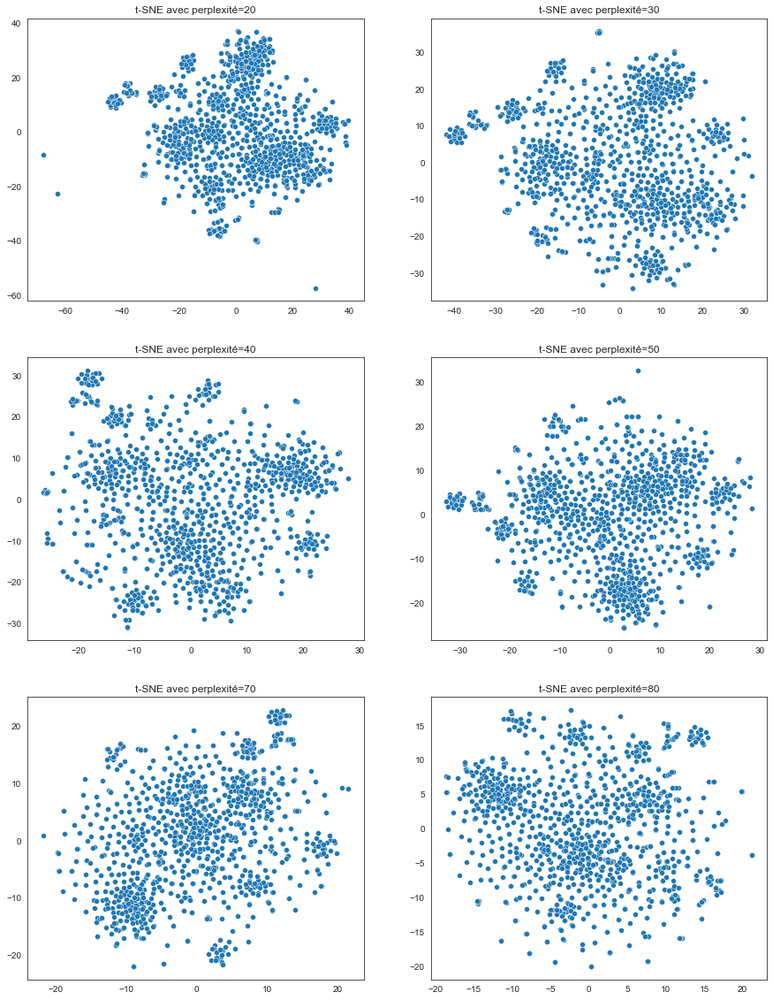

In [139]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_mob, liste_param, 1)

- groupes plus homogènes pour perplexité=50
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [140]:
%pycodestyle_off

In [142]:
# Réduction de dimension tsne
tsne_mob = TSNE(verbose=1, perplexity=50, n_iter=5000)
X_proj_tsne_mob = \
    tsne_mob.fit_transform(df_mob_vectors)
# Dataframe pour clustering
df_tsne_mob = pd.DataFrame({'VAR1' : X_proj_tsne_mob[:, 0],
                            'VAR2' : X_proj_tsne_mob[:, 1],
                            'CATEGORIE' : df_mob_bovw['Categorie_1'],
                            'IMAGE': df_mob_bovw['image'],
                            'IMAGE_LOC': df_mob_bovw['image_loc']})

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1050 samples in 11.105s...
[t-SNE] Computed neighbors for 1050 samples in 113.957s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 72.423084
[t-SNE] KL divergence after 250 iterations with early exaggeration: 90.138123
[t-SNE] KL divergence after 3650 iterations: 1.314689


In [143]:
%pycodestyle_on

**Clustering**

In [144]:
cols = ['VAR1', 'VAR2']

In [145]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_mob[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_MOBILENETV2,nan,85729.17969,0.13663,20.00000,500.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.17969,0.14210,20.00000,200.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.18750,0.14241,20.00000,300.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.17969,0.14309,20.00000,100.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.17969,0.14872,20.00000,400.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.18750,0.20005,30.00000,200.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.18750,0.20177,30.00000,100.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.18750,0.20477,30.00000,500.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.17969,0.20686,30.00000,400.00000,0.38921,0.82493
TSNE_MOBILENETV2,nan,85729.17969,0.21048,30.00000,300.00000,0.38921,0.82493


In [146]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_mob = KMeans(n_clusters=7, init='k-means++',
                         n_init=20, max_iter=500,
                         random_state=seed) \
    .fit(df_tsne_mob[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_mob['Clusters'] = kmeans_tsne_mob.labels_
kmeans_tsne_mob_labels = kmeans_tsne_mob.labels_

In [147]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_mob,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_MOBILENETV2,0.36910,0.45295,0.45896,0.45594


In [148]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,169,16.10000
1,172,16.38000
2,182,17.33000
3,146,13.90000
4,113,10.76000
5,91,8.67000
6,177,16.86000


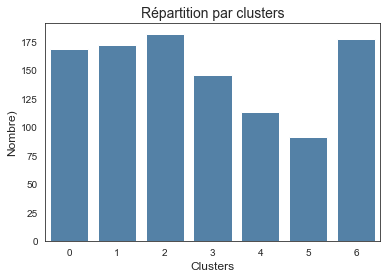

In [149]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_mob_labels)

In [150]:
# Les catégories par clusters
df_tsne_mob.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Baby Care                          92
         Home Furnishing                    44
         Home Decor & Festive Needs         18
         Beauty and Personal Care            7
         Kitchen & Dining                    6
         Computers                           2
1        Beauty and Personal Care          110
         Computers                          42
         Kitchen & Dining                   13
         Baby Care                           4
         Home Decor & Festive Needs          3
2        Watches                           147
         Home Decor & Festive Needs         16
         Computers                           9
         Baby Care                           4
         Kitchen & Dining                    4
         Beauty and Personal Care            2
3        Computers                          87
         Kitchen & Dining                   41
         Beauty and Personal Care           11
         Home Decor & Festive Needs          3
         Watches                             3
         Baby Care                           1
4        Home Furnishing                    51
         Home Decor & Festive Needs         49
         Baby Care                           9
         Beauty and Personal Care            3
         Computers                           1
5        Kitchen & Dining                   74
         Beauty and Personal Care           10
         Baby Care                           3
         Home Decor & Festive Needs          2
         Home Furnishing                     2
6        Home Decor & Festive Needs         59
         Home Furnishing                    53
         Baby Care                          37
         Kitchen & Dining                   12
         Computers                           9
         Beauty and Personal Care            7

**Visualisation des clusters**

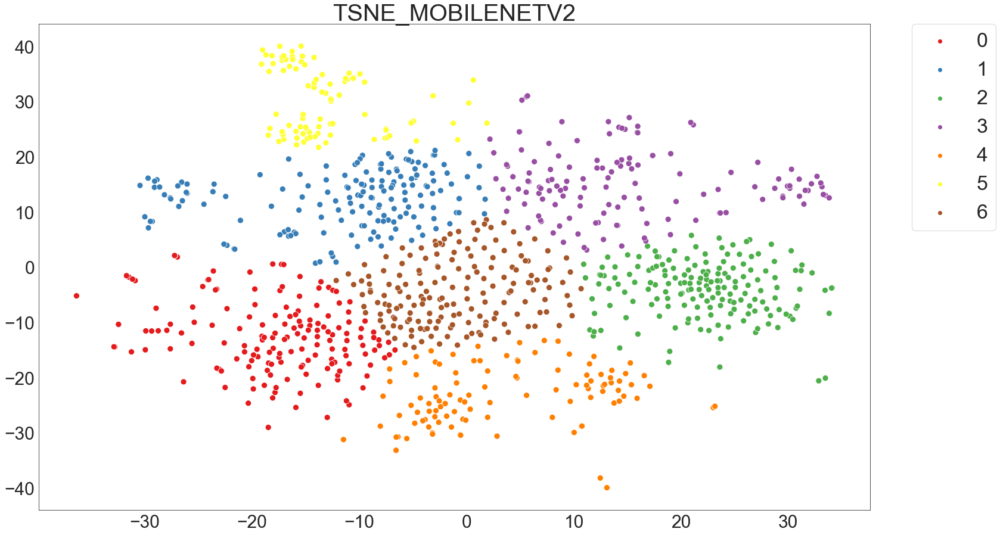

In [151]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_mob,
                                           kmeans_tsne_mob_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est moyen (0.37).
- Cette combinaison TSNE MobileNetV2 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 59%.

**Qualité de la catégorisation ?**

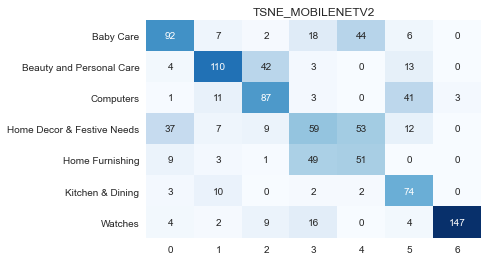

'Précision: 59.05%'

                            precision    recall  f1-score   support

                 Baby Care       0.61      0.54      0.58       169
  Beauty and Personal Care       0.73      0.64      0.68       172
                 Computers       0.58      0.60      0.59       146
Home Decor & Festive Needs       0.39      0.33      0.36       177
           Home Furnishing       0.34      0.45      0.39       113
          Kitchen & Dining       0.49      0.81      0.61        91
                   Watches       0.98      0.81      0.89       182

                  accuracy                           0.59      1050
                 macro avg       0.59      0.60      0.59      1050
              weighted avg       0.62      0.59      0.60      1050


In [152]:
dico_categories = {'0': 'Baby Care',
                   '1': 'Beauty and Personal Care',
                   '2': 'Watches',
                   '3': 'Computers',
                   '4': 'Home Furnishing',
                   '5': 'Kitchen & Dining',
                   '6': 'Home Decor & Festive Needs'}
outils_nlp.affiche_qualite_categorisation(df_tsne_mob,
                                          dico_categories, type_donnee)

In [153]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '59',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [154]:
# Nombre d'erreur
mask = df_tsne_mob['CATEGORIE'] == df_tsne_mob['Cluster_labels']
df_erreur_mob = df_tsne_mob[~mask]
display(f'Nombre d\'erreurs : {df_erreur_mob.shape[0]}')

"Nombre d'erreurs : 430"

**Répartition des erreurs par catégorie**

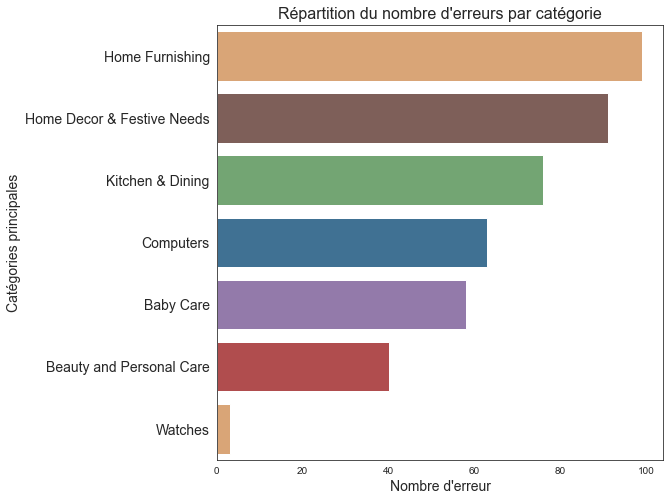

In [155]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_mob, orient='h',
              order=df_erreur_mob['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

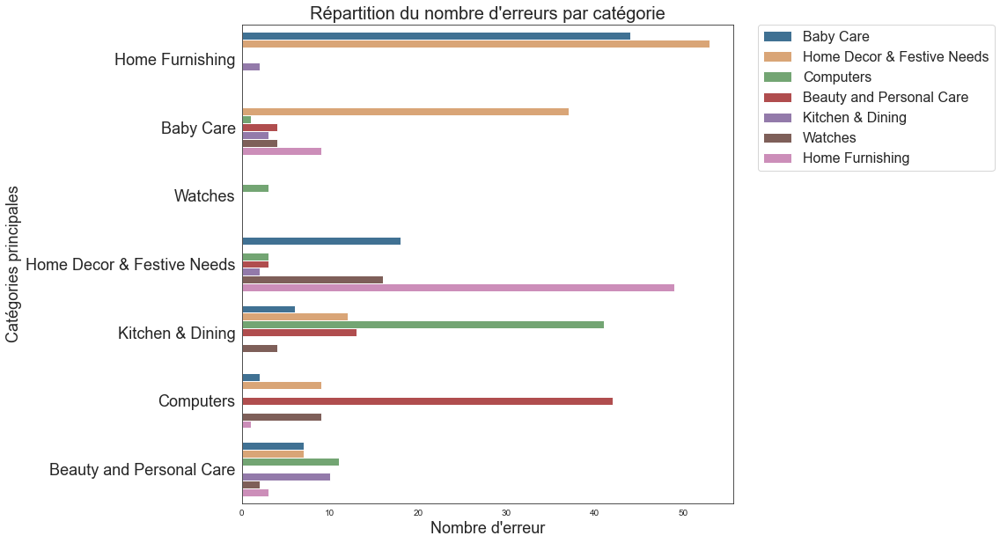

In [156]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_mob, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [157]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [158]:
df_visu_erreur_mob = df_erreur_mob[['CATEGORIE', 'IMAGE_LOC',
                                    'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_mob.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
891,Home Furnishing,,Baby Care
232,Home Decor & Festive Needs,,Home Furnishing
898,Beauty and Personal Care,,Computers
433,Computers,,Watches
883,Baby Care,,Beauty and Personal Care
958,Home Furnishing,,Home Decor & Festive Needs
231,Home Decor & Festive Needs,,Home Furnishing
407,Computers,,Beauty and Personal Care
298,Kitchen & Dining,,Beauty and Personal Care
988,Beauty and Personal Care,,Baby Care


### <span style='background:PowderBlue'>3.9. DenseNet201</span>

- DenseNet est l'une des nouvelles découvertes en matière de réseaux neuronaux pour la reconnaissance visuelle des objets. 
- DenseNet est assez similaire à ResNet avec quelques différences fondamentales. ResNet utilise une méthode additive (+) qui fusionne la couche précédente (identité) avec la couche future, alors que DenseNet concatène la sortie de la couche précédente avec la couche future.
- Dans DenseNet, chaque couche obtient des entrées supplémentaires de toutes les couches précédentes et transmet ses propres cartes de caractéristiques à toutes les couches suivantes. La concaténation est utilisée. Chaque couche reçoit des "connaissances collectives" de toutes les couches précédentes.
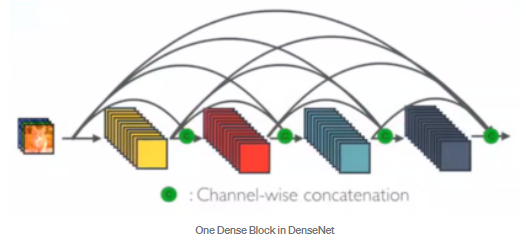
[Source](https://towardsdatascience.com/review-densenet-image-classification-b6631a8ef803)

**Utilisation de DenseNet201 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [16]:
# Utilisation de DenseNet201 pré-entraîné sur ImageNet avec les images
# d'origine
# DenseNet201 imports
from keras.applications.densenet import preprocess_input
from keras.applications import DenseNet201

# Liste
dense_all_features = []

# Instanciation du modèle
model_dense = DenseNet201(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_dense.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    dense_feature = model_dense.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    dense_all_features.append(np.array(dense_feature).flatten())

dense_all_features = np.array(dense_all_features)

Model: "densenet201"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
zero_padding2d_6 (ZeroPadding2D (None, None, None, 3 0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, None, None, 6 9408        zero_padding2d_6[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, None, None, 6 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [17]:
# Dataframe de sauvegarde des BOVW DenseNet201
# Association des features à chaque image
data['densenet201_bovw'] = \
    [dense_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_dense_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'densenet201_bovw']]
# Constituer le dataframe de vecteurs de BOVW DenseNet201
df_dense_vectors = pd.DataFrame.from_records(dense_all_features)

In [18]:
# Sauvegarde du dataframe des vectors BOVW DenseNet201
with open('sauvegarde/df_dense_vectors.pickle', 'wb') as f:
    pickle.dump(df_dense_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [162]:
type_donnee = 'TSNE_DENSENET201'

In [163]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_dense = list()
tsne_results_dense = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_dense = \
        tsne.fit_transform(df_dense_vectors)
    results_dense.append(tsne_results_dense)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 17.885s...
[t-SNE] Computed neighbors for 1050 samples in 170.389s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 68.191557
[t-SNE] KL divergence after 250 iterations with early exaggeration: 96.943039
[t-SNE] KL divergence after 500 iterations: 1.416076
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 17.820s...
[t-SNE] Computed neighbors for 1050 samples in 170.773s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 71.595244
[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.045006
[t-SNE] KL divergence after 500 iterations: 1.362098
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 18.041s...
[t-SNE] Computed neighbors for 1050 samp

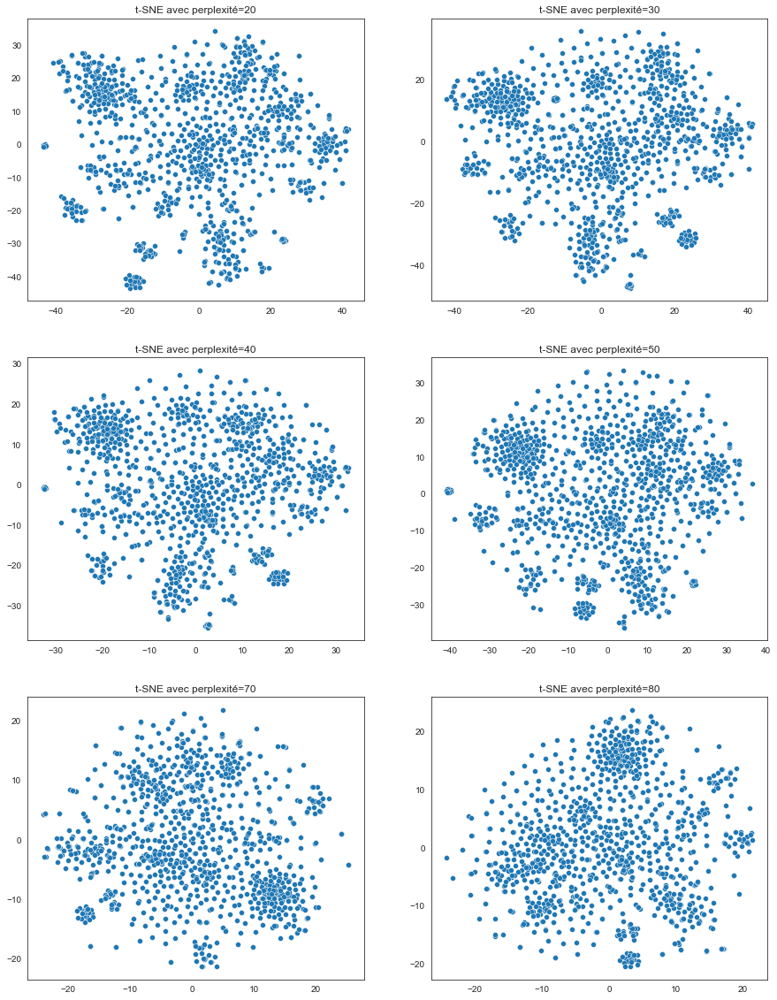

In [164]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_dense, liste_param, 1)

- groupes plus homogènes pour perplexité=70
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [165]:
%pycodestyle_off

In [166]:
# Réduction de dimension tsne
tsne_dense = TSNE(verbose=1, perplexity=70, n_iter=5000)
X_proj_tsne_dense = \
    tsne_dense.fit_transform(df_dense_vectors)
# Dataframe pour clustering
df_tsne_dense = pd.DataFrame({'VAR1' : X_proj_tsne_dense[:, 0],
                              'VAR2' : X_proj_tsne_dense[:, 1],
                              'CATEGORIE' : df_dense_bovw['Categorie_1'],
                              'IMAGE': df_dense_bovw['image'],
                              'IMAGE_LOC': df_dense_bovw['image_loc']})

[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 1050 samples in 17.935s...
[t-SNE] Computed neighbors for 1050 samples in 170.477s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 79.676929
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.022675
[t-SNE] KL divergence after 2500 iterations: 1.131113


In [167]:
%pycodestyle_on

**Clustering**

In [168]:
cols = ['VAR1', 'VAR2']

In [169]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_dense[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_DENSENET201,nan,35657.54297,0.06032,10.00000,200.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.54297,0.06326,10.00000,300.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.54297,0.06499,10.00000,400.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.54297,0.07562,10.00000,500.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.54297,0.11585,20.00000,200.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.53906,0.11585,20.00000,400.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.54297,0.11937,20.00000,100.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.54297,0.12236,20.00000,500.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.54297,0.13148,20.00000,300.00000,0.42124,0.76501
TSNE_DENSENET201,nan,35657.00781,0.18455,30.00000,300.00000,0.42124,0.76501


In [171]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_dense = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=400,
                           random_state=seed) \
    .fit(df_tsne_dense[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_dense['Clusters'] = kmeans_tsne_dense.labels_
kmeans_tsne_dense_labels = kmeans_tsne_dense.labels_

In [172]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_dense,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_DENSENET201,0.46665,0.53132,0.54115,0.53619


In [173]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,169,16.10000
1,137,13.05000
2,108,10.29000
3,186,17.71000
4,182,17.33000
5,185,17.62000
6,83,7.90000


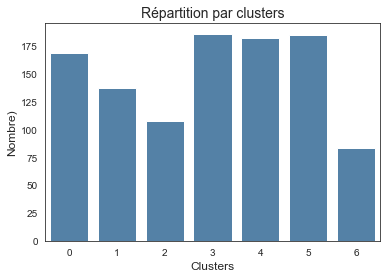

In [174]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_dense_labels)

In [175]:
# Les catégories par clusters
df_tsne_dense.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Baby Care                          91
         Home Decor & Festive Needs         60
         Home Furnishing                    10
         Computers                           5
         Kitchen & Dining                    2
         Beauty and Personal Care            1
1        Beauty and Personal Care          116
         Computers                           7
         Home Decor & Festive Needs          6
         Baby Care                           4
         Kitchen & Dining                    4
2        Computers                          93
         Kitchen & Dining                    7
         Beauty and Personal Care            4
         Watches                             3
         Home Decor & Festive Needs          1
3        Home Furnishing                   135
         Baby Care                          35
         Home Decor & Festive Needs          9
         Beauty and Personal Care            6
         Computers                           1
4        Watches                           144
         Home Decor & Festive Needs         11
         Computers                           9
         Beauty and Personal Care            7
         Kitchen & Dining                    5
         Baby Care                           4
         Home Furnishing                     2
5        Home Decor & Festive Needs         60
         Kitchen & Dining                   56
         Computers                          35
         Baby Care                          16
         Beauty and Personal Care           13
         Watches                             3
         Home Furnishing                     2
6        Kitchen & Dining                   76
         Beauty and Personal Care            3
         Home Decor & Festive Needs          3
         Home Furnishing                     1

**Visualisation des clusters**

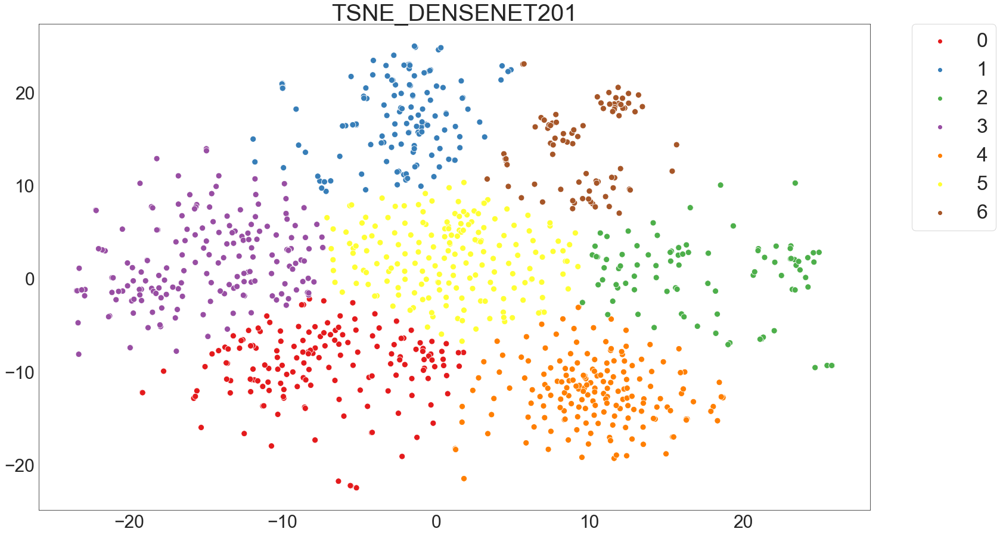

In [177]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_dense,
                                           kmeans_tsne_dense_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est  (0.47).
- Cette combinaison TSNE DenseNet201 sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client avec la précision 68%.

**Qualité de la catégorisation ?**

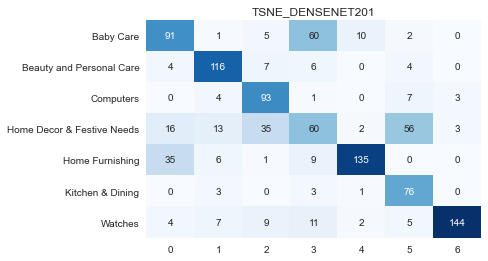

'Précision: 68.1%'

                            precision    recall  f1-score   support

                 Baby Care       0.61      0.54      0.57       169
  Beauty and Personal Care       0.77      0.85      0.81       137
                 Computers       0.62      0.86      0.72       108
Home Decor & Festive Needs       0.40      0.32      0.36       185
           Home Furnishing       0.90      0.73      0.80       186
          Kitchen & Dining       0.51      0.92      0.65        83
                   Watches       0.96      0.79      0.87       182

                  accuracy                           0.68      1050
                 macro avg       0.68      0.71      0.68      1050
              weighted avg       0.70      0.68      0.68      1050


In [178]:
dico_categories = {'0': 'Baby Care',
                   '1': 'Beauty and Personal Care',
                   '2': 'Computers',
                   '3': 'Home Furnishing',
                   '4': 'Watches',
                   '5': 'Home Decor & Festive Needs',
                   '6': 'Kitchen & Dining'}
outils_nlp.affiche_qualite_categorisation(df_tsne_dense,
                                          dico_categories, type_donnee)

In [179]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '68',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [180]:
# Nombre d'erreur
mask = df_tsne_dense['CATEGORIE'] == df_tsne_dense['Cluster_labels']
df_erreur_dense = df_tsne_dense[~mask]
display(f'Nombre d\'erreurs : {df_erreur_dense.shape[0]}')

"Nombre d'erreurs : 335"

**Répartition des erreurs par catégorie**

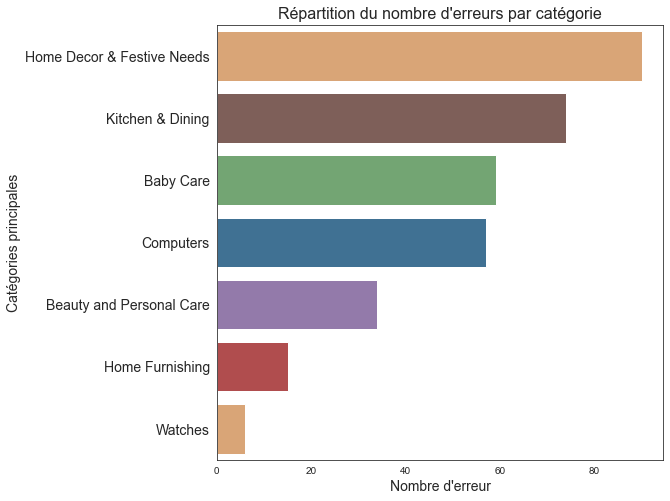

In [181]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_dense, orient='h',
              order=df_erreur_dense['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

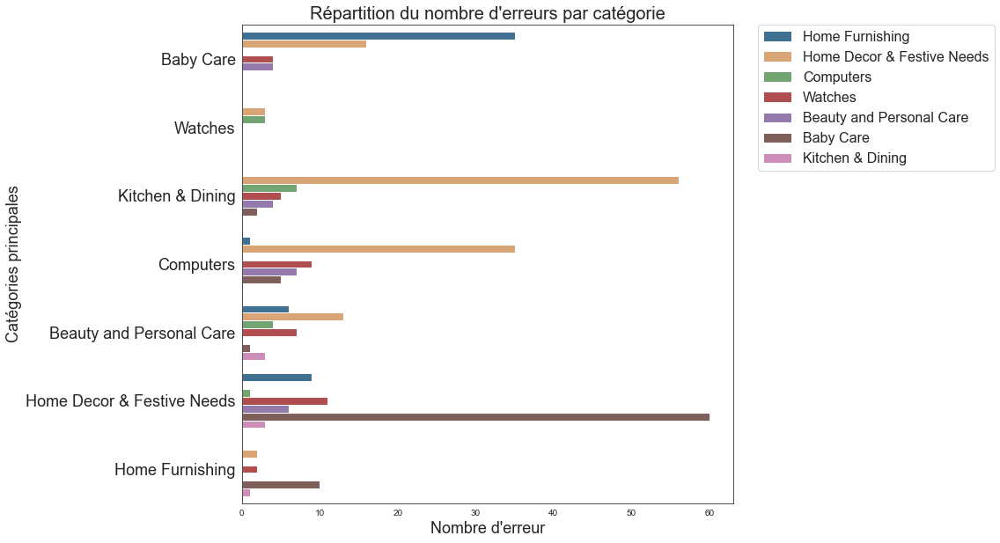

In [182]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_dense, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [183]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [184]:
df_visu_erreur_dense = df_erreur_dense[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_dense.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
37,Kitchen & Dining,,Home Decor & Festive Needs
231,Home Decor & Festive Needs,,Baby Care
116,Home Decor & Festive Needs,,Baby Care
214,Home Decor & Festive Needs,,Baby Care
700,Home Furnishing,,Home Decor & Festive Needs
54,Computers,,Watches
63,Baby Care,,Home Furnishing
947,Home Decor & Festive Needs,,Baby Care
443,Home Furnishing,,Kitchen & Dining
195,Home Decor & Festive Needs,,Baby Care


### <span style='background:PowderBlue'>3.10. NASNetLarge</span>

- NASNetLarge (Neural Architecture Search Network), développé purement par l'environnement d'apprentissage par renforcement de Google (NAS- Neural Architecture Search) sans intervention humaine, est l'une des architectures les plus populaires. 
- La partie réseau neuronal à convolution de l'architecture est appelée la base, et la partie réseau neuronal artificiel (avec des couches denses) est appelée la tête. La base extrait les caractéristiques des images d'entrée. La tête effectue la classification en utilisant les caractéristiques extraites.
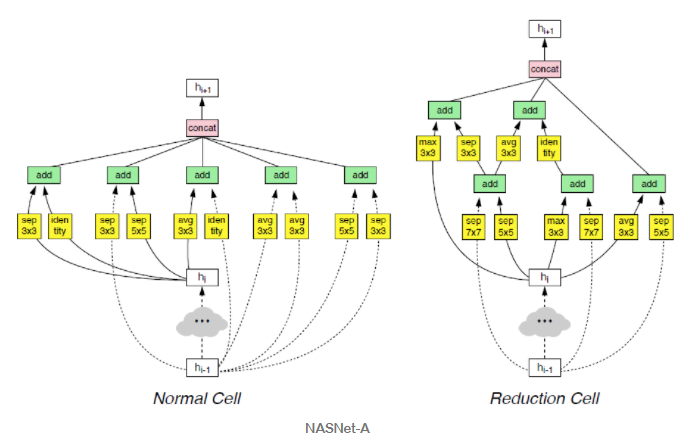
[Source](https://analyticsindiamag.com/transfer-learning-using-tensorflow-keras/)

**Utilisation de NASNetLarge pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [185]:
# Utilisation de NASNetLarge pré-entraîné sur ImageNet avec les images
# d'origine
# NASNetLarge imports
from keras.applications.resnet_v2 import preprocess_input
from keras.applications import NASNetLarge

# Liste
nas_all_features = []

# Instanciation du modèle
model_nas = NASNetLarge(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_nas.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    nas_feature = model_nas.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    nas_all_features.append(np.array(nas_feature).flatten())

nas_all_features = np.array(nas_all_features)

343613440/343610240 [==============================] - 14s 0us/step
Model: "NASNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 331, 331, 3) 0                                            
__________________________________________________________________________________________________
stem_conv1 (Conv2D)             (None, 165, 165, 96) 2592        input_9[0][0]                    
__________________________________________________________________________________________________
stem_bn1 (BatchNormalization)   (None, 165, 165, 96) 384         stem_conv1[0][0]                 
__________________________________________________________________________________________________
activation_391 (Activation)     (None, 165, 165, 96) 0           stem_bn1[0][0]                   
_________________________

__________________________________________________________________________________________________
separable_conv_1_pad_reduction_ (None, 27, 27, 672)  0           activation_573[0][0]             
__________________________________________________________________________________________________
activation_575 (Activation)     (None, 21, 21, 672)  0           adjust_bn_reduce_12[0][0]        
__________________________________________________________________________________________________
reduction_add_1_reduce_12 (Add) (None, 11, 11, 672)  0           separable_conv_2_bn_reduction_lef
                                                                 separable_conv_2_bn_reduction_rig
__________________________________________________________________________________________________
separable_conv_1_reduction_righ (None, 11, 11, 672)  484512      separable_conv_1_pad_reduction_ri
__________________________________________________________________________________________________
separable_

In [186]:
# Dataframe de sauvegarde des BOVW NASNetLarge
# Association des features à chaque image
data['nasnetlarge_bovw'] = \
    [nas_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_nas_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'nasnetlarge_bovw']]
# Constituer le dataframe de vecteurs de BOVW NASNetLarge
df_nas_vectors = pd.DataFrame.from_records(rn152v2_all_features)

In [187]:
# Sauvegarde du dataframe des vectors BOVW NASNetLarge
with open('sauvegarde/df_nas_vectors.pickle', 'wb') as f:
    pickle.dump(df_nas_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [188]:
type_donnee = 'TSNE_NASNETLARGE'

In [189]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_nas = list()
tsne_results_nas = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_nas = \
        tsne.fit_transform(df_nas_vectors)
    results_nas.append(tsne_results_nas)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.115s...
[t-SNE] Computed neighbors for 1050 samples in 179.858s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 141.534082
[t-SNE] KL divergence after 250 iterations with early exaggeration: 102.967896
[t-SNE] KL divergence after 500 iterations: 1.646557
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.039s...
[t-SNE] Computed neighbors for 1050 samples in 179.794s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 151.125795
[t-SNE] KL divergence after 250 iterations with early exaggeration: 99.656456
[t-SNE] KL divergence after 500 iterations: 1.527803
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 19.120s...
[t-SNE] Computed neighbors for 1050 s

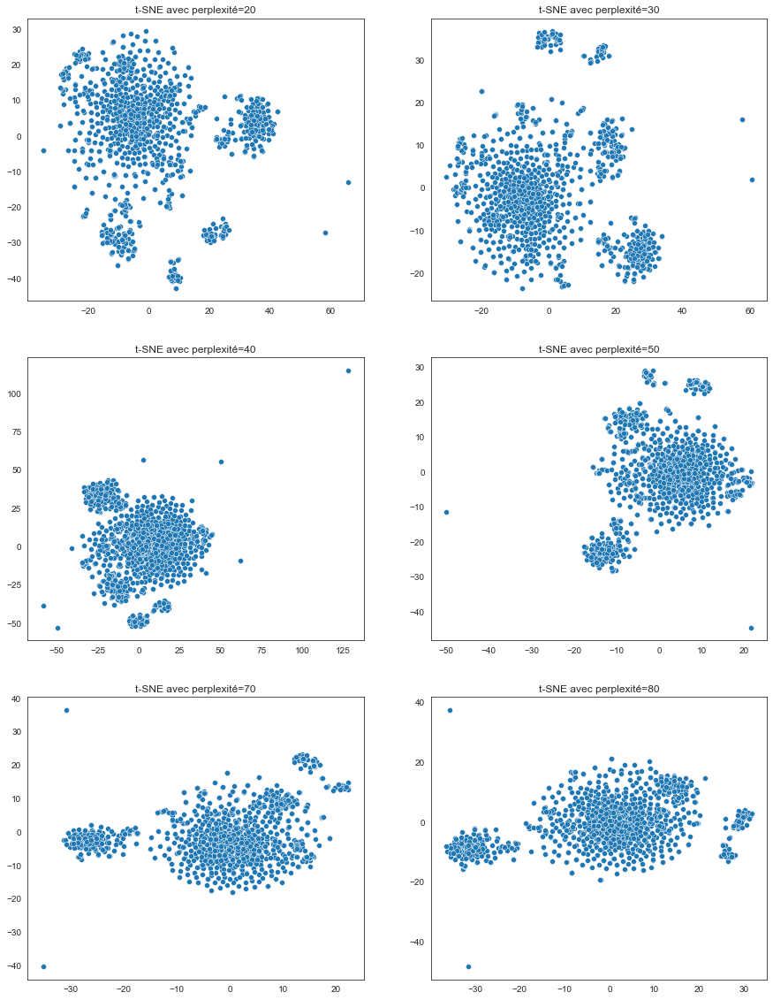

In [190]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_nas, liste_param, 1)

- groupes plus homogènes pour perplexité=80
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [194]:
%pycodestyle_off

In [195]:
# Réduction de dimension tsne
tsne_nas = TSNE(verbose=1, perplexity=80, n_iter=5000)
X_proj_tsne_nas = \
    tsne_nas.fit_transform(df_nas_vectors)
# Dataframe pour clustering
df_tsne_nas = pd.DataFrame({'VAR1' : X_proj_tsne_nas[:, 0],
                            'VAR2' : X_proj_tsne_nas[:, 1],
                            'CATEGORIE' : df_nas_bovw['Categorie_1'],
                            'IMAGE': df_nas_bovw['image'],
                            'IMAGE_LOC': df_nas_bovw['image_loc']})

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 1050 samples in 21.466s...
[t-SNE] Computed neighbors for 1050 samples in 179.818s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 172.473469
[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.711098
[t-SNE] KL divergence after 3450 iterations: 1.149513


In [196]:
%pycodestyle_on

**Clustering**

In [197]:
cols = ['VAR1', 'VAR2']

In [198]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_nas[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_NASNETLARGE,nan,18098.57812,0.11086,20.00000,500.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.11586,20.00000,100.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.11590,20.00000,200.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.11804,20.00000,300.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.12541,20.00000,400.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.16898,30.00000,300.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.16922,30.00000,500.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.16922,30.00000,200.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.16931,30.00000,400.00000,0.42450,0.70203
TSNE_NASNETLARGE,nan,18098.57812,0.16951,30.00000,100.00000,0.42450,0.70203


In [200]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_nas = KMeans(n_clusters=7, init='k-means++',
                         n_init=20, max_iter=500,
                         random_state=seed) \
    .fit(df_tsne_nas[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_nas['Clusters'] = kmeans_tsne_nas.labels_
kmeans_tsne_nas_labels = kmeans_tsne_nas.labels_

In [201]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_nas,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_NASNETLARGE,0.37664,0.47016,0.53196,0.49916


In [202]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,189,18.00000
1,153,14.57000
2,214,20.38000
3,81,7.71000
4,294,28.00000
5,1,0.10000
6,118,11.24000


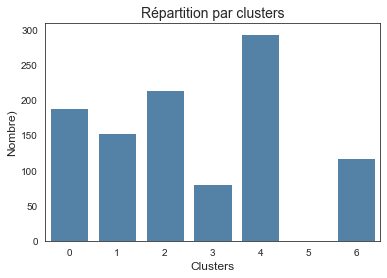

In [203]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_nas_labels)

In [204]:
# Les catégories par clusters
df_tsne_nas.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Beauty and Personal Care          116
         Computers                          28
         Kitchen & Dining                   20
         Home Furnishing                    12
         Home Decor & Festive Needs          8
         Baby Care                           5
1        Watches                           145
         Home Decor & Festive Needs          4
         Beauty and Personal Care            3
         Baby Care                           1
2        Baby Care                          99
         Home Furnishing                    92
         Home Decor & Festive Needs         12
         Computers                           8
         Beauty and Personal Care            3
3        Kitchen & Dining                   80
         Beauty and Personal Care            1
4        Home Decor & Festive Needs        121
         Home Furnishing                    46
         Baby Care                          44
         Computers                          40
         Beauty and Personal Care           27
         Kitchen & Dining                   13
         Watches                             3
5        Home Decor & Festive Needs          1
6        Computers                          74
         Kitchen & Dining                   37
         Home Decor & Festive Needs          4
         Watches                             2
         Baby Care                           1

**Visualisation des clusters**

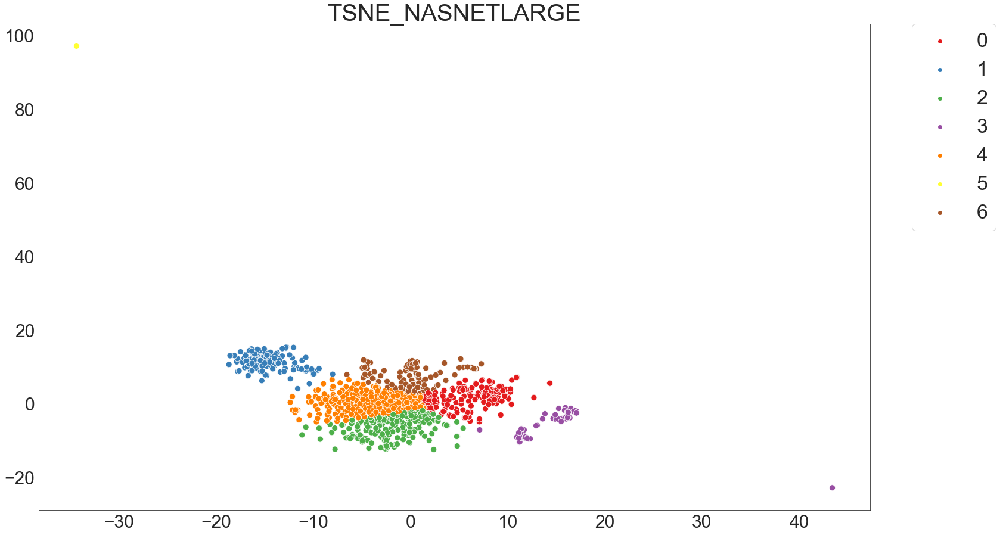

In [205]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_nas,
                                           kmeans_tsne_nas_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est moyen (0.38).
- Cette combinaison TSNE NASNetLarge sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client.
- Il manque la catégorie 'Kitchen & Dining'. 

**Qualité de la catégorisation ?**

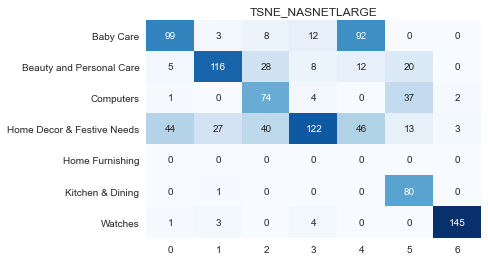

'Précision: 60.57%'

                            precision    recall  f1-score   support

                 Baby Care       0.66      0.46      0.54       214
  Beauty and Personal Care       0.77      0.61      0.68       189
                 Computers       0.49      0.63      0.55       118
Home Decor & Festive Needs       0.81      0.41      0.55       295
           Home Furnishing       0.00      0.00      0.00         0
          Kitchen & Dining       0.53      0.99      0.69        81
                   Watches       0.97      0.95      0.96       153

                  accuracy                           0.61      1050
                 macro avg       0.61      0.58      0.57      1050
              weighted avg       0.74      0.61      0.64      1050


In [206]:
dico_categories = {'0': 'Beauty and Personal Care',
                   '1': 'Watches',
                   '2': 'Baby Care',
                   '3': 'Kitchen & Dining',
                   '4': 'Home Decor & Festive Needs',
                   '5': 'Home Decor & Festive Needs',
                   '6': 'Computers'}
outils_nlp.affiche_qualite_categorisation(df_tsne_nas,
                                          dico_categories, type_donnee)

In [207]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '61',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [209]:
# Nombre d'erreur
mask = df_tsne_nas['CATEGORIE'] == df_tsne_nas['Cluster_labels']
df_erreur_nas = df_tsne_nas[~mask]
display(f'Nombre d\'erreurs : {df_erreur_nas.shape[0]}')

"Nombre d'erreurs : 414"

**Répartition des erreurs par catégorie**

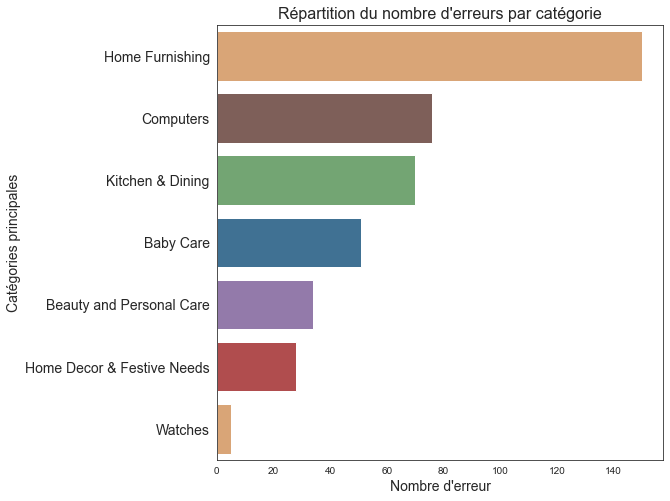

In [210]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_nas, orient='h',
              order=df_erreur_nas['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

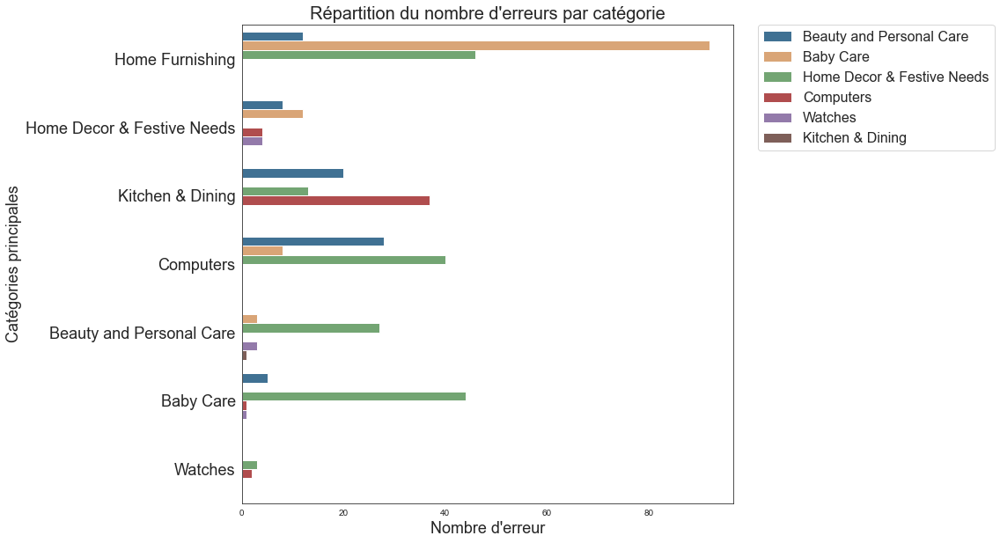

In [211]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_nas, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [212]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [215]:
df_visu_erreur_nas = df_erreur_nas[['CATEGORIE', 'IMAGE_LOC',
                                    'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_nas.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
992,Kitchen & Dining,,Computers
274,Kitchen & Dining,,Computers
591,Home Furnishing,,Home Decor & Festive Needs
818,Home Furnishing,,Baby Care
889,Baby Care,,Home Decor & Festive Needs
1036,Computers,,Home Decor & Festive Needs
672,Baby Care,,Home Decor & Festive Needs
34,Home Furnishing,,Baby Care
743,Kitchen & Dining,,Beauty and Personal Care
816,Home Decor & Festive Needs,,Watches


### <span style='background:PowderBlue'>3.11. EfficientNetB7</span>

- Les EfficientNets sont une famille d'architectures de réseaux neuronaux publiées par Google en 2019 qui ont été conçues par une procédure d'optimisation qui maximise la précision pour un coût de calcul donné.
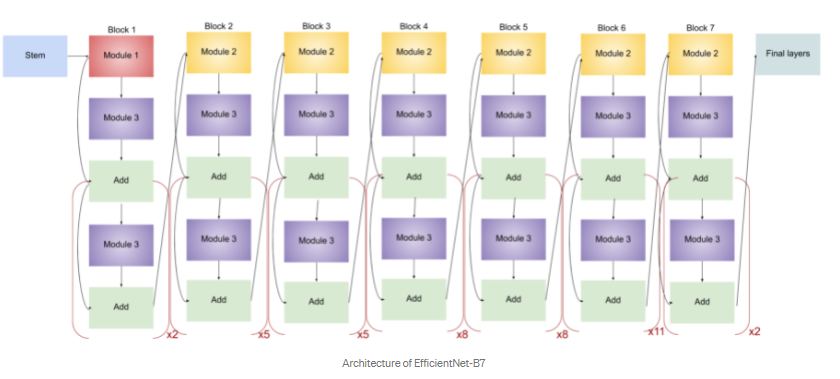
[Source](https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/pretrained-snippets/efficientnet---pretrained) 
[Source](https://towardsdatascience.com/complete-architectural-details-of-all-efficientnet-models-5fd5b736142) 

**Utilisation de EfficientNetB7 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [221]:
# Utilisation de EfficientNetB7 pré-entraîné sur ImageNet avec les images
# d'origine
# EfficientNetB7 imports
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.applications import EfficientNetB7

# Liste
eff_all_features = []

# Instanciation du modèle
model_eff = EfficientNetB7(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_eff.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    eff_feature = model_eff.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    eff_all_features.append(np.array(eff_feature).flatten())

eff_all_features = np.array(eff_all_features)

In [223]:
# Dataframe de sauvegarde des BOVW EfficientNetB7
# Association des features à chaque image
data['efficientnetb7_bovw'] = \
    [eff_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_eff_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'efficientnetb7_bovw']]
# Constituer le dataframe de vecteurs de BOVW EfficientNetB7
df_eff_vectors = pd.DataFrame.from_records(eff_all_features)

In [224]:
# Sauvegarde du dataframe des vectors BOVW EfficientNetB7
with open('sauvegarde/df_eff_vectors.pickle', 'wb') as f:
    pickle.dump(df_eff_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [225]:
type_donnee = 'TSNE_EFFICIENTNETB7'

In [226]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_eff = list()
tsne_results_eff = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_eff = \
        tsne.fit_transform(df_eff_vectors)
    results_eff.append(tsne_results_eff)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

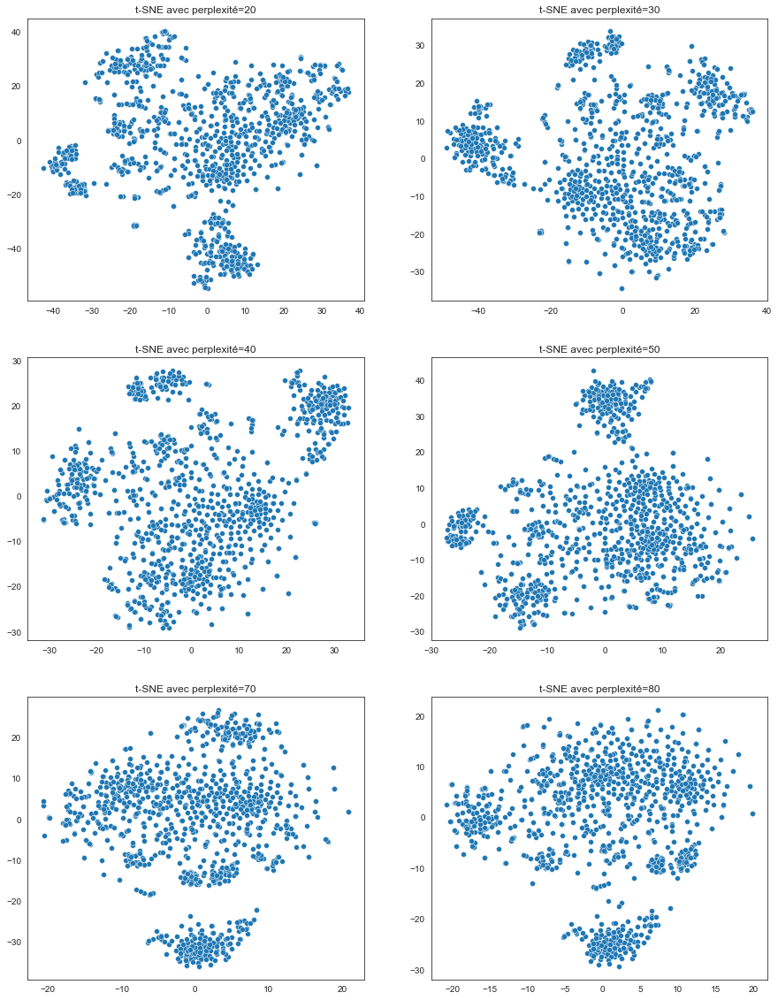

In [227]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_eff, liste_param, 1)

- groupes plus homogènes pour perplexité=80
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [228]:
%pycodestyle_off

In [230]:
# Réduction de dimension tsne
tsne_eff = TSNE(verbose=1, perplexity=80, n_iter=5000)
X_proj_tsne_eff = \
    tsne_eff.fit_transform(df_eff_vectors)
# Dataframe pour clustering
df_tsne_eff = pd.DataFrame({'VAR1' : X_proj_tsne_eff[:, 0],
                            'VAR2' : X_proj_tsne_eff[:, 1],
                            'CATEGORIE' : df_eff_bovw['Categorie_1'],
                            'IMAGE': df_eff_bovw['image'],
                            'IMAGE_LOC': df_eff_bovw['image_loc']})

In [231]:
%pycodestyle_on

**Clustering**

In [232]:
cols = ['VAR1', 'VAR2']

In [233]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_eff[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_EFFICIENTNETB7,nan,34750.99609,0.41636,70.00000,400.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34750.99609,0.41648,70.00000,500.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34751.00000,0.48553,80.00000,100.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34750.99609,0.59153,100.00000,500.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34751.21875,0.04686,10.00000,300.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34751.21484,0.05441,10.00000,500.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34751.21484,0.05683,10.00000,100.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34751.21875,0.06249,10.00000,400.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34751.21484,0.06899,10.00000,200.00000,0.46275,0.74323
TSNE_EFFICIENTNETB7,nan,34751.21875,0.09923,20.00000,100.00000,0.46275,0.74323


In [235]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_eff = KMeans(n_clusters=7, init='k-means++',
                         n_init=70, max_iter=400,
                         random_state=seed) \
    .fit(df_tsne_eff[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_eff['Clusters'] = kmeans_tsne_eff.labels_
kmeans_tsne_eff_labels = kmeans_tsne_eff.labels_

In [236]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_eff,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_EFFICIENTNETB7,0.44901,0.51200,0.51496,0.51348


In [237]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,185,17.62000
1,146,13.90000
2,152,14.48000
3,149,14.19000
4,159,15.14000
5,154,14.67000
6,105,10.00000


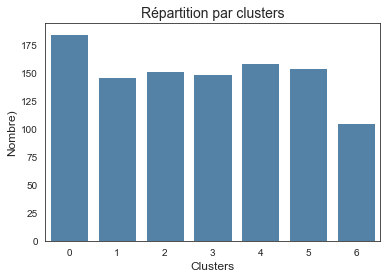

In [238]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_eff_labels)

In [239]:
# Les catégories par clusters
df_tsne_eff.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Home Decor & Festive Needs        101
         Computers                          28
         Baby Care                          22
         Kitchen & Dining                   16
         Beauty and Personal Care            9
         Home Furnishing                     8
         Watches                             1
1        Home Furnishing                    68
         Baby Care                          67
         Home Decor & Festive Needs          7
         Beauty and Personal Care            3
         Kitchen & Dining                    1
2        Watches                           145
         Home Decor & Festive Needs          5
         Baby Care                           1
         Kitchen & Dining                    1
3        Beauty and Personal Care          112
         Computers                          12
         Kitchen & Dining                   11
         Baby Care                          10
         Home Decor & Festive Needs          4
4        Kitchen & Dining                  114
         Beauty and Personal Care           16
         Home Decor & Festive Needs         14
         Baby Care                           7
         Computers                           7
         Home Furnishing                     1
5        Home Furnishing                    73
         Baby Care                          41
         Home Decor & Festive Needs         17
         Computers                          11
         Beauty and Personal Care            7
         Kitchen & Dining                    5
6        Computers                          92
         Watches                             4
         Beauty and Personal Care            3
         Baby Care                           2
         Home Decor & Festive Needs          2
         Kitchen & Dining                    2

**Visualisation des clusters**

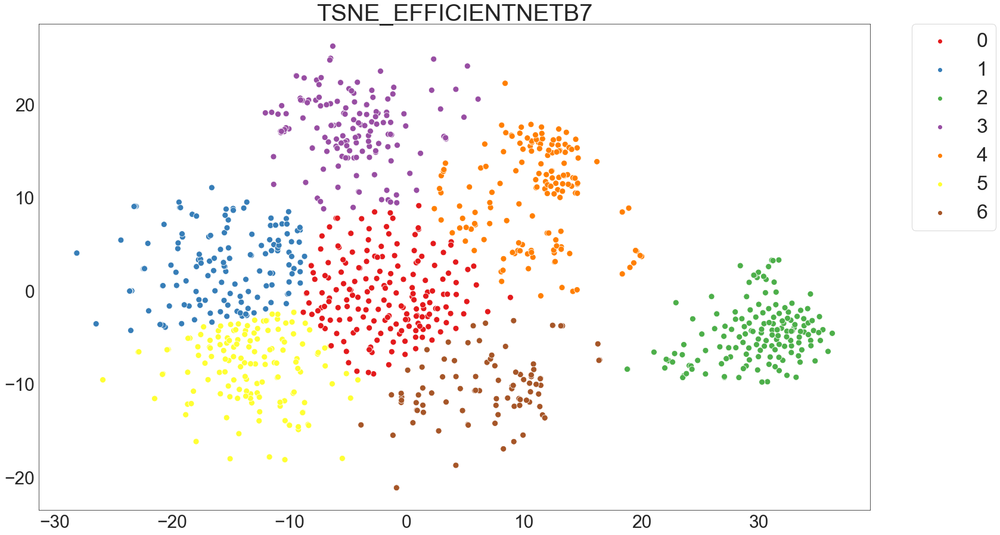

In [240]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_eff,
                                           kmeans_tsne_eff_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est moyen haut (0.45).
- Cette combinaison TSNE NASNetLarge sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client. 
- Il manque la catégorie 'Baby Care'. 

**Qualité de la catégorisation ?**

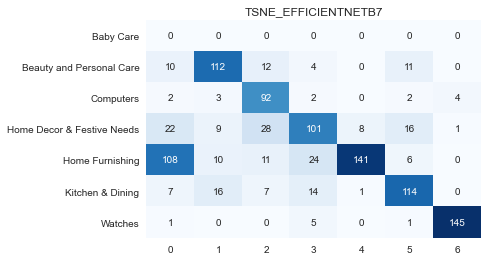

'Précision: 67.14%'

                            precision    recall  f1-score   support

                 Baby Care       0.00      0.00      0.00         0
  Beauty and Personal Care       0.75      0.75      0.75       149
                 Computers       0.61      0.88      0.72       105
Home Decor & Festive Needs       0.67      0.55      0.60       185
           Home Furnishing       0.94      0.47      0.63       300
          Kitchen & Dining       0.76      0.72      0.74       159
                   Watches       0.97      0.95      0.96       152

                  accuracy                           0.67      1050
                 macro avg       0.67      0.62      0.63      1050
              weighted avg       0.81      0.67      0.71      1050


In [241]:
dico_categories = {'0': 'Home Decor & Festive Needs',
                   '1': 'Home Furnishing',
                   '2': 'Watches',
                   '3': 'Beauty and Personal Care',
                   '4': 'Kitchen & Dining',
                   '5': 'Home Furnishing',
                   '6': 'Computers'}
outils_nlp.affiche_qualite_categorisation(df_tsne_eff,
                                          dico_categories, type_donnee)

In [258]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '67',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [246]:
# Nombre d'erreur
mask = df_tsne_eff['CATEGORIE'] == df_tsne_eff['Cluster_labels']
df_erreur_eff = df_tsne_eff[~mask]
display(f'Nombre d\'erreurs : {df_erreur_eff.shape[0]}')

"Nombre d'erreurs : 345"

**Répartition des erreurs par catégorie**

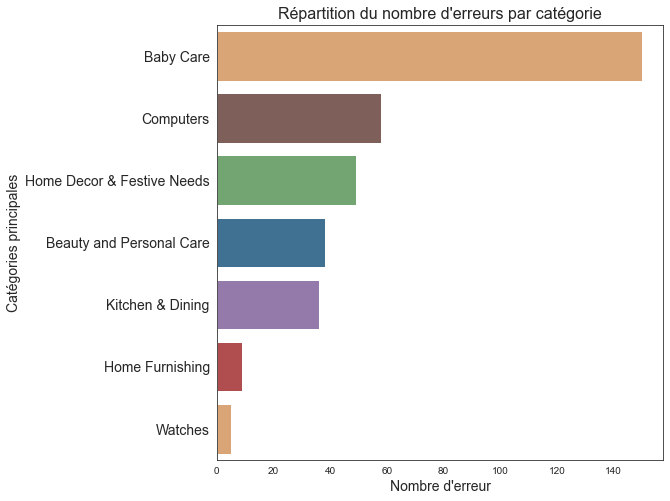

In [247]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_eff, orient='h',
              order=df_erreur_eff['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

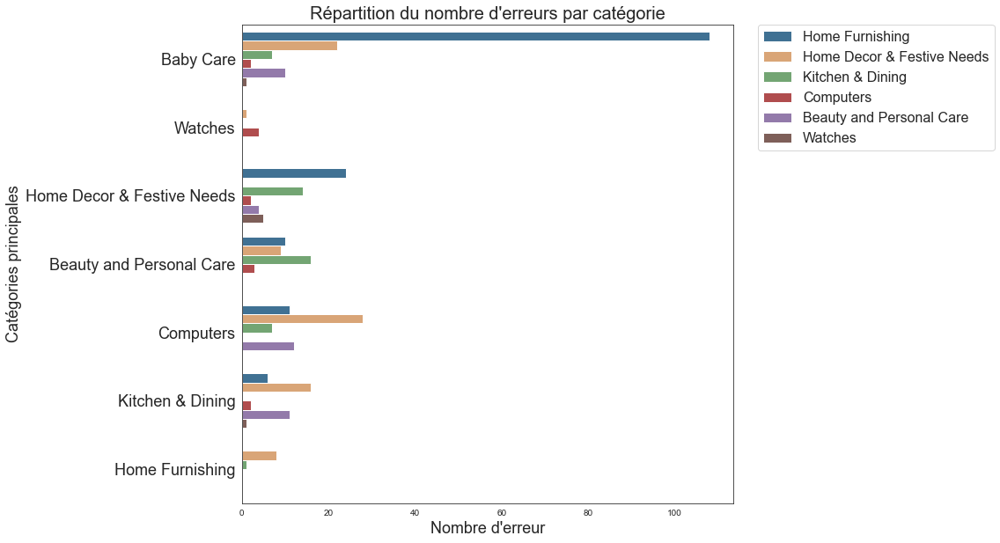

In [248]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_eff, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [249]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [253]:
df_visu_erreur_eff = df_erreur_eff[['CATEGORIE', 'IMAGE_LOC',
                                    'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_eff.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
343,Computers,,Kitchen & Dining
894,Home Furnishing,,Home Decor & Festive Needs
334,Beauty and Personal Care,,Home Decor & Festive Needs
783,Baby Care,,Home Furnishing
639,Computers,,Kitchen & Dining
883,Baby Care,,Beauty and Personal Care
898,Beauty and Personal Care,,Home Decor & Festive Needs
300,Kitchen & Dining,,Home Decor & Festive Needs
666,Baby Care,,Kitchen & Dining
599,Baby Care,,Home Furnishing


### <span style='background:PowderBlue'>3.12. Combinaison données textuelles et données images</span>

Le but est de combiner les matrices denses réduites des 2 meilleurs algorithmes des données textuelles et des données images :
- [X] InceptionV3 (Images, ARI=0.73, Accuracy=0.87)
- [X] Use (version 5, textes, ARI=0.51, Accuracy=0.74)

**Concaténation des données textuelles et images**

In [38]:
# Chargement de la matrice dense réduite par TSNE des données :
# textuelles USE version 5 pour les produits spécifications lemmatisés
with open('sauvegarde/df_tsne_use5_prod_lem.pickle', 'rb') as vectors:
    df_tsne_use5_prod_lem = pickle.load(vectors)

In [56]:
# Chargement de la matrice dense réduite par TSNE des données :
# images InceptionV3
with open('sauvegarde/df_tsne_incep.pickle', 'rb') as vectors:
    df_tsne_incep = pickle.load(vectors)

In [61]:
# Concaténation des matrices denses réduites des données textuelles et
# des images
df_tsne = pd.concat([df_tsne_use5_prod_lem[cols], df_tsne_incep[cols]],
                    axis=1, ignore_index=True)

**ÉTAPE 2 - Réduction de dimension**

In [63]:
type_donnee = 'TSNE_COMBI_USE5_INCEPTIONV3'

In [65]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_combi = list()
tsne_results_combi = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_combi = \
        tsne.fit_transform(df_tsne)
    results_combi.append(tsne_results_combi)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 4.187799
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.540691
[t-SNE] KL divergence after 500 iterations: 0.433375
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 5.135961
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.029026
[t-SNE] KL divergence after 500 iterations: 0.393091
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.

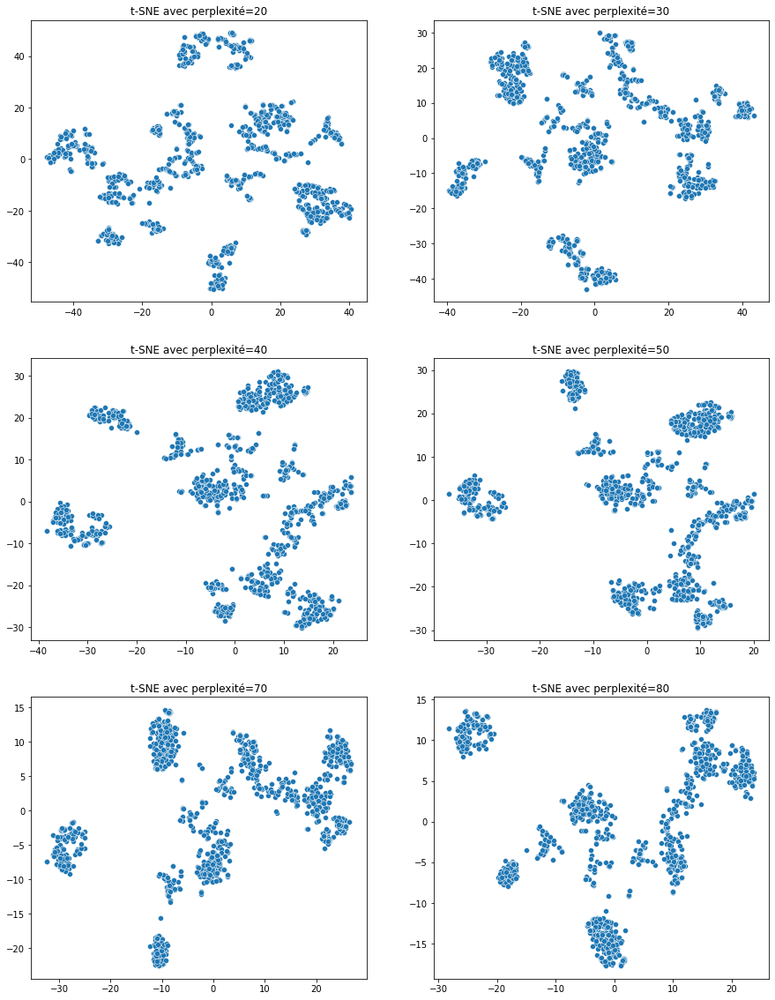

In [66]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_combi, liste_param, 1)

- groupes plus homogènes pour perplexité=40
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [67]:
%pycodestyle_off

In [72]:
# Réduction de dimension tsne
tsne_combi = TSNE(verbose=1, perplexity=40, n_iter=5000)
X_proj_tsne_combi = \
    tsne_combi.fit_transform(df_tsne)
# Dataframe pour clustering
df_tsne_combi = pd.DataFrame({'VAR1' : X_proj_tsne_combi[:, 0],
                              'VAR2' : X_proj_tsne_combi[:, 1],
                              'CATEGORIE' : df_incep_bovw['Categorie_1'],
                              'IMAGE': df_incep_bovw['image'],
                              'IMAGE_LOC': df_incep_bovw['image_loc']})

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.022s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 5.946843
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.316650
[t-SNE] KL divergence after 4050 iterations: 0.344664


In [73]:
%pycodestyle_on

**Clustering**

In [74]:
cols = ['VAR1', 'VAR2']

In [75]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_combi[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_COMBI_USE5_INCEPTIONV3,nan,49492.71484,0.04008,10.00000,400.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49492.71875,0.04812,10.00000,200.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49492.71484,0.08014,20.00000,200.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49492.71094,0.08425,20.00000,300.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49490.53125,0.13194,30.00000,300.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49490.53125,0.13998,30.00000,100.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49490.53125,0.14681,30.00000,400.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49490.53125,0.15921,30.00000,500.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49490.53125,0.24738,50.00000,500.00000,0.64436,0.48926
TSNE_COMBI_USE5_INCEPTIONV3,nan,49490.53125,0.26828,50.00000,100.00000,0.64436,0.48926


In [76]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_combi = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=400,
                           random_state=seed) \
    .fit(df_tsne_combi[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_combi['Clusters'] = kmeans_tsne_combi.labels_
kmeans_tsne_combi_labels = kmeans_tsne_combi.labels_

In [77]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_combi,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_COMBI_USE5_INCEPTIONV3,0.59735,0.66007,0.67388,0.66691


In [78]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,139,13.24000
1,175,16.67000
2,159,15.14000
3,81,7.71000
4,215,20.48000
5,109,10.38000
6,172,16.38000


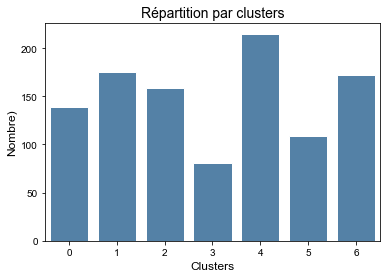

In [79]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_combi_labels)

In [80]:
# Les catégories par clusters
df_tsne_combi.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Beauty and Personal Care          122
         Kitchen & Dining                   10
         Baby Care                           4
         Home Decor & Festive Needs          3
1        Computers                         136
         Home Decor & Festive Needs         19
         Baby Care                           9
         Kitchen & Dining                    6
         Beauty and Personal Care            3
         Home Furnishing                     2
2        Watches                           147
         Computers                           8
         Home Decor & Festive Needs          4
3        Kitchen & Dining                   80
         Baby Care                           1
4        Home Decor & Festive Needs        122
         Kitchen & Dining                   54
         Beauty and Personal Care           22
         Baby Care                          12
         Computers                           4
         Watches                             1
5        Baby Care                          90
         Home Furnishing                    15
         Home Decor & Festive Needs          2
         Beauty and Personal Care            1
         Computers                           1
6        Home Furnishing                   133
         Baby Care                          34
         Beauty and Personal Care            2
         Watches                             2
         Computers                           1

**Visualisation des clusters**

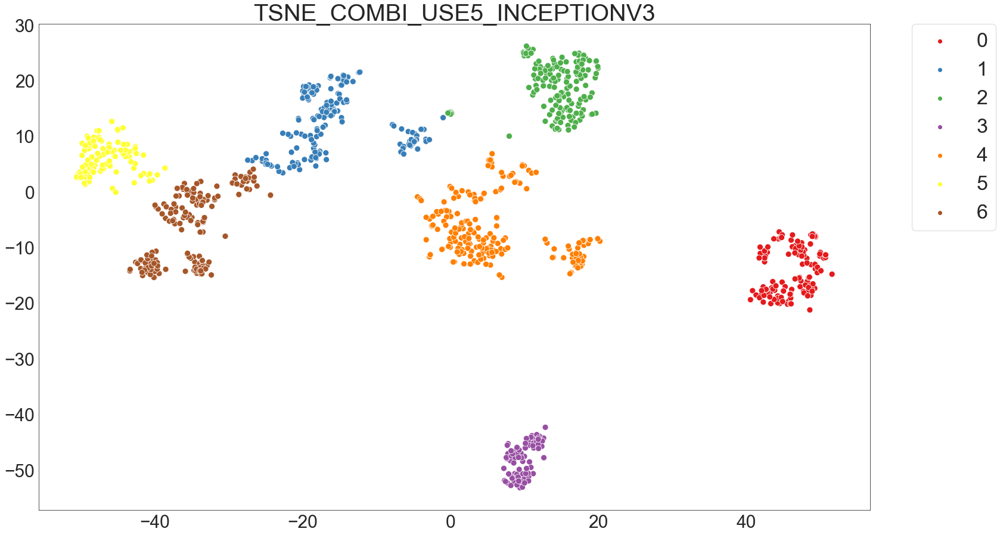

In [81]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_combi,
                                           kmeans_tsne_combi_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est assez haut (0.60).
- Cette combinaison TSNE Combinaison données textuelles produits spécifications lemmatisés avec USE5 et données image avec InceptionV3 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 79%. 

**Qualité de la catégorisation ?**

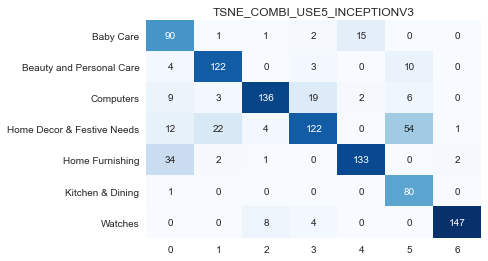

'Précision: 79.05%'

                            precision    recall  f1-score   support

                 Baby Care       0.60      0.83      0.69       109
  Beauty and Personal Care       0.81      0.88      0.84       139
                 Computers       0.91      0.78      0.84       175
Home Decor & Festive Needs       0.81      0.57      0.67       215
           Home Furnishing       0.89      0.77      0.83       172
          Kitchen & Dining       0.53      0.99      0.69        81
                   Watches       0.98      0.92      0.95       159

                  accuracy                           0.79      1050
                 macro avg       0.79      0.82      0.79      1050
              weighted avg       0.82      0.79      0.79      1050


In [83]:
dico_categories = {'0': 'Beauty and Personal Care',
                   '1': 'Computers',
                   '2': 'Watches',
                   '3': 'Kitchen & Dining',
                   '4': 'Home Decor & Festive Needs',
                   '5': 'Baby Care',
                   '6': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_combi,
                                          dico_categories, type_donnee)

In [84]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '79',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [85]:
# Nombre d'erreur
mask = df_tsne_combi['CATEGORIE'] == df_tsne_combi['Cluster_labels']
df_erreur_combi = df_tsne_combi[~mask]
display(f'Nombre d\'erreurs : {df_erreur_combi.shape[0]}')

"Nombre d'erreurs : 220"

**Répartition des erreurs par catégorie**

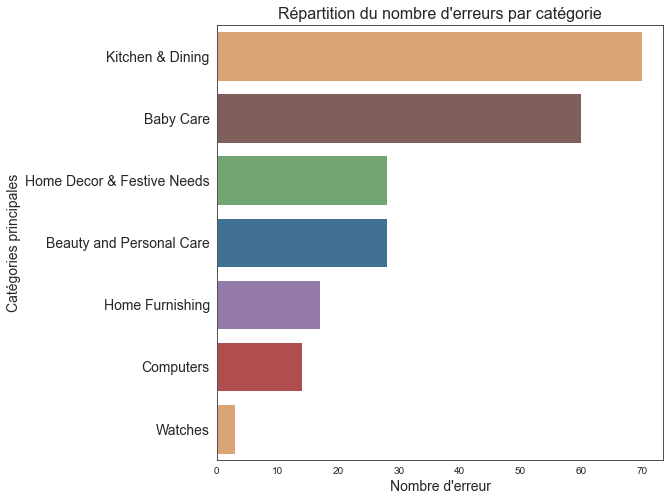

In [86]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_combi, orient='h',
              order=df_erreur_combi['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

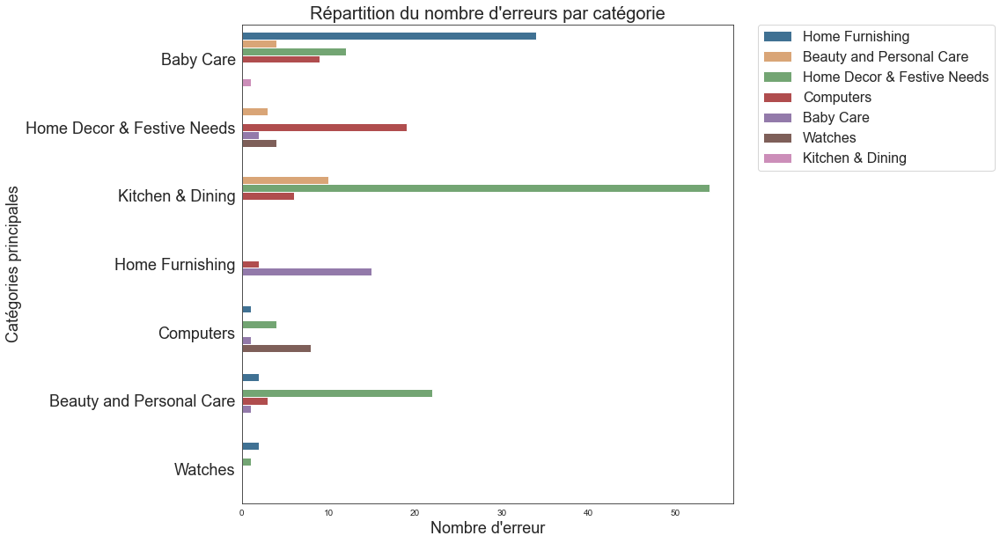

In [87]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_combi, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [88]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [89]:
df_visu_erreur_combi = df_erreur_combi[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_combi.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
1005,Beauty and Personal Care,,Home Decor & Festive Needs
2,Baby Care,,Home Furnishing
1046,Baby Care,,Computers
648,Baby Care,,Home Furnishing
308,Home Decor & Festive Needs,,Computers
301,Beauty and Personal Care,,Computers
427,Computers,,Watches
126,Beauty and Personal Care,,Home Decor & Festive Needs
731,Home Furnishing,,Baby Care
898,Beauty and Personal Care,,Home Decor & Festive Needs


### <span style='background:PowderBlue'>3.13. Comparaison des scores/précisions</span>

In [91]:
# Dataframe de comparaison des scores ARI et de la précision
df_comparaison = df_scores.merge(df_precision, on='Type_données',
                                 how='left')
# Supprime la ligne des types d'objet
df_comparaison['ARI'] = df_comparaison['ARI'].astype(float)
df_comparaison['Homogénéité'] = df_comparaison['Homogénéité'].astype(float)
df_comparaison['Complétude'] = df_comparaison['Complétude'].astype(float)
df_comparaison['V-measure'] = df_comparaison['V-measure'].astype(float)
df_comparaison['Précision'] = df_comparaison['Précision'].astype(float)

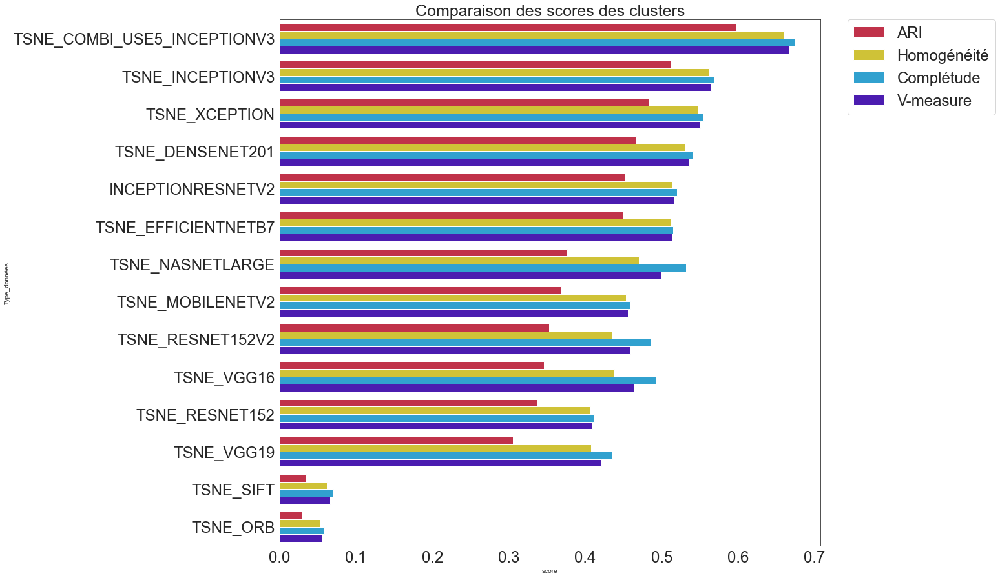

In [93]:
# Comparaison visuelle des algorithmes
df_comp_sort = df_comparaison.sort_values(by='ARI', ascending=False)
comparaison_score_melt = pd.melt(df_comp_sort, id_vars=['Type_données'],
                                 value_name='score',
                                 value_vars=['ARI', 'Homogénéité',
                                             'Complétude', 'V-measure'])
# Visualisation
plt.figure(figsize=(15, 15))
sns.barplot(y=comparaison_score_melt['Type_données'],
            x=comparaison_score_melt['score'],
            hue=comparaison_score_melt['variable'],
            palette=['#d71b3b', '#e8d71e', '#16acea', '#4203c9'])
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.title('Comparaison des scores des clusters', fontsize=25)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.show()

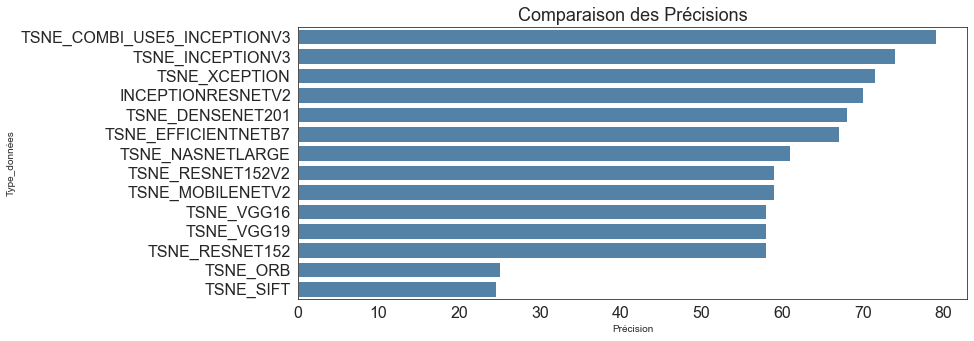

In [97]:
# Visualisation des précisions
df_comp_prec = df_comparaison.sort_values(by='Précision', ascending=False)
plt.figure(figsize=(12, 5))
sns.barplot(x=df_comp_prec['Précision'],
            y=df_comp_prec['Type_données'], color='SteelBlue')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title('Comparaison des Précisions', fontsize=18)
plt.show()

**Bilan** :
- Les algorithmes InceptionV3 (ARI=0.51 et 74% de précision) et Xception (ARI=0.48 et 71.5% de précision), sont les 2 algorithmes les plus performants sur les images et parviennent à classer les images en 7 catégories comme souhaité par le client.
- La combinaison des données textuelles et des images est performante (ARI=0.60 et précision=79 %).

## <span style='background:Thistle'>4. BILAN FINAL CLASSIFICATION NON SUPERVISÉE</span>

### <span style='background:PowderBlue'>4.1. Comparaison des scores ARI/précisions - TEXTES / IMAGES / COMBINAISON</span>

**Données Textuelles**

In [251]:
# Chargement des données de sauvegarde des résultats des scores KMeans
df_scores_textes = pd.read_csv('data_df_scores.csv')
df_scores_textes.shape

(116, 5)

In [252]:
# Ajout du type TEXTE
df_scores_textes['TYPE'] = 'TEXTE'

In [253]:
# Chargement des données de sauvegarde des résultats des précisions de la
# catégorisation
df_precision_textes = pd.read_csv('data_df_precision.csv')
df_precision_textes.shape

(116, 2)

**Données images**

In [254]:
# Chargement des dataframes de sauvegarde des scores
df_scores_img = pd.read_csv('IMAGES_data_df_scores.csv')
df_scores_img.shape

(14, 5)

In [259]:
# Ajout du type IMAGE
df_scores_img['TYPE'] = 'IMAGE'
# Ajout du type COMBINAISON
df_scores_img.loc[13, 'TYPE'] = 'COMBINAISON'

In [141]:
# Chargement des dataframes de sauvegarde des précisions
df_precision_img = pd.read_csv('IMAGES_data_df_precision.csv')
df_precision_img.shape

(14, 2)

**Données textes + images**

In [266]:
# Concaténation des 2 dataframes de scores textes + images
df_precision = pd.concat([df_precision_textes, df_precision_img])
df_precision.shape

(130, 2)

**Comparaison des ARI textes et images**

In [270]:
# Dataframe de comparaison des scores ARI et de la précision
df_comparaison = df_scores.merge(df_precision, on='Type_données',
                                 how='left')
# Supprime la ligne des types d'objet
df_comparaison['ARI'] = df_comparaison['ARI'].astype(float)
df_comparaison['Précision'] = df_comparaison['Précision'].astype(float)

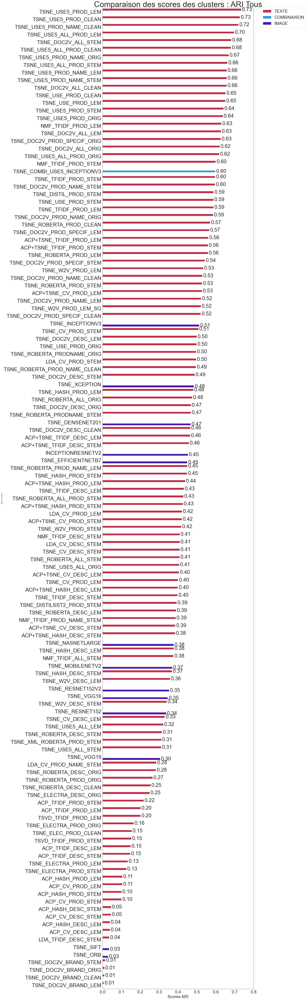

In [343]:
# Comparaison visuelle des algorithmes score ARI Textes + Images
df_comp_sort = df_comparaison.sort_values(by='ARI', ascending=False)
comparaison_score_melt = pd.melt(df_comp_sort, id_vars=['Type_données',
                                                        'TYPE'],
                                 value_name='score',
                                 value_vars=['ARI'])
# Visualisation
fig, ax = plt.subplots(1, 1, figsize=(25, 80))

ax = sns.barplot(y=comparaison_score_melt['Type_données'],
                 x=comparaison_score_melt['score'],
                 hue=comparaison_score_melt['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
ax.set_title('Comparaison des scores des clusters : ARI Tous', fontsize=45)
for p in ax.patches:
    ax.annotate('%.2f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=30)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=30)
plt.xlim(0, 0.8)
plt.xlabel('Scores ARI', fontsize=24)

fig.tight_layout()

plt.show()

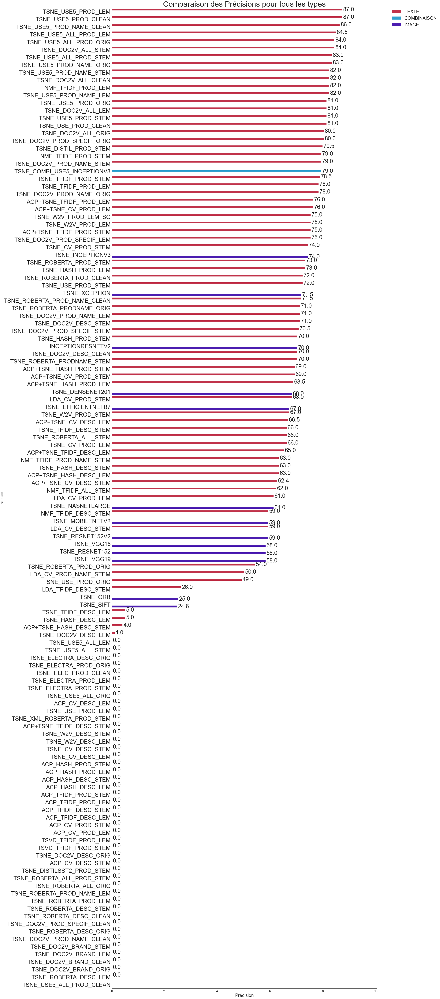

In [364]:
# Visualisation des précisions pour toutes les variables
df_comp_prec = df_comparaison.sort_values(by='Précision', ascending=False)

fig, ax = plt.subplots(1, 1, figsize=(25, 95))

ax = sns.barplot(x=df_comp_prec['Précision'], y=df_comp_prec['Type_données'],
                 hue=df_comp_prec['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
plt.xticks(fontsize=16)
plt.yticks(fontsize=30)
plt.title('Comparaison des Précisions pour tous les types', fontsize=40)

for p in ax.patches:
    ax.annotate('%.1f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=30)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xlim(0, 100)
plt.xlabel('Précision', fontsize=24)

plt.show()

### <span style='background:PowderBlue'>4.2. Comparaison des scores ARI/précisions - Top 5 TEXTES/IMAGES et la COMBINAISON</span>

**Préparation des données**

***Données textuelles***

In [307]:
# Top 5 des scores ARI données textuelles
df_scores_textes_top5 = df_scores_textes.sort_values(by='ARI',
                                                     ascending=False)[0:5]

In [302]:
liste_top5_textes = df_scores_textes_top5['Type_données'].to_list()

In [303]:
# Top 5 des scores ARI données textuelles
df_precision_textes_top5 = \
    df_precision[df_precision['Type_données'].isin(liste_top5_textes)]

In [305]:
df_top5_textes = df_scores_textes_top5.merge(df_precision_textes_top5,
                                             on='Type_données', how='left')

***Données images***

In [310]:
# Top 5 des scores ARI données images
df_scores_img_top5 = df_scores_img[0:-1].sort_values(by='ARI',
                                                     ascending=False)[0:5]

In [311]:
liste_top5_img = df_scores_img_top5['Type_données'].to_list()

In [313]:
# Top 5 des scores ARI données images
df_precision_img_top5 = \
    df_precision[df_precision['Type_données'].isin(liste_top5_img)]

In [316]:
df_top5_img = df_scores_img_top5.merge(df_precision_img_top5,
                                       on='Type_données', how='left')

***Combinaison textes + images***

In [317]:
# Récupération du score ARI de la combinaison TEXTE + IMAGE
df_scores_combi = df_scores_img.tail(1)

In [319]:
# Top 5 des scores ARI données images
df_precision_combi = \
    df_precision[df_precision['Type_données'] == 'TSNE_COMBI_USE5_INCEPTIONV3']

In [320]:
df_combi = df_scores_combi.merge(df_precision_combi, on='Type_données',
                                 how='left')

**Comparaison des scores ARI**

In [388]:
# Dataframe de comparaison des scores ARI et de la précision
df_comparaison_top = pd.concat([df_top5_textes, df_top5_img,
                                df_combi])
# Supprime la ligne des types d'objet
df_comparaison_top['ARI'] = df_comparaison_top['ARI'].astype(float)
df_comparaison_top['Précision'] = df_comparaison_top['Précision'].astype(float)

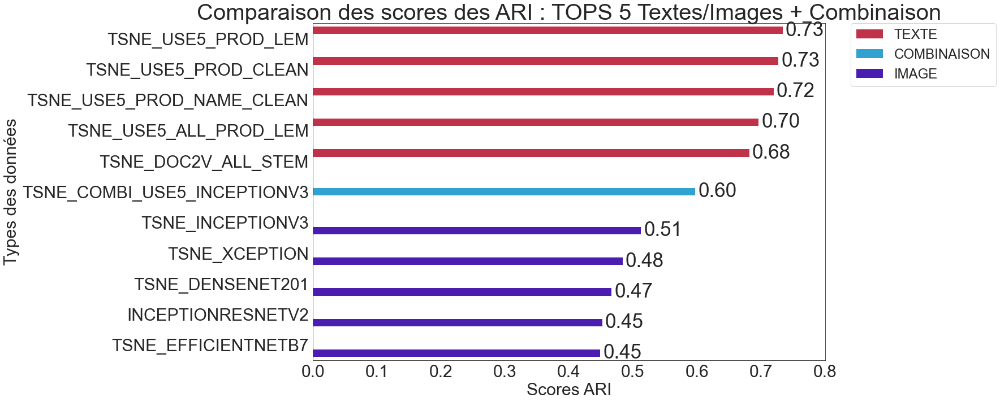

In [390]:
# Comparaison visuelle des algorithmes score ARI Textes + Images
df_comp_top_sort = df_comparaison_top.sort_values(by='ARI', ascending=False)
comparaison_top_score_melt = pd.melt(df_comp_top_sort,
                                     id_vars=['Type_données', 'TYPE'],
                                     value_name='score',
                                     value_vars=['ARI'])
# Visualisation
fig, ax = plt.subplots(1, 1, figsize=(25, 10))

ax = sns.barplot(y=comparaison_top_score_melt['Type_données'],
                 x=comparaison_top_score_melt['score'],
                 hue=comparaison_top_score_melt['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
titre = 'Comparaison des scores des ARI : TOPS 5 Textes/Images + Combinaison'
ax.set_title(titre,
             fontsize=40)
for p in ax.patches:
    ax.annotate('%.2f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=35)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlim(0, 0.8)
plt.xlabel('Scores ARI', fontsize=30)
plt.ylabel('Types des données', fontsize=30)

fig.tight_layout()

plt.show()

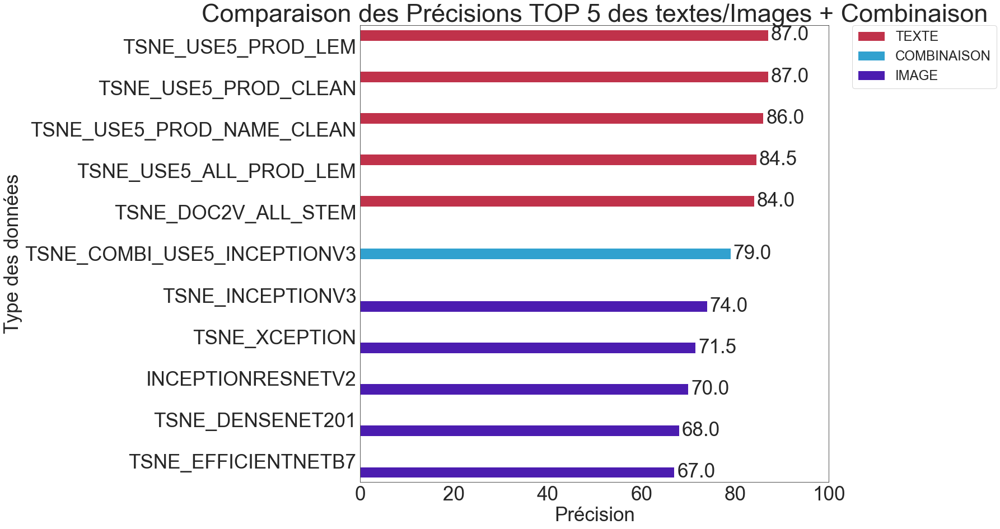

In [391]:
# Visualisation des précisions tops 5 textes/images + combinaison
df_comp_top_prec = df_comparaison_top.sort_values(by='Précision',
                                                  ascending=False)

fig, ax = plt.subplots(1, 1, figsize=(15, 15))

ax = sns.barplot(x=df_comp_top_prec['Précision'],
                 y=df_comp_top_prec['Type_données'],
                 hue=df_comp_top_prec['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
titre = 'Comparaison des Précisions TOP 5 des textes/Images + Combinaison'
plt.title(titre, fontsize=45)

for p in ax.patches:
    ax.annotate('%.1f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=35)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xlim(0, 100)
plt.xlabel('Précision', fontsize=35)
plt.ylabel('Type des données', fontsize=35)

plt.show()